<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/Denmark/DANSKE/DANSKE_1D_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "DANSKE.CO"
data_resample = '1D'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-02,49.28,50.20,48.35,50.20,39.80,875297
2009-01-05,51.36,52.05,50.66,51.13,40.53,1249226
2009-01-06,51.82,52.51,50.66,52.28,41.45,1481986
2009-01-07,52.75,54.37,50.90,52.98,42.00,917488
2009-01-08,51.82,56.68,51.59,55.29,43.84,1464221
2009-01-09,56.22,60.61,55.75,60.61,48.05,1844191
2009-01-12,60.61,65.24,58.30,60.61,48.05,1771178
2009-01-13,60.84,61.07,56.91,58.76,46.59,1393296
2009-01-14,59.92,60.61,56.45,57.14,45.30,612743


,Open,High,Low,Close,Adj Close,Volume
count,2496.000000,2496.000000,2496.000000,2496.000000,2496.000000,2.496000e+03
mean,148.295725,149.703169,146.736887,148.216967,124.494583,1.930118e+06
std,54.843365,54.982454,54.685535,54.813747,51.932659,2.186110e+06
min,31.740000,31.930000,30.540000,31.000000,24.580000,0.000000e+00
25%,106.575000,107.400000,105.600000,106.400000,84.360000,1.249442e+06
50%,133.720000,135.100000,131.870000,133.720000,107.075000,1.660517e+06
75%,190.600000,192.200000,189.012500,190.525000,163.420000,2.223606e+06
max,258.200000,259.500000,257.400000,257.500000,231.310000,9.361722e+07


7

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2496
Total Missing (%),0.0%
Total size in memory,136.6 KiB
Average record size in memory,56.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,4


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

36

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Adj Close,Volume,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_

140241

In [8]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,5 hours 52 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 5 days
H2O cluster name:,H2O_from_python_unknownUser_pbkgha
H2O cluster total nodes:,1
H2O cluster free memory:,8.34 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.592375,6.101431,0.444314,0.681693,0.464706
1,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.579465,7.594299,0.488963,0.686260,0.470952
2,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.578528,5.707427,0.441472,0.647124,0.418770
3,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.576990,5.860243,0.439967,0.662954,0.439508
4,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.546522,5.277916,0.500000,0.585003,0.342229
5,DeepLearning_1_AutoML_20190824_200751,0.513512,5.808779,0.489465,0.621668,0.386471
6,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.500000,0.704522,0.500000,0.505632,0.255663
7,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.500000,0.702512,0.500000,0.504646,0.254668
8,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.498595,0.701987,0.496154,0.504387,0.254407
9,DeepLearning_grid_1_AutoML_20190824_200751_mod...,0.480870,0.708157,0.500000,0.507389,0.257443


,variable,relative_importance,scaled_importance,percentage
0,CDLIDENTICAL3CROWS,1.000000,1.000000,0.002394
1,CDL2CROWS,0.992845,0.992845,0.002377
2,CDL3LINESTRIKE,0.981951,0.981951,0.002351
3,CDLKICKING,0.956624,0.956624,0.002290
4,CDLCOUNTERATTACK,0.940957,0.940957,0.002253
5,CDLINNECK,0.934945,0.934945,0.002238
6,CDLPIERCING,0.908133,0.908133,0.002174
7,TAN,0.897086,0.897086,0.002148
8,CDLTASUKIGAP,0.883471,0.883471,0.002115
9,CDLSTICKSANDWICH,0.877052,0.877052,0.002100


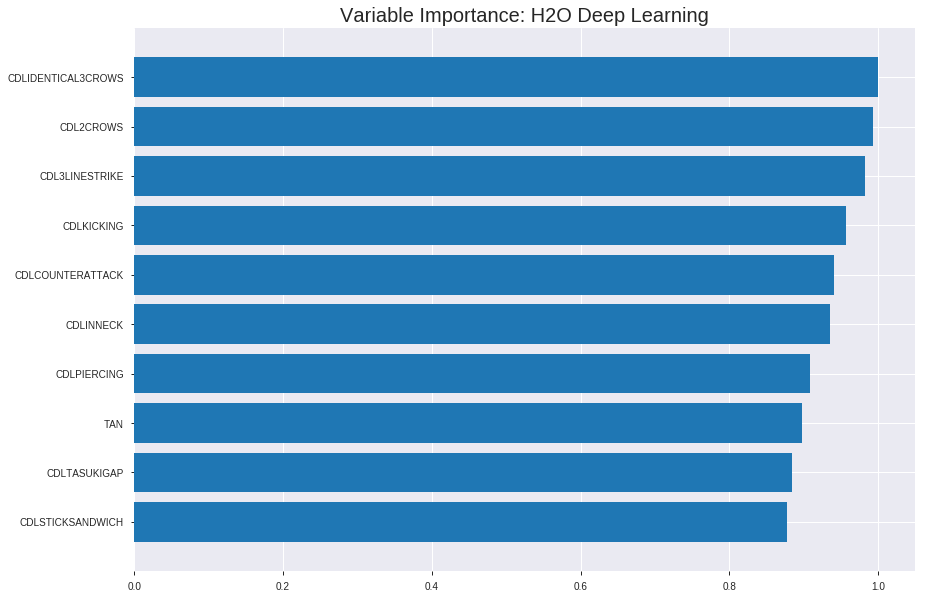

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_200751_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2342848019604998
RMSE: 0.4840297531769094
LogLoss: 0.8439032557045636
Mean Per-Class Error: 0.3304028369727987
AUC: 0.7178667028693357
pr_auc: 0.65684230321615
Gini: 0.4357334057386715
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2469570533368382: 


,0,1,Error,Rate
0,277.0,527.0,0.6555,(527.0/804.0)
1,49.0,858.0,0.054,(49.0/907.0)
Total,326.0,1385.0,0.3366,(576.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2469571,0.7486911,306.0
max f2,0.1221191,0.8675048,353.0
max f0point5,0.5105670,0.6863129,208.0
max accuracy,0.4734141,0.6767972,220.0
max precision,0.9914344,0.7388889,9.0
max recall,0.0444346,1.0,381.0
max specificity,0.9998802,0.9776119,0.0
max absolute_mcc,0.3077683,0.3726811,281.0
max min_per_class_accuracy,0.6493905,0.6482911,159.0
max mean_per_class_accuracy,0.4936748,0.6695972,213.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 60.75 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.9999873,1.2576259,1.2576259,0.6666667,0.9999947,0.6666667,0.9999947,0.0132304,0.0132304,25.7625873,25.7625873
,2,0.0204559,0.9999132,1.1096699,1.1857615,0.5882353,0.9999507,0.6285714,0.9999733,0.0110254,0.0242558,10.9669888,18.5761537
,3,0.0303916,0.9996863,1.3316039,1.2334408,0.7058824,0.9997788,0.6538462,0.9999097,0.0132304,0.0374862,33.1603865,23.3440760
,4,0.0403273,0.9990986,1.6645048,1.3396450,0.8823529,0.9994105,0.7101449,0.9997867,0.0165380,0.0540243,66.4504832,33.9644952
,5,0.0502630,0.9983326,1.3316039,1.3380554,0.7058824,0.9987363,0.7093023,0.9995791,0.0132304,0.0672547,33.1603865,33.8055434
,6,0.1005260,0.9916351,1.4038614,1.3709584,0.7441860,0.9957589,0.7267442,0.9976690,0.0705623,0.1378170,40.3861439,37.0958437
,7,0.1502046,0.9798215,1.3759907,1.3726228,0.7294118,0.9862469,0.7276265,0.9938913,0.0683572,0.2061742,37.5990661,37.2622791
,8,0.2004676,0.9590246,1.2941848,1.3529561,0.6860465,0.9706319,0.7172012,0.9880595,0.0650496,0.2712238,29.4184764,35.2956114
,9,0.3004091,0.8915159,1.3348485,1.3469320,0.7076023,0.9256740,0.7140078,0.9673048,0.1334068,0.4046307,33.4848514,34.6931990
,10,0.4003507,0.7942886,1.2245305,1.3163763,0.6491228,0.8435096,0.6978102,0.9364012,0.1223815,0.5270121,22.4530455,31.6376279




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.4243175820255527
RMSE: 0.6513966395565398
LogLoss: 9.081304240856936
Mean Per-Class Error: 0.5
AUC: 0.45020091848450056
pr_auc: 0.2816096949039053
Gini: -0.09959816303099889
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.014468694384585982: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0144687,0.7080581,243.0
max f2,0.0144687,0.8584241,243.0
max f0point5,0.0144687,0.6025180,243.0
max accuracy,0.0144687,0.5480573,243.0
max precision,0.0144687,0.5480573,243.0
max recall,0.0144687,1.0,243.0
max specificity,1.0000000,0.4524887,0.0
max absolute_mcc,0.2895098,0.1197464,169.0
max min_per_class_accuracy,1.0000000,0.4524887,0.0
max mean_per_class_accuracy,0.0144687,0.5,243.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 77.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.4989775,1.0,0.9272694,0.9272694,0.5081967,1.0,0.5081967,1.0,0.4626866,0.4626866,-7.2730609,-7.2730609
,2,0.5010225,1.0000000,0.0,0.9234846,0.0,1.0000000,0.5061224,1.0,0.0,0.4626866,-100.0,-7.6515382
,3,0.5991820,0.8967475,1.1784049,0.9652463,0.6458333,0.9460543,0.5290102,0.9911625,0.1156716,0.5783582,17.8404851,-3.4753706
,4,0.6993865,0.6603209,0.8564575,0.9496596,0.4693878,0.8012433,0.5204678,0.9639518,0.0858209,0.6641791,-14.3542492,-5.0340403
,5,0.7995910,0.3810003,1.0054066,0.9566458,0.5510204,0.5266245,0.5242967,0.9091461,0.1007463,0.7649254,0.5406640,-4.3354201
,6,0.8997955,0.2250870,1.0426439,0.9662229,0.5714286,0.2961779,0.5295455,0.8408837,0.1044776,0.8694030,4.2643923,-3.3777137
,7,1.0,0.0144687,1.3033049,1.0,0.7142857,0.1467662,0.5480573,0.7713301,0.1305970,1.0,30.3304904,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:13:59,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 20:14:04,7.517 sec,143 obs/sec,0.3997662,1,684.0,0.6745711,4.5213912,-0.8268047,0.5076026,0.4443261,1.2576259,0.4699006,0.7403053,13.5225002,-1.2126485,0.5463970,0.6030503,1.8246269,0.4519427
,2019-08-24 20:14:31,34.629 sec,156 obs/sec,2.6662770,7,4562.0,0.6268382,1.6466466,-0.5774208,0.5818283,0.5799326,1.2576259,0.4699006,0.6415125,9.3971314,-0.6615021,0.5568988,0.6009487,1.0947761,0.4519427
,2019-08-24 20:14:59,1 min 3.031 sec,166 obs/sec,5.3448276,14,9145.0,0.5281097,0.8478185,-0.1196571,0.6420866,0.6710585,1.8864388,0.4617183,0.6684224,9.4088310,-0.8038179,0.5433241,0.5818154,1.0947761,0.4519427
,2019-08-24 20:15:27,1 min 30.550 sec,174 obs/sec,8.1233197,21,13899.0,0.6000988,1.7872785,-0.4457136,0.5857516,0.5755975,1.5720323,0.4699006,0.7253154,10.7706413,-1.1239508,0.4447896,0.2800182,0.9233942,0.4519427
,2019-08-24 20:15:56,1 min 59.751 sec,180 obs/sec,11.2361192,29,19225.0,0.5414906,1.0815091,-0.1771141,0.6515226,0.6344971,1.6768345,0.4447691,0.7150077,10.1102237,-1.0640113,0.5356926,0.5867627,1.4597015,0.4519427
,2019-08-24 20:16:25,2 min 28.642 sec,185 obs/sec,14.3898305,37,24621.0,0.4840298,0.8439033,0.0594524,0.7178667,0.6568423,1.2576259,0.3366452,0.6513966,9.0813042,-0.7130959,0.4502009,0.2816097,0.9272694,0.4519427
,2019-08-24 20:16:53,2 min 56.644 sec,190 obs/sec,17.5651666,45,30054.0,0.4934321,0.7416276,0.0225570,0.7571740,0.7767299,1.8864388,0.3571011,0.6763356,9.2707499,-0.8467802,0.4522523,0.2825689,0.9234846,0.4519427
,2019-08-24 20:17:21,3 min 24.533 sec,193 obs/sec,20.6487434,53,35330.0,0.4743449,0.7197643,0.0967142,0.7578988,0.7492257,1.8864388,0.3237873,0.6728925,9.2384313,-0.8280244,0.4584825,0.2859919,0.9272694,0.4519427
,2019-08-24 20:17:47,3 min 50.972 sec,196 obs/sec,23.7580362,61,40650.0,0.4328240,0.5625776,0.2479280,0.8469292,0.8550031,1.8864388,0.2706020,0.6645009,9.4386123,-0.7827146,0.5284831,0.5627531,0.7298507,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLIDENTICAL3CROWS,1.0,1.0,0.0023941
CDL2CROWS,0.9928454,0.9928454,0.0023770
CDL3LINESTRIKE,0.9819508,0.9819508,0.0023509
CDLKICKING,0.9566242,0.9566242,0.0022902
CDLCOUNTERATTACK,0.9409575,0.9409575,0.0022527
---,---,---,---
TSF_30,0.3564470,0.3564470,0.0008534
BBANDS_middleband_12_6_3,0.3559083,0.3559083,0.0008521
BBANDS_middleband_24_7_4,0.3542220,0.3542220,0.0008480
TRIMA_8,0.3531484,0.3531484,0.0008455



See the whole table with table.as_data_frame()


('accuracy', 0.6)

('F1', 0.658753709198813)

('auc', 0.5923745819397993)

('logloss', 6.101431448395154)

('mean_per_class_error', 0.40250836120401345)

('rmse', 0.6816932337058866)

('mse', 0.4647056648803886)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


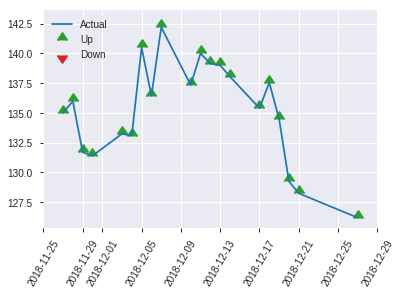


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.4647056648803886
RMSE: 0.6816932337058866
LogLoss: 6.101431448395154
Mean Per-Class Error: 0.40250836120401345
AUC: 0.5923745819397993
pr_auc: 0.33318135004474847
Gini: 0.1847491638795986
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.8074833273286854: 


,0,1,Error,Rate
0,19.0,111.0,0.8538,(111.0/130.0)
1,4.0,111.0,0.0348,(4.0/115.0)
Total,23.0,222.0,0.4694,(115.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.8074833,0.6587537,146.0
max f2,0.5397154,0.8190883,166.0
max f0point5,0.9913468,0.5724508,35.0
max accuracy,0.9923021,0.6,29.0
max precision,0.9923021,0.5809524,29.0
max recall,0.5397154,1.0,166.0
max specificity,1.0000000,0.7384615,0.0
max absolute_mcc,0.9913468,0.1954808,35.0
max min_per_class_accuracy,0.9902943,0.5826087,43.0
max mean_per_class_accuracy,0.9913468,0.5974916,35.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 94.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.3061224,1.0,1.1646377,1.1646377,0.5466667,1.0,0.5466667,1.0,0.3565217,0.3565217,16.4637681,16.4637681
,2,0.4,0.9934441,1.3894140,1.2173913,0.6521739,0.9966790,0.5714286,0.9992206,0.1304348,0.4869565,38.9413989,21.7391304
,3,0.5020408,0.9883933,0.9373913,1.1604807,0.44,0.9912739,0.5447154,0.9976054,0.0956522,0.5826087,-6.2608696,16.0480735
,4,0.6,0.9773620,0.7989130,1.1014493,0.375,0.9826157,0.5170068,0.9951581,0.0782609,0.6608696,-20.1086957,10.1449275
,5,0.6979592,0.9497700,0.8876812,1.0714467,0.4166667,0.9660938,0.5029240,0.9910789,0.0869565,0.7478261,-11.2318841,7.1446733
,6,0.8,0.9030334,0.8521739,1.0434783,0.4,0.9262566,0.4897959,0.9828107,0.0869565,0.8347826,-14.7826087,4.3478261
,7,0.8979592,0.8140817,1.2427536,1.0652174,0.5833333,0.8643302,0.5,0.9698856,0.1217391,0.9565217,24.2753623,6.5217391
,8,1.0,0.2628533,0.4260870,1.0,0.2,0.6794758,0.4693878,0.9402519,0.0434783,1.0,-57.3913043,0.0


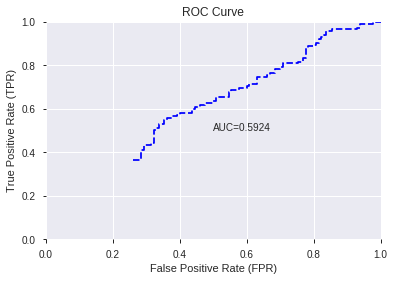

This function is available for GLM models only


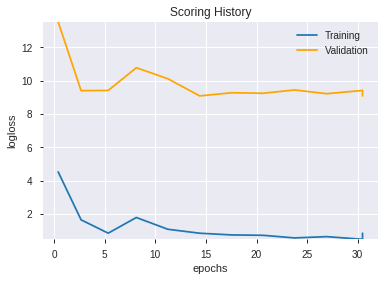

--2019-08-24 20:40:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.21.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.21.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


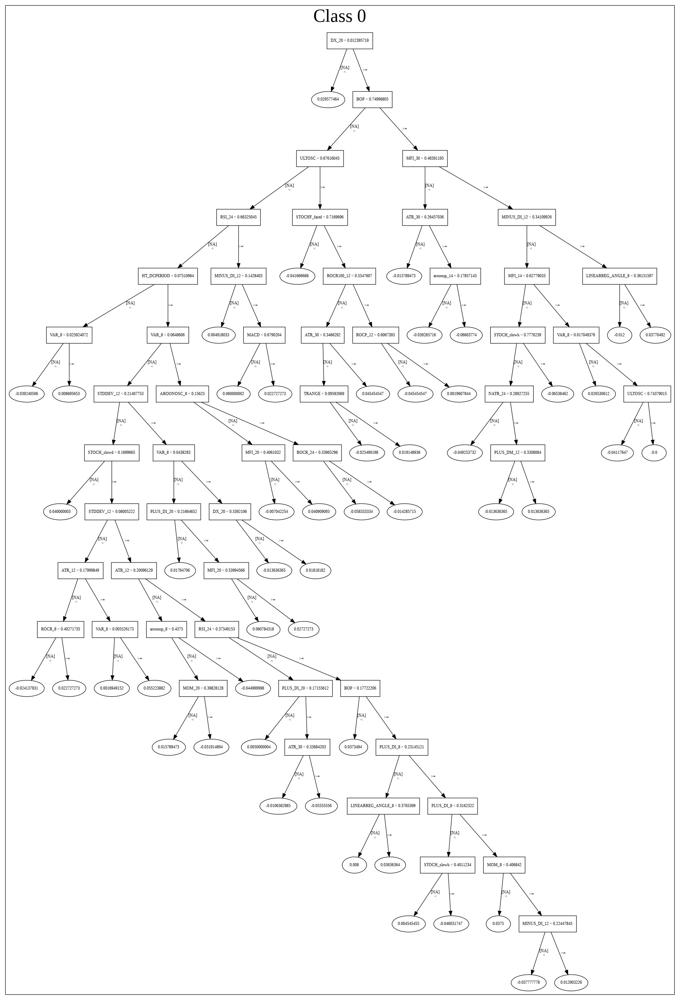

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_200751_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_200751_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [10]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_204021_model_3,0.565753,5.384866,0.500000,0.576924,0.332841
1,DeepLearning_grid_1_AutoML_20190824_204021_model_5,0.562709,5.229849,0.500000,0.572428,0.327674
2,DeepLearning_grid_1_AutoML_20190824_204021_model_2,0.558662,5.891019,0.500000,0.589952,0.348044
3,DeepLearning_1_AutoML_20190824_204021,0.551304,5.645516,0.496154,0.588024,0.345772
4,DeepLearning_grid_1_AutoML_20190824_204021_model_7,0.550970,5.414507,0.500000,0.593681,0.352457
5,DeepLearning_grid_1_AutoML_20190824_204021_model_1,0.544682,6.276253,0.500000,0.604494,0.365413
6,DeepLearning_grid_1_AutoML_20190824_204021_model_9,0.500000,0.754279,0.500000,0.528594,0.279411
7,DeepLearning_grid_1_AutoML_20190824_204021_model_6,0.492174,6.060124,0.500000,0.595703,0.354862
8,DeepLearning_grid_1_AutoML_20190824_204021_model_8,0.491639,0.715745,0.500000,0.511053,0.261176
9,DeepLearning_grid_1_AutoML_20190824_204021_model_4,0.481204,6.763181,0.500000,0.603609,0.364344


,variable,relative_importance,scaled_importance,percentage
0,CDLTHRUSTING,1.000000,1.000000,0.035614
1,CDLSTICKSANDWICH,0.981488,0.981488,0.034955
2,CDLLADDERBOTTOM,0.888299,0.888299,0.031636
3,CDLINNECK,0.874086,0.874086,0.031130
4,CDLKICKING,0.865538,0.865538,0.030825
5,CDLEVENINGDOJISTAR,0.816183,0.816183,0.029067
6,CDLPIERCING,0.811005,0.811005,0.028883
7,CDLUNIQUE3RIVER,0.796939,0.796939,0.028382
8,CDLMORNINGDOJISTAR,0.792668,0.792668,0.028230
9,CDLONNECK,0.782712,0.782712,0.027875


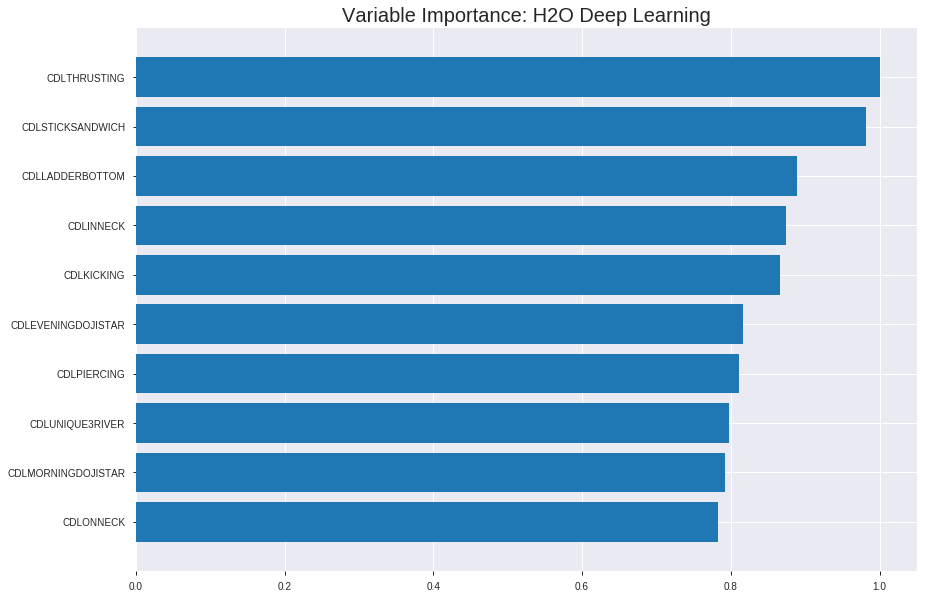

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_204021_model_3


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.242788400569891
RMSE: 0.49273562949099897
LogLoss: 0.699105688368701
Mean Per-Class Error: 0.4094323037513645
AUC: 0.618694016137614
pr_auc: 0.6200891917066873
Gini: 0.23738803227522798
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3697888320230367: 


,0,1,Error,Rate
0,87.0,717.0,0.8918,(717.0/804.0)
1,36.0,871.0,0.0397,(36.0/907.0)
Total,123.0,1588.0,0.4401,(753.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3697888,0.6981964,325.0
max f2,0.0551952,0.8497653,389.0
max f0point5,0.4872592,0.6179473,246.0
max accuracy,0.4888647,0.5932203,245.0
max precision,0.9947450,0.9565217,3.0
max recall,0.0149762,1.0,397.0
max specificity,0.9999224,0.9987562,0.0
max absolute_mcc,0.5249824,0.1811354,212.0
max min_per_class_accuracy,0.5292606,0.5865491,207.0
max mean_per_class_accuracy,0.5249824,0.5905677,212.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 54.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.9995537,1.7816367,1.7816367,0.9444444,0.9999224,0.9444444,0.9999224,0.0187431,0.0187431,78.1636653,78.1636653
,2,0.0204559,0.9852038,1.4425709,1.6169476,0.7647059,0.9913497,0.8571429,0.9957585,0.0143330,0.0330761,44.2570854,61.6947551
,3,0.0303916,0.9643602,1.1096699,1.4511068,0.5882353,0.9748295,0.7692308,0.9889164,0.0110254,0.0441014,10.9669888,45.1106776
,4,0.0403273,0.9135927,1.1096699,1.3669846,0.5882353,0.9391556,0.7246377,0.9766565,0.0110254,0.0551268,10.9669888,36.6984644
,5,0.0502630,0.8748964,1.3316039,1.3599908,0.7058824,0.8922729,0.7209302,0.9599760,0.0132304,0.0683572,33.1603865,35.9990769
,6,0.1005260,0.7485570,1.3599908,1.3599908,0.7209302,0.8075862,0.7209302,0.8837811,0.0683572,0.1367144,35.9990769,35.9990769
,7,0.1502046,0.6681433,1.2650237,1.3285814,0.6705882,0.7030586,0.7042802,0.8240091,0.0628445,0.1995590,26.5023672,32.8581418
,8,0.2004676,0.6322715,0.9651547,1.2374599,0.5116279,0.6480678,0.6559767,0.7798955,0.0485116,0.2480706,-3.4845260,23.7459860
,9,0.3004091,0.5900677,1.1362760,1.2037975,0.6023392,0.6121539,0.6381323,0.7240904,0.1135612,0.3616318,13.6276008,20.3797528
,10,0.4003507,0.5522151,1.1804032,1.1979575,0.6257310,0.5712648,0.6350365,0.6859398,0.1179713,0.4796031,18.0403232,19.7957492




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.3889991260061908
RMSE: 0.6236979445261871
LogLoss: 8.951415389218182
Mean Per-Class Error: 0.4997636253123523
AUC: 0.4487742284054839
pr_auc: 0.282571620774116
Gini: -0.10245154318903216
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.008385731674602794: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0083857,0.7080581,245.0
max f2,0.0083857,0.8584241,245.0
max f0point5,0.0083857,0.6025180,245.0
max accuracy,0.0083857,0.5480573,245.0
max precision,0.3608730,0.5481799,223.0
max recall,0.0083857,1.0,245.0
max specificity,1.0,0.4570136,0.0
max absolute_mcc,0.5268539,0.1233792,133.0
max min_per_class_accuracy,1.0,0.4570136,0.0
max mean_per_class_accuracy,0.3608730,0.5002364,223.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 77.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.4989775,1.0,0.9272694,0.9272694,0.5081967,1.0,0.5081967,1.0,0.4626866,0.4626866,-7.2730609,-7.2730609
,2,0.5010225,0.9999997,0.0,0.9234846,0.0,0.9999997,0.5061224,1.0000000,0.0,0.4626866,-100.0,-7.6515382
,3,0.5991820,0.6676377,0.9883396,0.9341093,0.5416667,0.8311082,0.5119454,0.9723317,0.0970149,0.5597015,-1.1660448,-6.5890683
,4,0.6993865,0.5493736,1.0054066,0.9443244,0.5510204,0.5985442,0.5175439,0.9187774,0.1007463,0.6604478,0.5406640,-5.5675570
,5,0.7995910,0.5152986,1.0798812,0.9613124,0.5918367,0.5311794,0.5268542,0.8702037,0.1082090,0.7686567,7.9881206,-3.8687636
,6,0.8997955,0.4366635,1.2288303,0.9911041,0.6734694,0.4847813,0.5431818,0.8272817,0.1231343,0.8917910,22.8830338,-0.8895862
,7,1.0,0.0083857,1.0798812,1.0,0.5918367,0.3380712,0.5480573,0.7782606,0.1082090,1.0,7.9881206,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:41:33,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 20:41:35,1 min 12.978 sec,5861 obs/sec,8.8316774,1,15111.0,0.5289970,0.9103610,-0.1234226,0.5552317,0.5597530,1.6768345,0.4593805,0.6454969,9.4986903,-0.6822051,0.5221179,0.5502605,1.0947761,0.4519427
,2019-08-24 20:41:41,1 min 18.744 sec,7323 obs/sec,35.3407364,4,60468.0,0.5025599,0.7886439,-0.0139400,0.5995361,0.5988164,1.5720323,0.4371712,0.6308988,9.1795441,-0.6069785,0.4449753,0.2691987,0.9196708,0.4519427
,2019-08-24 20:41:47,1 min 24.505 sec,8687 obs/sec,70.7054354,8,120977.0,0.4951001,0.7148658,0.0159374,0.6113493,0.6112785,1.7816367,0.4441847,0.6260219,9.0726728,-0.5822302,0.4424934,0.2793270,0.9233942,0.4519427
,2019-08-24 20:41:52,1 min 29.656 sec,9554 obs/sec,106.0590298,12,181467.0,0.4994743,0.7461428,-0.0015277,0.6027936,0.6026300,1.6768345,0.4471070,0.6259194,9.1373284,-0.5817125,0.4419362,0.2727311,0.9196708,0.4519427
,2019-08-24 20:41:58,1 min 35.697 sec,10306 obs/sec,150.2817066,17,257132.0,0.4927356,0.6991057,0.0253142,0.6186940,0.6200892,1.7816367,0.4400935,0.6236979,8.9514154,-0.5705048,0.4487742,0.2825716,0.9272694,0.4519427
,2019-08-24 20:42:04,1 min 41.598 sec,10816 obs/sec,194.4646406,22,332729.0,0.4987067,0.7536144,0.0015484,0.6075788,0.6005991,1.6768345,0.4436002,0.6246084,9.1407529,-0.5750931,0.4472969,0.2721959,0.9269104,0.4519427
,2019-08-24 20:42:04,1 min 41.688 sec,10814 obs/sec,194.4646406,22,332729.0,0.4927356,0.6991057,0.0253142,0.6186940,0.6200892,1.7816367,0.4400935,0.6236979,8.9514154,-0.5705048,0.4487742,0.2825716,0.9272694,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTHRUSTING,1.0,1.0,0.0356139
CDLSTICKSANDWICH,0.9814883,0.9814883,0.0349546
CDLLADDERBOTTOM,0.8882989,0.8882989,0.0316358
CDLINNECK,0.8740861,0.8740861,0.0311296
CDLKICKING,0.8655376,0.8655376,0.0308252
---,---,---,---
is_month_start,0.3002623,0.3002623,0.0106935
CDL3INSIDE,0.2999784,0.2999784,0.0106834
CDLDRAGONFLYDOJI,0.2962977,0.2962977,0.0105523
CDLHIKKAKE,0.2960329,0.2960329,0.0105429



See the whole table with table.as_data_frame()


('accuracy', 0.5836734693877551)

('F1', 0.6388888888888888)

('auc', 0.5657525083612039)

('logloss', 5.384866203454548)

('mean_per_class_error', 0.4148829431438127)

('rmse', 0.5769241317378643)

('mse', 0.3328414537814886)

deeplearning prediction progress: |███████████████████████████████████████| 100%


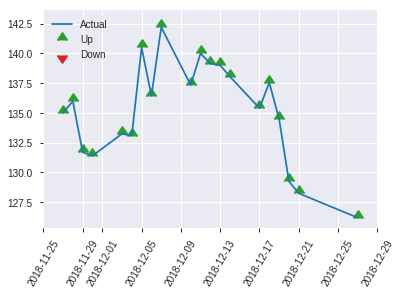


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.3328414537814886
RMSE: 0.5769241317378643
LogLoss: 5.384866203454548
Mean Per-Class Error: 0.4148829431438127
AUC: 0.5657525083612039
pr_auc: 0.32765592697788287
Gini: 0.13150501672240789
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.008361262575256384: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0083613,0.6388889,170.0
max f2,0.0083613,0.8156028,170.0
max f0point5,0.5799061,0.5617978,52.0
max accuracy,0.6197556,0.5836735,38.0
max precision,0.9999963,0.5584416,2.0
max recall,0.0083613,1.0,170.0
max specificity,1.0000000,0.7384615,0.0
max absolute_mcc,0.5799061,0.1700295,52.0
max min_per_class_accuracy,0.5913943,0.5692308,47.0
max mean_per_class_accuracy,0.5799061,0.5851171,52.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 68.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.2979592,1.0,1.1381775,1.1381775,0.5342466,1.0,0.5342466,1.0,0.3391304,0.3391304,13.8177487,13.8177487
,2,0.3020408,1.0000000,2.1304348,1.1515864,1.0,1.0000000,0.5405405,1.0,0.0086957,0.3478261,113.0434783,15.1586369
,3,0.4,0.6686084,1.1539855,1.1521739,0.5416667,0.8683774,0.5408163,0.9677659,0.1130435,0.4608696,15.3985507,15.2173913
,4,0.5020408,0.5852361,1.1078261,1.1431601,0.52,0.6259711,0.5365854,0.8982954,0.1130435,0.5739130,10.7826087,14.3160127
,5,0.6,0.5503892,0.9764493,1.1159420,0.4583333,0.5698566,0.5238095,0.8446727,0.0956522,0.6695652,-2.3550725,11.5942029
,6,0.6979592,0.5235969,0.4438406,1.0216120,0.2083333,0.5378737,0.4795322,0.8016132,0.0434783,0.7130435,-55.6159420,2.1612001
,7,0.8,0.4795560,0.8521739,1.0,0.4,0.5085017,0.4693878,0.7642265,0.0869565,0.8,-14.7826087,0.0
,8,0.8979592,0.4242826,1.0652174,1.0071146,0.5,0.4506158,0.4727273,0.7300145,0.1043478,0.9043478,6.5217391,0.7114625
,9,1.0,0.0083613,0.9373913,1.0,0.44,0.3326706,0.4693878,0.6894692,0.0956522,1.0,-6.2608696,0.0


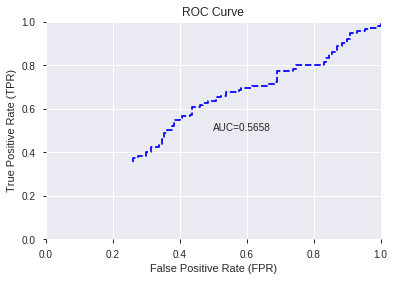

This function is available for GLM models only


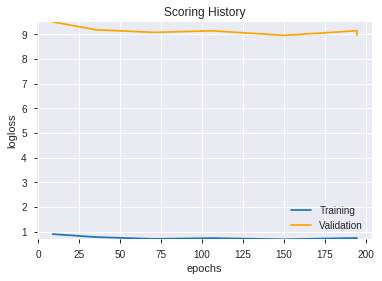

--2019-08-24 20:48:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.10.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.10.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


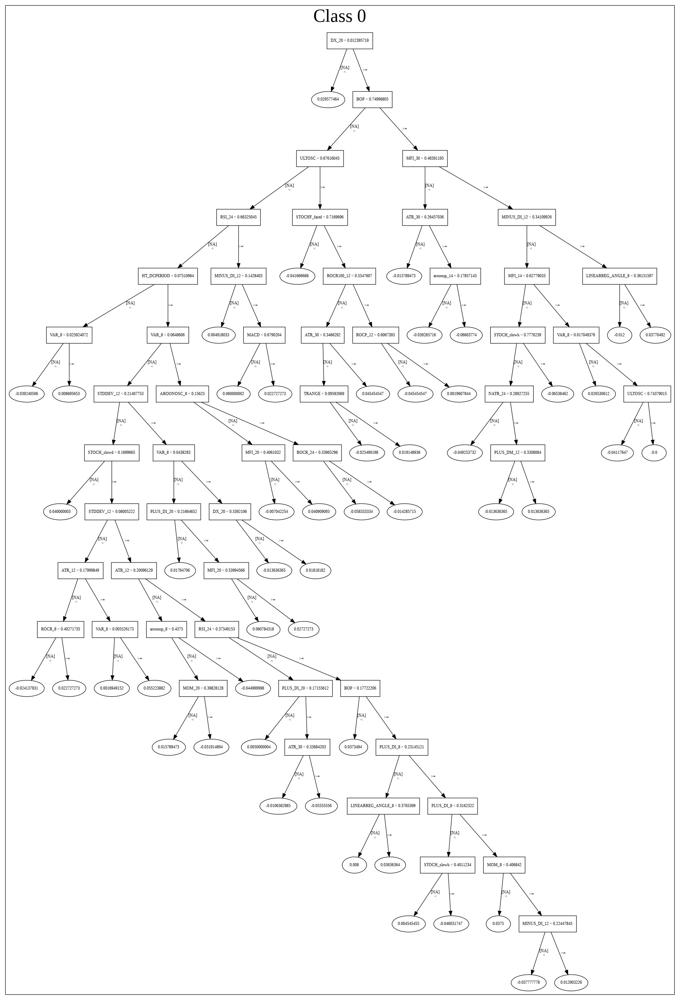

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_204021_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_204021_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLTHRUSTING',
 'CDLSTICKSANDWICH',
 'CDLLADDERBOTTOM',
 'CDLINNECK',
 'CDLKICKING',
 'CDLEVENINGDOJISTAR',
 'CDLPIERCING',
 'CDLUNIQUE3RIVER',
 'CDLMORNINGDOJISTAR',
 'CDLONNECK',
 'EXP',
 'SINH',
 'CDLCOUNTERATTACK',
 'COSH',
 'CDL2CROWS',
 'CDL3LINESTRIKE',
 'CDLSTALLEDPATTERN',
 'CDLIDENTICAL3CROWS',
 'CDLSEPARATINGLINES',
 'CDLEVENINGSTAR',
 'CDLADVANCEBLOCK',
 'CDLTASUKIGAP',
 'CDLGAPSIDESIDEWHITE',
 'TAN',
 'is_quarter_start',
 'CDLSHOOTINGSTAR',
 'COS',
 'is_quarter_end',
 'SIN',
 'CDLHOMINGPIGEON',
 'HT_TRENDMODE',
 'CDLMORNINGSTAR',
 'CDLXSIDEGAP3METHODS',
 'CDLINVERTEDHAMMER',
 'CDLDARKCLOUDCOVER',
 'day',
 'weekday_name',
 'days_in_month',
 'CDLMATCHINGLOW',
 'CDLGRAVESTONEDOJI',
 'dayofweek',
 'weekday',
 'CDLTAKURI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'is_month_start',
 'CDL3INSIDE',
 'CDLDRAGONFLYDOJI',
 'CDLHIKKAKE',
 'is_month_end']

In [11]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_204838_model_1,0.487793,6.075592,0.5,0.587453,0.345101


,variable,relative_importance,scaled_importance,percentage
0,CDLXSIDEGAP3METHODS,0.009191,1.000000,0.048084
1,is_month_start,0.008545,0.929745,0.044706
2,CDLSTICKSANDWICH,0.008492,0.924011,0.044430
3,CDLMATCHINGLOW,0.008027,0.873370,0.041995
4,CDLTHRUSTING,0.007628,0.829934,0.039906
5,is_quarter_start,0.006841,0.744380,0.035793
6,CDLSHOOTINGSTAR,0.006669,0.725593,0.034889
7,CDLLADDERBOTTOM,0.005875,0.639212,0.030736
8,CDLKICKING,0.005350,0.582119,0.027990
9,CDLINNECK,0.005258,0.572080,0.027508


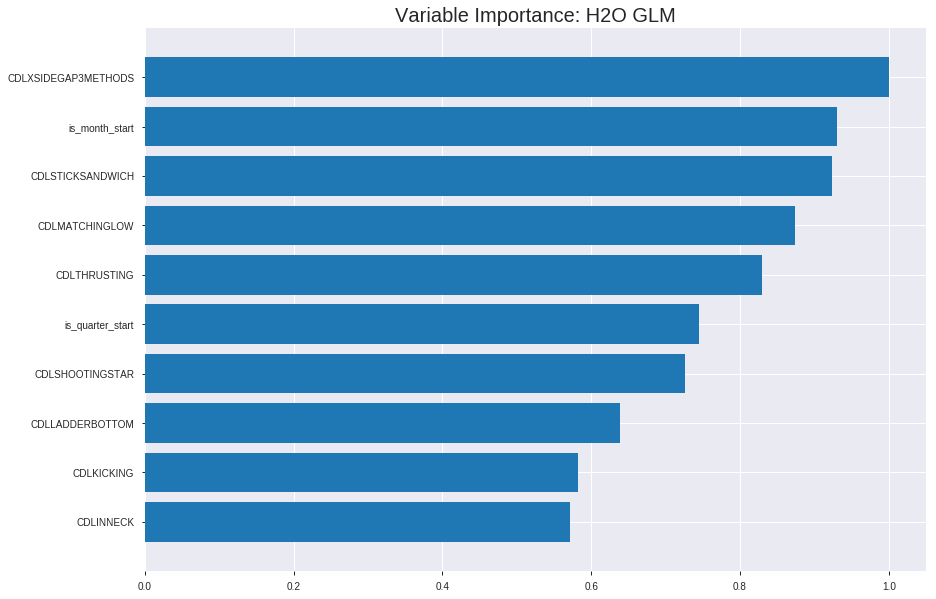

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_204838_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24768108137920605
RMSE: 0.4976756789106798
LogLoss: 0.6884920819283075
Null degrees of freedom: 1710
Residual degrees of freedom: 1660
Null deviance: 2365.745433910457
Residual deviance: 2356.019904358668
AIC: 2458.019904358668
AUC: 0.5840429879269584
pr_auc: 0.6188509306522245
Gini: 0.16808597585391682
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5043909948010018: 


,0,1,Error,Rate
0,17.0,787.0,0.9789,(787.0/804.0)
1,1.0,906.0,0.0011,(1.0/907.0)
Total,18.0,1693.0,0.4605,(788.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5043910,0.6969231,381.0
max f2,0.5043910,0.8513437,381.0
max f0point5,0.5277759,0.5977462,260.0
max accuracy,0.5285096,0.5663355,241.0
max precision,0.5798026,1.0,0.0
max recall,0.4952310,1.0,390.0
max specificity,0.5798026,1.0,0.0
max absolute_mcc,0.5313976,0.1285693,170.0
max min_per_class_accuracy,0.5295491,0.5559701,212.0
max mean_per_class_accuracy,0.5297474,0.5618017,208.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 53.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.5617154,1.8864388,1.8864388,1.0,0.5705990,1.0,0.5705990,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.5553756,1.3316039,1.6169476,0.7058824,0.5582239,0.8571429,0.5645883,0.0132304,0.0330761,33.1603865,61.6947551
,3,0.0303916,0.5487908,1.2206369,1.4873844,0.6470588,0.5509440,0.7884615,0.5601276,0.0121279,0.0452040,22.0636877,48.7384446
,4,0.0403273,0.5455981,1.5535378,1.5036831,0.8235294,0.5473742,0.7971014,0.5569855,0.0154355,0.0606395,55.3537843,50.3683109
,5,0.0502630,0.5428032,0.9987029,1.4038614,0.5294118,0.5440971,0.7441860,0.5544378,0.0099228,0.0705623,-0.1297101,40.3861439
,6,0.1005260,0.5376646,1.2283788,1.3161201,0.6511628,0.5402350,0.6976744,0.5473364,0.0617420,0.1323043,22.8378760,31.6120099
,7,0.1502046,0.5330813,1.1318633,1.2551791,0.6,0.5348136,0.6653696,0.5431946,0.0562293,0.1885336,13.1863286,25.5179130
,8,0.2004676,0.5319933,1.0748314,1.2099608,0.5697674,0.5324952,0.6413994,0.5405120,0.0540243,0.2425579,7.4831415,20.9960752
,9,0.3004091,0.5309503,1.0921488,1.1707665,0.5789474,0.5314362,0.6206226,0.5374926,0.1091510,0.3517089,9.2148784,17.0766498
,10,0.4003507,0.5302295,0.9266717,1.1098319,0.4912281,0.5305593,0.5883212,0.5357618,0.0926130,0.4443219,-7.3328304,10.9831883




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.37800258110109525
RMSE: 0.6148191450346152
LogLoss: 9.085747366587832
Null degrees of freedom: 488
Residual degrees of freedom: 438
Null deviance: 674.0077116277507
Residual deviance: 170220.41269527242
AIC: 170322.41269527242
AUC: 0.530196866346998
pr_auc: 0.5544138964679746
Gini: 0.06039373269399606
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.9995676269896874e-56: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.7080581,249.0
max f2,0.0000000,0.8584241,249.0
max f0point5,0.0000000,0.6025180,249.0
max accuracy,0.0000000,0.5480573,249.0
max precision,0.5664651,0.6666667,2.0
max recall,0.0000000,1.0,249.0
max specificity,0.5721167,0.9954751,0.0
max absolute_mcc,0.3934006,0.0897350,240.0
max min_per_class_accuracy,0.0000000,0.5410448,245.0
max mean_per_class_accuracy,0.3934006,0.5450716,240.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 26.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.5544595,0.7298507,0.7298507,0.4,0.5641468,0.4,0.5641468,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.5476691,0.7298507,0.7298507,0.4,0.5512119,0.4,0.5576794,0.0074627,0.0149254,-27.0149254,-27.0149254
,3,0.0306748,0.5420214,1.4597015,0.9731343,0.8,0.5435846,0.5333333,0.5529811,0.0149254,0.0298507,45.9701493,-2.6865672
,4,0.0408998,0.5402963,0.7298507,0.9123134,0.4,0.5411777,0.5,0.5500303,0.0074627,0.0373134,-27.0149254,-8.7686567
,5,0.0511247,0.5371927,0.3649254,0.8028358,0.2,0.5390254,0.44,0.5478293,0.0037313,0.0410448,-63.5074627,-19.7164179
,6,0.1002045,0.5318864,0.8362873,0.8192202,0.4583333,0.5332875,0.4489796,0.5407068,0.0410448,0.0820896,-16.3712687,-18.0779775
,7,0.1513292,0.5307651,1.0947761,0.9123134,0.6,0.5312658,0.5,0.5375173,0.0559701,0.1380597,9.4776119,-8.7686567
,8,0.2004090,0.5297729,1.2164179,0.9867880,0.6666667,0.5302188,0.5408163,0.5357299,0.0597015,0.1977612,21.6417910,-1.3212001
,9,0.3006135,0.5286263,1.1543558,1.0426439,0.6326531,0.5291635,0.5714286,0.5335411,0.1156716,0.3134328,15.4355772,4.2643923
,10,0.4008180,0.5267018,1.1171185,1.0612626,0.6122449,0.5277380,0.5816327,0.5320903,0.1119403,0.4253731,11.7118489,6.1262565



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 20:48:38,0.000 sec,2,.27E1,51,1.3769842,348.0990035
,2019-08-24 20:48:38,0.010 sec,4,.17E1,51,1.3743013,349.2264555
,2019-08-24 20:48:38,0.022 sec,6,.11E1,51,1.3708251,350.6263352
,2019-08-24 20:48:38,0.028 sec,8,.65E0,51,1.3666926,351.6193405
,2019-08-24 20:48:38,0.033 sec,10,.41E0,51,1.3622620,352.4569686


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.563265306122449)

('F1', 0.6388888888888888)

('auc', 0.4877926421404682)

('logloss', 6.075591674593961)

('mean_per_class_error', 0.4612040133779264)

('rmse', 0.5874527495316523)

('mse', 0.3451007329322982)

glm prediction progress: |████████████████████████████████████████████████| 100%


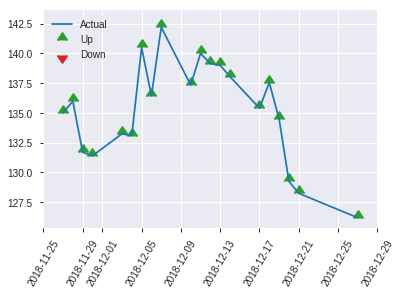


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.3451007329322982
RMSE: 0.5874527495316523
LogLoss: 6.075591674593961
Null degrees of freedom: 244
Residual degrees of freedom: 194
Null deviance: 342.33973069416305
Residual deviance: 47726.661542795
AIC: 47828.661542795
AUC: 0.4877926421404682
pr_auc: 0.4922715027852671
Gini: -0.024414715719063618
Confusion Matrix (Act/Pred) for max f1 @ threshold = 7.328298583962946e-68: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6388889,175.0
max f2,0.0000000,0.8156028,175.0
max f0point5,0.0000000,0.5251142,175.0
max accuracy,0.5330364,0.5632653,23.0
max precision,0.5399439,0.7272727,10.0
max recall,0.0000000,1.0,175.0
max specificity,0.5722479,0.9923077,0.0
max absolute_mcc,0.5330364,0.1302674,23.0
max min_per_class_accuracy,0.5268144,0.4692308,122.0
max mean_per_class_accuracy,0.5330364,0.5387960,23.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 35.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.5508796,0.7101449,0.7101449,0.3333333,0.5659235,0.3333333,0.5659235,0.0086957,0.0086957,-28.9855072,-28.9855072
,2,0.0204082,0.5421249,2.1304348,1.2782609,1.0,0.5432505,0.6,0.5568543,0.0173913,0.0260870,113.0434783,27.8260870
,3,0.0326531,0.5411604,1.4202899,1.3315217,0.6666667,0.5417742,0.625,0.5511993,0.0173913,0.0434783,42.0289855,33.1521739
,4,0.0408163,0.5401005,2.1304348,1.4913043,1.0,0.5408763,0.7,0.5491347,0.0173913,0.0608696,113.0434783,49.1304348
,5,0.0530612,0.5389569,1.4202899,1.4749164,0.6666667,0.5395287,0.6923077,0.5469179,0.0173913,0.0782609,42.0289855,47.4916388
,6,0.1020408,0.5329859,1.2427536,1.3634783,0.5833333,0.5343773,0.64,0.5408984,0.0608696,0.1391304,24.2753623,36.3478261
,7,0.1510204,0.5311552,0.8876812,1.2091657,0.4166667,0.5319854,0.5675676,0.5380077,0.0434783,0.1826087,-11.2318841,20.9165687
,8,0.2,0.5304868,0.8876812,1.1304348,0.4166667,0.5307348,0.5306122,0.5362266,0.0434783,0.2260870,-11.2318841,13.0434783
,9,0.3020408,0.5293911,0.9373913,1.0652174,0.44,0.5300012,0.5,0.5341234,0.0956522,0.3217391,-6.2608696,6.5217391
,10,0.4,0.5283271,0.7989130,1.0,0.375,0.5288297,0.4693878,0.5328270,0.0782609,0.4,-20.1086957,0.0


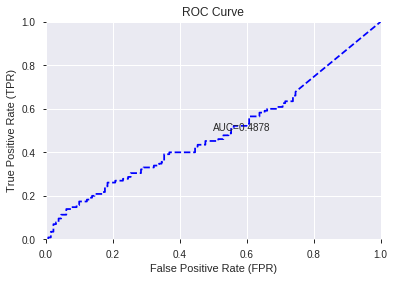

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


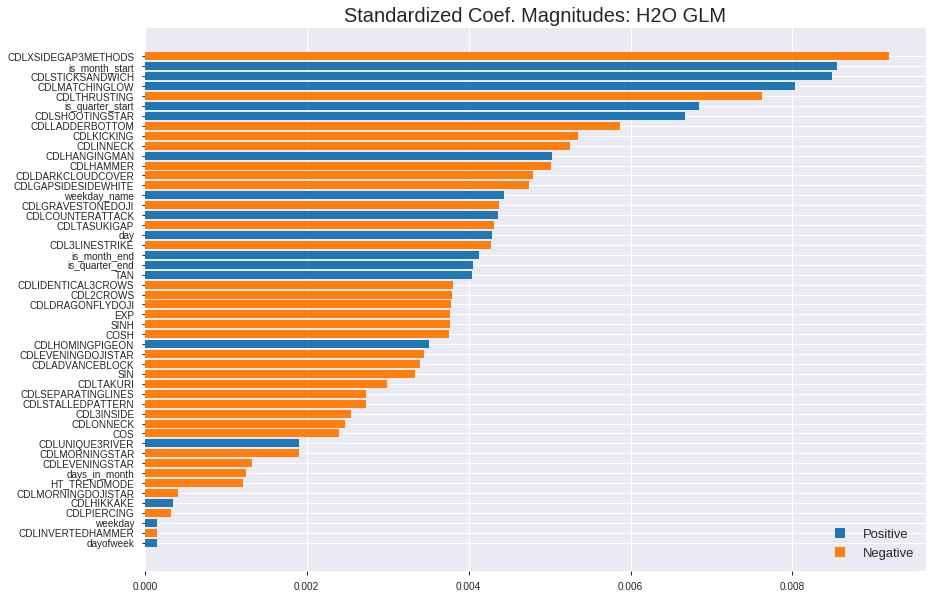

'log_likelihood'
--2019-08-24 20:48:43--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.32.220
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.32.220|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


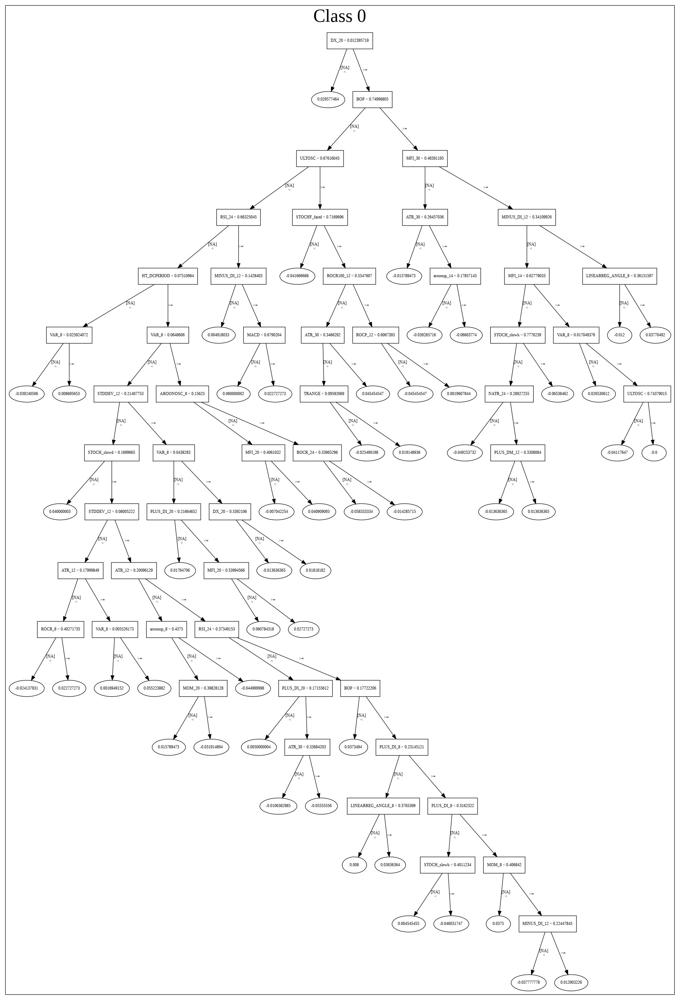

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_204838_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_204838_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['CDLXSIDEGAP3METHODS',
 'is_month_start',
 'CDLSTICKSANDWICH',
 'CDLMATCHINGLOW',
 'CDLTHRUSTING',
 'is_quarter_start',
 'CDLSHOOTINGSTAR',
 'CDLLADDERBOTTOM',
 'CDLKICKING',
 'CDLINNECK',
 'CDLHANGINGMAN',
 'CDLHAMMER',
 'CDLDARKCLOUDCOVER',
 'CDLGAPSIDESIDEWHITE',
 'weekday_name',
 'CDLGRAVESTONEDOJI',
 'CDLCOUNTERATTACK',
 'CDLTASUKIGAP',
 'day',
 'CDL3LINESTRIKE',
 'is_month_end',
 'is_quarter_end',
 'TAN',
 'CDLIDENTICAL3CROWS',
 'CDL2CROWS',
 'CDLDRAGONFLYDOJI',
 'EXP',
 'SINH',
 'COSH',
 'CDLHOMINGPIGEON',
 'CDLEVENINGDOJISTAR',
 'CDLADVANCEBLOCK',
 'SIN',
 'CDLTAKURI',
 'CDLSEPARATINGLINES',
 'CDLSTALLEDPATTERN',
 'CDL3INSIDE',
 'CDLONNECK',
 'COS',
 'CDLUNIQUE3RIVER',
 'CDLMORNINGSTAR',
 'CDLEVENINGSTAR',
 'days_in_month',
 'HT_TRENDMODE',
 'CDLMORNINGDOJISTAR',
 'CDLHIKKAKE',
 'CDLPIERCING',
 'weekday',
 'CDLINVERTEDHAMMER',
 'dayofweek']

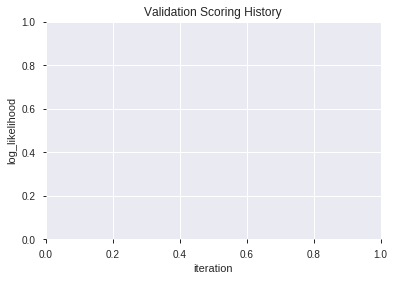

In [12]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_204849_model_1,0.542943,0.697560,0.500000,0.502140,0.252144
1,XGBoost_2_AutoML_20190824_204849,0.531973,0.701757,0.485117,0.504150,0.254167
2,XGBoost_grid_1_AutoML_20190824_204849_model_6,0.528763,0.704716,0.500000,0.505482,0.255512
3,XGBoost_grid_1_AutoML_20190824_204849_model_7,0.524816,0.712428,0.492308,0.509268,0.259354
4,XGBoost_1_AutoML_20190824_204849,0.521605,0.714751,0.496154,0.510158,0.260261
5,XGBoost_grid_1_AutoML_20190824_204849_model_3,0.519732,0.708239,0.484615,0.507162,0.257213
6,XGBoost_grid_1_AutoML_20190824_204849_model_4,0.516522,0.702172,0.467391,0.504413,0.254433
7,XGBoost_grid_1_AutoML_20190824_204849_model_2,0.511706,0.700168,0.492308,0.503491,0.253503
8,XGBoost_3_AutoML_20190824_204849,0.509833,0.711794,0.500000,0.508794,0.258872
9,XGBoost_grid_1_AutoML_20190824_204849_model_5,0.474114,0.770411,0.496154,0.533965,0.285119


,variable,relative_importance,scaled_importance,percentage
0,COS,481.024933,1.000000,0.258520
1,day,326.259979,0.678260,0.175344
2,COSH,243.383148,0.505968,0.130803
3,TAN,213.566727,0.443983,0.114778
4,SIN,205.591461,0.427403,0.110492
5,dayofweek,135.114716,0.280889,0.072615
6,weekday_name,42.880547,0.089144,0.023046
7,days_in_month,38.255814,0.079530,0.020560
8,CDLMATCHINGLOW,37.845776,0.078677,0.020340
9,weekday,32.828358,0.068247,0.017643


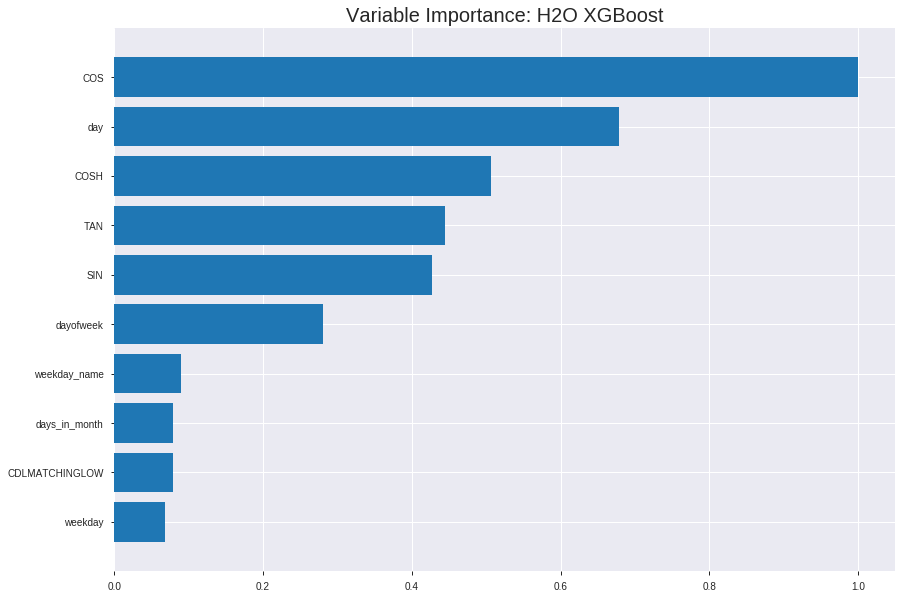

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_204849_model_1


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.22324202964893203
RMSE: 0.4724849517698231
LogLoss: 0.6384404697241085
Mean Per-Class Error: 0.32004873647199505
AUC: 0.7477112782284827
pr_auc: 0.76239211943026
Gini: 0.4954225564569654
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49786797910928726: 


,0,1,Error,Rate
0,368.0,436.0,0.5423,(436.0/804.0)
1,118.0,789.0,0.1301,(118.0/907.0)
Total,486.0,1225.0,0.3238,(554.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4978680,0.7401501,252.0
max f2,0.4169885,0.8576923,341.0
max f0point5,0.5352346,0.7029920,190.0
max accuracy,0.5065296,0.6808884,238.0
max precision,0.7656242,1.0,0.0
max recall,0.3540267,1.0,384.0
max specificity,0.7656242,1.0,0.0
max absolute_mcc,0.4978680,0.3625814,252.0
max min_per_class_accuracy,0.5267829,0.6766169,203.0
max mean_per_class_accuracy,0.5352346,0.6799513,190.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 52.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.7093568,1.8864388,1.8864388,1.0,0.7256371,1.0,0.7256371,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.6845562,1.8864388,1.8864388,1.0,0.6961477,1.0,0.7113136,0.0187431,0.0385888,88.6438809,88.6438809
,3,0.0303916,0.6740872,1.6645048,1.8138835,0.8823529,0.6794441,0.9615385,0.7008947,0.0165380,0.0551268,66.4504832,81.3883470
,4,0.0403273,0.6571903,1.6645048,1.7770800,0.8823529,0.6663420,0.9420290,0.6923817,0.0165380,0.0716648,66.4504832,77.7080038
,5,0.0502630,0.6443955,1.5535378,1.7328915,0.8235294,0.6495509,0.9186047,0.6839152,0.0154355,0.0871003,55.3537843,73.2891464
,6,0.1005260,0.6142541,1.6012795,1.6670855,0.8488372,0.6292427,0.8837209,0.6565789,0.0804851,0.1675854,60.1279454,66.7085459
,7,0.1502046,0.5961293,1.3981841,1.5781492,0.7411765,0.6043339,0.8365759,0.6392994,0.0694598,0.2370452,39.8184059,57.8149198
,8,0.2004676,0.5807948,1.3819261,1.5289504,0.7325581,0.5890997,0.8104956,0.6267129,0.0694598,0.3065050,38.1926104,52.8950405
,9,0.3004091,0.5611020,1.2907213,1.4496952,0.6842105,0.5713855,0.7684825,0.6083063,0.1289967,0.4355017,29.0721291,44.9695194
,10,0.4003507,0.5428600,1.2686577,1.4045019,0.6725146,0.5516587,0.7445255,0.5941651,0.1267916,0.5622933,26.8657679,40.4501887




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.25791841497789253
RMSE: 0.5078566874403571
LogLoss: 0.7097508778904759
Mean Per-Class Error: 0.48383365975552106
AUC: 0.48457655163098534
pr_auc: 0.5285368714276172
Gini: -0.030846896738029317
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33579230308532715: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3357923,0.7080581,399.0
max f2,0.3357923,0.8584241,399.0
max f0point5,0.3357923,0.6025180,399.0
max accuracy,0.3357923,0.5480573,399.0
max precision,0.5644150,0.5766423,119.0
max recall,0.3357923,1.0,399.0
max specificity,0.7354077,0.9954751,0.0
max absolute_mcc,0.6722495,0.1192654,15.0
max min_per_class_accuracy,0.5165325,0.5113122,204.0
max mean_per_class_accuracy,0.5644150,0.5161663,119.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 52.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.6913730,0.7298507,0.7298507,0.4,0.7042246,0.4,0.7042246,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.6840295,0.3649254,0.5473881,0.2,0.6876169,0.3,0.6959207,0.0037313,0.0111940,-63.5074627,-45.2611940
,3,0.0306748,0.6748039,0.3649254,0.4865672,0.2,0.6816476,0.2666667,0.6911630,0.0037313,0.0149254,-63.5074627,-51.3432836
,4,0.0408998,0.6675374,0.7298507,0.5473881,0.4,0.6716745,0.3,0.6862909,0.0074627,0.0223881,-27.0149254,-45.2611940
,5,0.0511247,0.6631428,1.0947761,0.6568657,0.6,0.6645944,0.36,0.6819516,0.0111940,0.0335821,9.4776119,-34.3134328
,6,0.1002045,0.6319616,1.0643657,0.8564575,0.5833333,0.6477293,0.4693878,0.6651896,0.0522388,0.0858209,6.4365672,-14.3542492
,7,0.1513292,0.6091820,1.2407463,0.9862848,0.68,0.6212052,0.5405405,0.6503300,0.0634328,0.1492537,24.0746269,-1.3715208
,8,0.2004090,0.5910369,1.0643657,1.0054066,0.5833333,0.5997371,0.5510204,0.6379399,0.0522388,0.2014925,6.4365672,0.5406640
,9,0.3006135,0.5594728,1.0798812,1.0302315,0.5918367,0.5732765,0.5646259,0.6163855,0.1082090,0.3097015,7.9881206,3.0231496
,10,0.4008180,0.5359429,0.9309321,1.0054066,0.5102041,0.5452796,0.5510204,0.5986090,0.0932836,0.4029851,-6.9067926,0.5406640



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:48:52,0.016 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4699006,0.5,0.6931472,0.5,0.0,1.0,0.4519427
,2019-08-24 20:48:52,0.060 sec,5.0,0.4956342,0.6844406,0.6538792,0.6810265,1.6768345,0.4155465,0.5003483,0.6938451,0.4798575,0.5384815,0.7298507,0.4519427
,2019-08-24 20:48:52,0.093 sec,10.0,0.4908572,0.6749364,0.6784010,0.6999539,1.7816367,0.3886616,0.5017026,0.6965849,0.4767931,0.5336845,1.0947761,0.4519427
,2019-08-24 20:48:52,0.124 sec,15.0,0.4876049,0.6684782,0.6915855,0.7099706,1.6768345,0.3728814,0.5025776,0.6983863,0.4763710,0.5326738,0.3649254,0.4519427
,2019-08-24 20:48:53,0.153 sec,20.0,0.4850529,0.6634031,0.7037730,0.7223466,1.7816367,0.3886616,0.5033425,0.6999887,0.4825505,0.5338078,0.3649254,0.4519427
,2019-08-24 20:48:53,0.186 sec,25.0,0.4822011,0.6577221,0.7119378,0.7252502,1.7816367,0.3746347,0.5050695,0.7035821,0.4736949,0.5275237,0.7298507,0.4519427
,2019-08-24 20:48:53,0.225 sec,30.0,0.4801199,0.6535964,0.7207691,0.7338705,1.8864388,0.3547633,0.5059042,0.7053933,0.4768437,0.5265760,0.3649254,0.4519427
,2019-08-24 20:48:53,0.264 sec,35.0,0.4775879,0.6485876,0.7325535,0.7458325,1.8864388,0.3389831,0.5063712,0.7064620,0.4851337,0.5306122,0.7298507,0.4519427
,2019-08-24 20:48:53,0.311 sec,40.0,0.4757122,0.6448593,0.7386723,0.7524434,1.8864388,0.3348919,0.5069309,0.7076790,0.4872527,0.5325048,0.7298507,0.4519427
,2019-08-24 20:48:53,0.356 sec,45.0,0.4738768,0.6412239,0.7450242,0.7585868,1.8864388,0.3196961,0.5072900,0.7085045,0.4872864,0.5312081,0.3649254,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
COS,481.0249329,1.0,0.2585200
day,326.2599792,0.6782600,0.1753438
COSH,243.3831482,0.5059678,0.1308028
TAN,213.5667267,0.4439827,0.1147784
SIN,205.5914612,0.4274029,0.1104922
---,---,---,---
CDLDARKCLOUDCOVER,7.8121591,0.0162407,0.0041985
is_month_start,4.7331543,0.0098397,0.0025438
CDLDRAGONFLYDOJI,2.7732291,0.0057653,0.0014904
CDLGRAVESTONEDOJI,2.1246610,0.0044169,0.0011419



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5755102040816327)

('F1', 0.6388888888888888)

('auc', 0.542943143812709)

('logloss', 0.6975603175135485)

('mean_per_class_error', 0.4391304347826087)

('rmse', 0.5021396119301456)

('mse', 0.25214418986935716)

xgboost prediction progress: |████████████████████████████████████████████| 100%


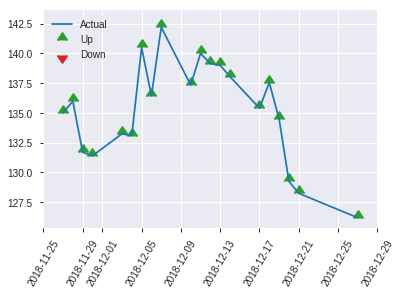


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25214418986935716
RMSE: 0.5021396119301456
LogLoss: 0.6975603175135485
Mean Per-Class Error: 0.4391304347826087
AUC: 0.542943143812709
pr_auc: 0.5193805645961951
Gini: 0.08588628762541806
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36325156688690186: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3632516,0.6388889,244.0
max f2,0.3632516,0.8156028,244.0
max f0point5,0.4414308,0.5265902,210.0
max accuracy,0.5769770,0.5755102,58.0
max precision,0.6956016,1.0,0.0
max recall,0.3632516,1.0,244.0
max specificity,0.6956016,1.0,0.0
max absolute_mcc,0.5769770,0.1397494,58.0
max min_per_class_accuracy,0.5222422,0.5307692,122.0
max mean_per_class_accuracy,0.5750831,0.5608696,62.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 52.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.6812487,1.4202899,1.4202899,0.6666667,0.6910330,0.6666667,0.6910330,0.0173913,0.0173913,42.0289855,42.0289855
,2,0.0204082,0.6684763,2.1304348,1.7043478,1.0,0.6783544,0.8,0.6859615,0.0173913,0.0347826,113.0434783,70.4347826
,3,0.0326531,0.6616090,1.4202899,1.5978261,0.6666667,0.6654862,0.75,0.6782833,0.0173913,0.0521739,42.0289855,59.7826087
,4,0.0408163,0.6494184,0.0,1.2782609,0.0,0.6537887,0.6,0.6733844,0.0,0.0521739,-100.0,27.8260870
,5,0.0530612,0.6420757,0.7101449,1.1471572,0.3333333,0.6460861,0.5384615,0.6670848,0.0086957,0.0608696,-28.9855072,14.7157191
,6,0.1020408,0.6163013,1.5978261,1.3634783,0.75,0.6248935,0.64,0.6468330,0.0782609,0.1391304,59.7826087,36.3478261
,7,0.1510204,0.5903717,0.7101449,1.1515864,0.3333333,0.6022525,0.5405405,0.6323744,0.0347826,0.1739130,-28.9855072,15.1586369
,8,0.2,0.5830821,1.2427536,1.1739130,0.5833333,0.5871486,0.5510204,0.6212987,0.0608696,0.2347826,24.2753623,17.3913043
,9,0.3020408,0.5682543,1.1930435,1.1803760,0.56,0.5757917,0.5540541,0.6059247,0.1217391,0.3565217,19.3043478,18.0376028
,10,0.4,0.5419106,0.8876812,1.1086957,0.4166667,0.5566252,0.5204082,0.5938514,0.0869565,0.4434783,-11.2318841,10.8695652


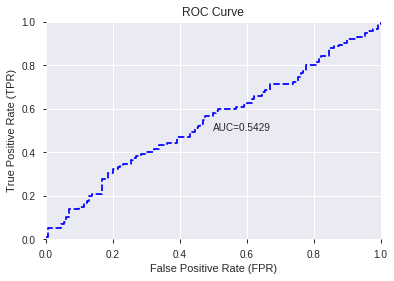

This function is available for GLM models only


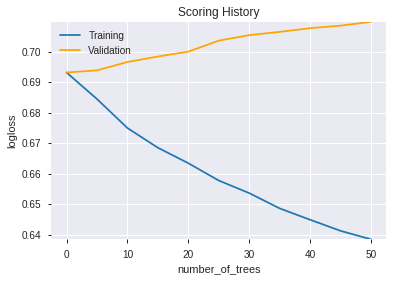

--2019-08-24 20:49:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.229.8
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.229.8|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

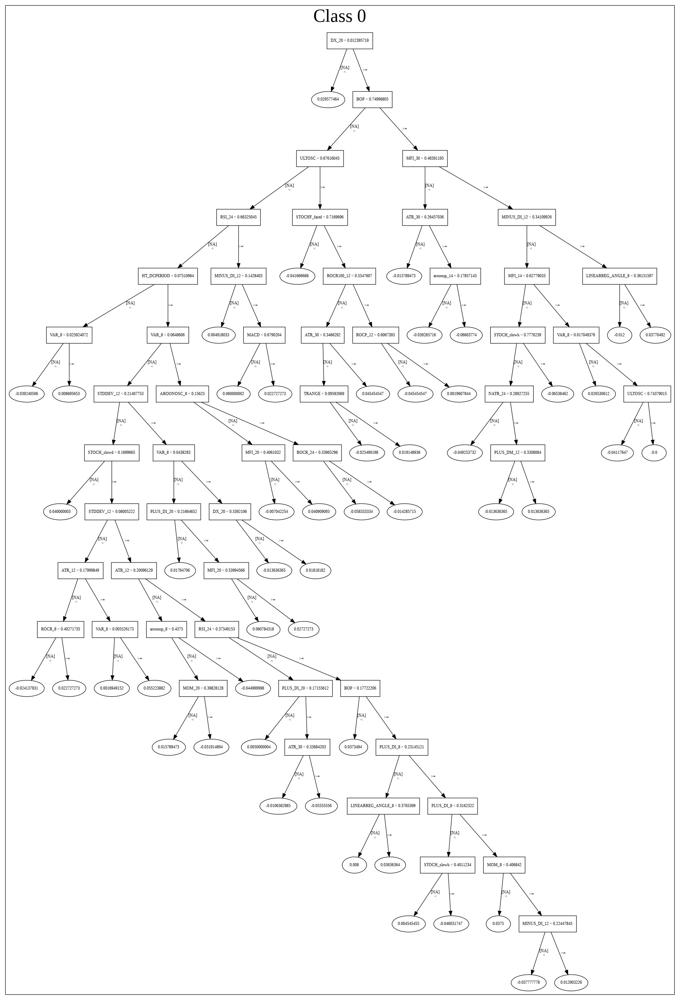

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_204849_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_204849_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['COS',
 'day',
 'COSH',
 'TAN',
 'SIN',
 'dayofweek',
 'weekday_name',
 'days_in_month',
 'CDLMATCHINGLOW',
 'weekday',
 'HT_TRENDMODE',
 'SINH',
 'CDLHANGINGMAN',
 'EXP',
 'CDLHIKKAKE',
 'CDLHAMMER',
 'CDLDARKCLOUDCOVER',
 'is_month_start',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'is_month_end']

In [13]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_204908_model_1,0.493144,6.062867,0.5,0.586519,0.344004


,variable,relative_importance,scaled_importance,percentage
0,CDLXSIDEGAP3METHODS,8.736959e-03,1.000000,1.180129e-02
1,is_month_start,8.116180e-03,0.928948,1.096278e-02
2,CDLSTICKSANDWICH,7.792535e-03,0.891905,1.052562e-02
3,CDLMATCHINGLOW,7.522379e-03,0.860984,1.016071e-02
4,CDLTHRUSTING,6.919751e-03,0.792009,9.346726e-03
5,is_quarter_start,6.294017e-03,0.720390,8.501527e-03
6,STOCHRSI_fastk,6.267672e-03,0.717375,8.465942e-03
7,CDLSHOOTINGSTAR,5.988059e-03,0.685371,8.088260e-03
8,CDLMARUBOZU,5.801540e-03,0.664023,7.836322e-03
9,CDLLADDERBOTTOM,5.721190e-03,0.654826,7.727792e-03


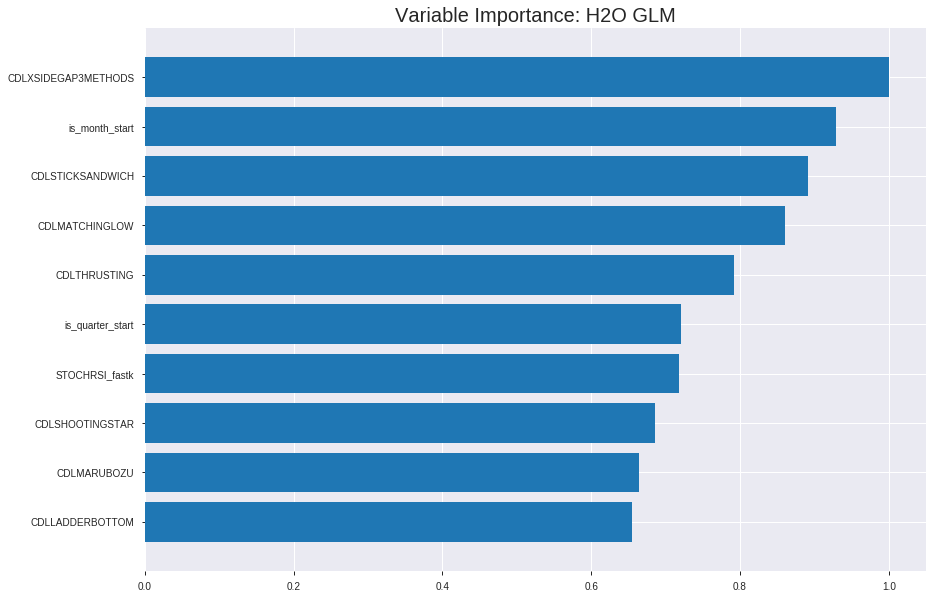

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_204908_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24565126819919655
RMSE: 0.49563219043883394
LogLoss: 0.6844001559180868
Null degrees of freedom: 1710
Residual degrees of freedom: 667
Null deviance: 2365.745433910457
Residual deviance: 2342.017333551693
AIC: 4430.017333551693
AUC: 0.5902687499657172
pr_auc: 0.6257491400842914
Gini: 0.18053749993143442
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48296558117716326: 


,0,1,Error,Rate
0,22.0,782.0,0.9726,(782.0/804.0)
1,4.0,903.0,0.0044,(4.0/907.0)
Total,26.0,1685.0,0.4594,(786.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4829656,0.6967593,380.0
max f2,0.4738177,0.8506847,391.0
max f0point5,0.5038352,0.5999137,325.0
max accuracy,0.5320657,0.5669199,191.0
max precision,0.6060852,1.0,0.0
max recall,0.4738177,1.0,391.0
max specificity,0.6060852,1.0,0.0
max absolute_mcc,0.5467268,0.1444233,123.0
max min_per_class_accuracy,0.5293300,0.5611907,203.0
max mean_per_class_accuracy,0.5320657,0.5694762,191.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 53.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.5825673,1.7816367,1.7816367,0.9444444,0.5926585,0.9444444,0.5926585,0.0187431,0.0187431,78.1636653,78.1636653
,2,0.0204559,0.5764988,1.4425709,1.6169476,0.7647059,0.5793673,0.8571429,0.5862028,0.0143330,0.0330761,44.2570854,61.6947551
,3,0.0303916,0.5717169,1.4425709,1.5599398,0.7647059,0.5742861,0.8269231,0.5823069,0.0143330,0.0474090,44.2570854,55.9939785
,4,0.0403273,0.5689324,1.3316039,1.5036831,0.7058824,0.5701419,0.7971014,0.5793098,0.0132304,0.0606395,33.1603865,50.3683109
,5,0.0502630,0.5670264,1.1096699,1.4257968,0.5882353,0.5682010,0.7558140,0.5771138,0.0110254,0.0716648,10.9669888,42.5796774
,6,0.1005260,0.5596026,1.2283788,1.3270878,0.6511628,0.5628626,0.7034884,0.5699882,0.0617420,0.1334068,22.8378760,32.7087767
,7,0.1502046,0.5545873,1.1318633,1.2625194,0.6,0.5568016,0.6692607,0.5656269,0.0562293,0.1896362,13.1863286,26.2519359
,8,0.2004676,0.5499741,1.1625728,1.2374599,0.6162791,0.5522020,0.6559767,0.5622609,0.0584344,0.2480706,16.2572755,23.7459860
,9,0.3004091,0.5422434,1.0480216,1.1744366,0.5555556,0.5461696,0.6225681,0.5569076,0.1047409,0.3528115,4.8021561,17.4436613
,10,0.4003507,0.5350534,1.0700852,1.1483868,0.5672515,0.5384168,0.6087591,0.5522916,0.1069460,0.4597574,7.0085173,14.8386837




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.3770190615137174
RMSE: 0.6140187794471089
LogLoss: 9.078704197831799
Null degrees of freedom: 488
Residual degrees of freedom: -555
Null deviance: 674.0077116277507
Residual deviance: 170101.1387965037
AIC: 172189.1387965037
AUC: 0.5490055379212535
pr_auc: 0.5923043734092708
Gini: 0.09801107584250701
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.183531335429861e-51: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.7080581,249.0
max f2,0.0000000,0.8584241,249.0
max f0point5,0.0000000,0.6025180,249.0
max accuracy,0.0000000,0.5480573,249.0
max precision,0.5813999,1.0,0.0
max recall,0.0000000,1.0,249.0
max specificity,0.5813999,1.0,0.0
max absolute_mcc,0.5026842,0.1091832,196.0
max min_per_class_accuracy,0.0000000,0.5410448,245.0
max mean_per_class_accuracy,0.5026842,0.5538006,196.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 26.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.5765792,1.4597015,1.4597015,0.8,0.5796847,0.8,0.5796847,0.0149254,0.0149254,45.9701493,45.9701493
,2,0.0204499,0.5702586,1.0947761,1.2772388,0.6,0.5739638,0.7,0.5768242,0.0111940,0.0261194,9.4776119,27.7238806
,3,0.0306748,0.5682343,0.7298507,1.0947761,0.4,0.5693366,0.6,0.5743284,0.0074627,0.0335821,-27.0149254,9.4776119
,4,0.0408998,0.5661010,0.7298507,1.0035448,0.4,0.5673427,0.55,0.5725819,0.0074627,0.0410448,-27.0149254,0.3544776
,5,0.0511247,0.5631362,1.4597015,1.0947761,0.8,0.5645000,0.6,0.5709656,0.0149254,0.0559701,45.9701493,9.4776119
,6,0.1002045,0.5506250,1.1403918,1.1171185,0.625,0.5570544,0.6122449,0.5641519,0.0559701,0.1119403,14.0391791,11.7118489
,7,0.1513292,0.5387674,1.3137313,1.1835418,0.72,0.5442514,0.6486486,0.5574288,0.0671642,0.1791045,31.3731343,18.3541751
,8,0.2004090,0.5319468,0.9123134,1.1171185,0.5,0.5354912,0.6122449,0.5520563,0.0447761,0.2238806,-8.7686567,11.7118489
,9,0.3006135,0.5174572,1.0054066,1.0798812,0.5510204,0.5244881,0.5918367,0.5428669,0.1007463,0.3246269,0.5406640,7.9881206
,10,0.4008180,0.5029884,1.2288303,1.1171185,0.6734694,0.5105038,0.6122449,0.5347761,0.1231343,0.4477612,22.8830338,11.7118489



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 20:49:11,0.000 sec,2,.29E1,1044,1.3688003,347.8550896
,2019-08-24 20:49:13,1.871 sec,4,.21E1,1044,1.3653931,348.4914389
,2019-08-24 20:49:15,3.742 sec,6,.15E1,1044,1.3613979,349.2373630
,2019-08-24 20:49:17,5.626 sec,8,.11E1,1044,1.3567854,350.0698103
,2019-08-24 20:49:19,7.495 sec,10,.8E0,1044,1.3516151,350.9814197


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5591836734693878)

('F1', 0.6388888888888888)

('auc', 0.49314381270903007)

('logloss', 6.062866915370665)

('mean_per_class_error', 0.4625418060200669)

('rmse', 0.5865189447965099)

('mse', 0.34400447260521144)

glm prediction progress: |████████████████████████████████████████████████| 100%


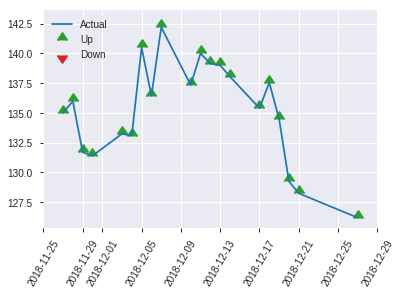


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.34400447260521144
RMSE: 0.5865189447965099
LogLoss: 6.062866915370665
Null degrees of freedom: 244
Residual degrees of freedom: -799
Null deviance: 342.33973069416305
Residual deviance: 47398.28656516502
AIC: 49486.28656516502
AUC: 0.49314381270903007
pr_auc: 0.4802254154211936
Gini: -0.013712374581939857
Confusion Matrix (Act/Pred) for max f1 @ threshold = 7.285847516394274e-62: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6388889,175.0
max f2,0.0000000,0.8156028,175.0
max f0point5,0.0000000,0.5251142,175.0
max accuracy,0.5601458,0.5591837,22.0
max precision,0.5878548,1.0,0.0
max recall,0.0000000,1.0,175.0
max specificity,0.5878548,1.0,0.0
max absolute_mcc,0.5601458,0.1178898,22.0
max min_per_class_accuracy,0.5211953,0.5,122.0
max mean_per_class_accuracy,0.5513094,0.5374582,34.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 36.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.5798772,0.7101449,0.7101449,0.3333333,0.5843410,0.3333333,0.5843410,0.0086957,0.0086957,-28.9855072,-28.9855072
,2,0.0204082,0.5760017,1.0652174,0.8521739,0.5,0.5782947,0.4,0.5819224,0.0086957,0.0173913,6.5217391,-14.7826087
,3,0.0326531,0.5740622,1.4202899,1.0652174,0.6666667,0.5748750,0.5,0.5792797,0.0173913,0.0347826,42.0289855,6.5217391
,4,0.0408163,0.5720506,2.1304348,1.2782609,1.0,0.5731480,0.6,0.5780533,0.0173913,0.0521739,113.0434783,27.8260870
,5,0.0530612,0.5709211,0.7101449,1.1471572,0.3333333,0.5714133,0.5384615,0.5765210,0.0086957,0.0608696,-28.9855072,14.7157191
,6,0.1020408,0.5579964,1.4202899,1.2782609,0.6666667,0.5635476,0.6,0.5702938,0.0695652,0.1304348,42.0289855,27.8260870
,7,0.1510204,0.5503212,1.0652174,1.2091657,0.5,0.5545254,0.5675676,0.5651797,0.0521739,0.1826087,6.5217391,20.9165687
,8,0.2,0.5471108,0.7101449,1.0869565,0.3333333,0.5485261,0.5102041,0.5611013,0.0347826,0.2173913,-28.9855072,8.6956522
,9,0.3020408,0.5385044,1.1078261,1.0940071,0.52,0.5425933,0.5135135,0.5548486,0.1130435,0.3304348,10.7826087,9.4007051
,10,0.4,0.5314417,0.8876812,1.0434783,0.4166667,0.5348198,0.4897959,0.5499436,0.0869565,0.4173913,-11.2318841,4.3478261


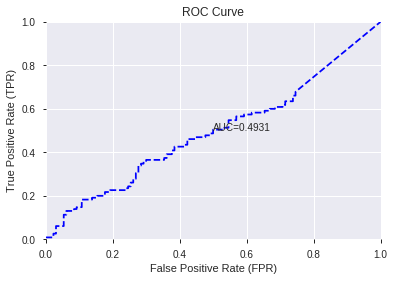

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


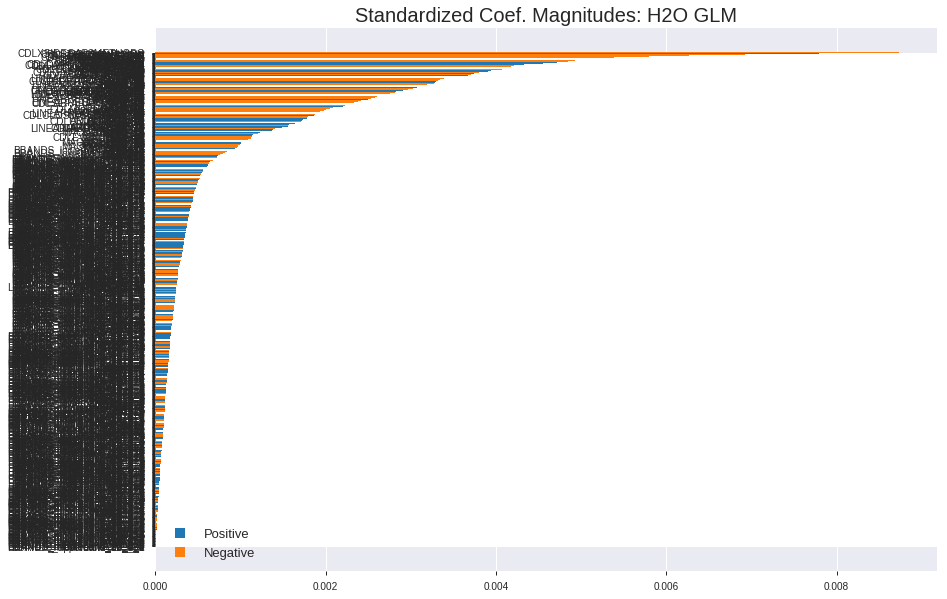

'log_likelihood'
--2019-08-24 20:49:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.21.35
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.21.35|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


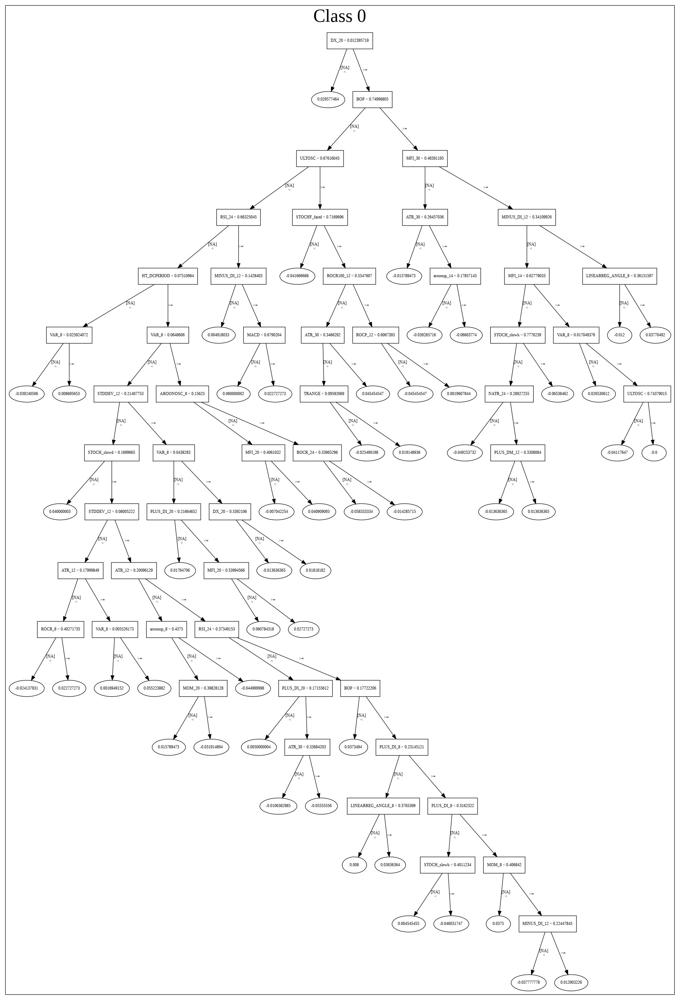

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_204908_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_204908_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

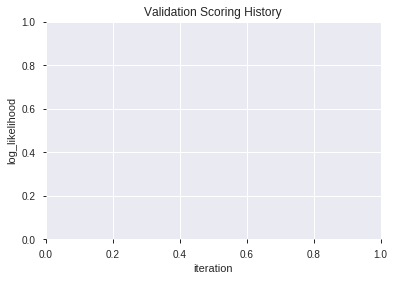

In [14]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [15]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [16]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [17]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190824_204944,0.512441,0.709389,0.488963,0.507740,0.257800
1,XGBoost_3_AutoML_20190824_204944,0.508227,0.701208,0.466388,0.504000,0.254016
2,XGBoost_grid_1_AutoML_20190824_204944_model_7,0.505686,0.722187,0.459699,0.513372,0.263551
3,XGBoost_grid_1_AutoML_20190824_204944_model_6,0.502274,0.719425,0.489465,0.512018,0.262163
4,XGBoost_grid_1_AutoML_20190824_204944_model_4,0.499799,0.712476,0.478930,0.509290,0.259377
5,XGBoost_grid_1_AutoML_20190824_204944_model_2,0.495786,0.705306,0.488462,0.506012,0.256049
6,XGBoost_grid_1_AutoML_20190824_204944_model_5,0.495050,0.757972,0.492308,0.527830,0.278605
7,XGBoost_grid_1_AutoML_20190824_204944_model_1,0.493946,0.704810,0.496154,0.505662,0.255694
8,XGBoost_grid_1_AutoML_20190824_204944_model_3,0.488896,0.729750,0.500000,0.516912,0.267198
9,XGBoost_2_AutoML_20190824_204944,0.482341,0.711281,0.434281,0.508720,0.258796


,variable,relative_importance,scaled_importance,percentage
0,DIV,149.399261,1.000000,0.016805
1,CORREL_8,143.498154,0.960501,0.016141
2,COS,142.841888,0.956108,0.016067
3,BETA_14,135.936813,0.909889,0.015291
4,ADOSC,131.881302,0.882744,0.014834
5,BOP,114.895699,0.769051,0.012924
6,day,109.429367,0.732463,0.012309
7,STOCHRSI_fastk,107.034981,0.716436,0.012040
8,HT_DCPERIOD,99.095055,0.663290,0.011147
9,ADX_8,89.994675,0.602377,0.010123


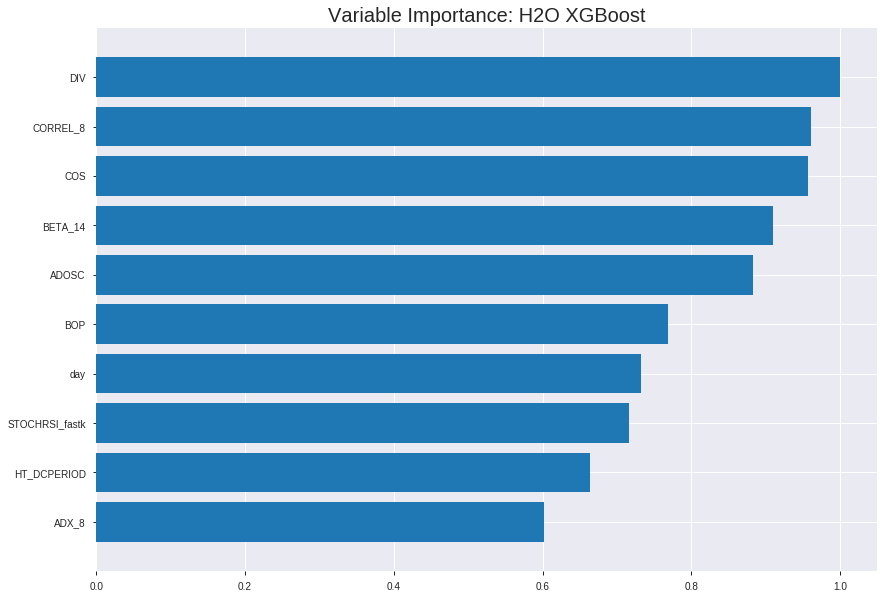

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190824_204944


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1374366578039103
RMSE: 0.3707245039161969
LogLoss: 0.4573902520757517
Mean Per-Class Error: 0.05455975360243981
AUC: 0.9887504319636656
pr_auc: 0.9893217790378583
Gini: 0.9775008639273313
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5251248627901077: 


,0,1,Error,Rate
0,765.0,39.0,0.0485,(39.0/804.0)
1,55.0,852.0,0.0606,(55.0/907.0)
Total,820.0,891.0,0.0549,(94.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5251249,0.9477197,197.0
max f2,0.4759977,0.9619952,228.0
max f0point5,0.5529923,0.9589526,179.0
max accuracy,0.5251249,0.9450614,197.0
max precision,0.8485615,1.0,0.0
max recall,0.3974421,1.0,281.0
max specificity,0.8485615,1.0,0.0
max absolute_mcc,0.5251249,0.8900040,197.0
max min_per_class_accuracy,0.5207252,0.9427861,200.0
max mean_per_class_accuracy,0.5319092,0.9454402,193.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 52.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.8000485,1.8864388,1.8864388,1.0,0.8139499,1.0,0.8139499,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.7829753,1.8864388,1.8864388,1.0,0.7878660,1.0,0.8012806,0.0187431,0.0385888,88.6438809,88.6438809
,3,0.0303916,0.7733438,1.8864388,1.8864388,1.0,0.7781245,1.0,0.7937103,0.0187431,0.0573319,88.6438809,88.6438809
,4,0.0403273,0.7639387,1.8864388,1.8864388,1.0,0.7685803,1.0,0.7875189,0.0187431,0.0760750,88.6438809,88.6438809
,5,0.0502630,0.7576690,1.8864388,1.8864388,1.0,0.7602812,1.0,0.7821347,0.0187431,0.0948181,88.6438809,88.6438809
,6,0.1005260,0.7286159,1.8864388,1.8864388,1.0,0.7420257,1.0,0.7620802,0.0948181,0.1896362,88.6438809,88.6438809
,7,0.1502046,0.7073072,1.8864388,1.8864388,1.0,0.7167083,1.0,0.7470739,0.0937155,0.2833517,88.6438809,88.6438809
,8,0.2004676,0.6840886,1.8864388,1.8864388,1.0,0.6955241,1.0,0.7341489,0.0948181,0.3781698,88.6438809,88.6438809
,9,0.3004091,0.6462787,1.8864388,1.8864388,1.0,0.6662552,1.0,0.7115617,0.1885336,0.5667034,88.6438809,88.6438809
,10,0.4003507,0.6067611,1.8643752,1.8809310,0.9883041,0.6272838,0.9970803,0.6905230,0.1863286,0.7530320,86.4375197,88.0930959




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26103514288381596
RMSE: 0.5109159841733433
LogLoss: 0.7168538431432485
Mean Per-Class Error: 0.4555615587222259
AUC: 0.5100459242250287
pr_auc: 0.5417820132959835
Gini: 0.020091848450057403
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.286282479763031: 


,0,1,Error,Rate
0,2.0,219.0,0.991,(219.0/221.0)
1,1.0,267.0,0.0037,(1.0/268.0)
Total,3.0,486.0,0.4499,(220.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2862825,0.7082228,396.0
max f2,0.2701274,0.8584241,399.0
max f0point5,0.3320718,0.6051402,379.0
max accuracy,0.3320718,0.5541922,379.0
max precision,0.4788134,0.5886792,219.0
max recall,0.2701274,1.0,399.0
max specificity,0.7870380,0.9954751,0.0
max absolute_mcc,0.4788134,0.0887780,219.0
max min_per_class_accuracy,0.4909038,0.5294118,205.0
max mean_per_class_accuracy,0.4788134,0.5444384,219.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 49.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.7298836,0.7298507,0.7298507,0.4,0.7544153,0.4,0.7544153,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.7123821,1.0947761,0.9123134,0.6,0.7238148,0.5,0.7391150,0.0111940,0.0186567,9.4776119,-8.7686567
,3,0.0306748,0.7019506,0.7298507,0.8514925,0.4,0.7054317,0.4666667,0.7278872,0.0074627,0.0261194,-27.0149254,-14.8507463
,4,0.0408998,0.6869226,0.7298507,0.8210821,0.4,0.6927832,0.45,0.7191112,0.0074627,0.0335821,-27.0149254,-17.8917910
,5,0.0511247,0.6737268,1.0947761,0.8758209,0.6,0.6807760,0.48,0.7114442,0.0111940,0.0447761,9.4776119,-12.4179104
,6,0.1002045,0.6328925,0.7602612,0.8192202,0.4166667,0.6536809,0.4489796,0.6831520,0.0373134,0.0820896,-23.9738806,-18.0779775
,7,0.1513292,0.5996185,0.9488060,0.8629992,0.52,0.6170466,0.4729730,0.6608191,0.0485075,0.1305970,-5.1194030,-13.7000807
,8,0.2004090,0.5707754,1.2924440,0.9681694,0.7083333,0.5843492,0.5306122,0.6420918,0.0634328,0.1940299,29.2444030,-3.1830643
,9,0.3006135,0.5464270,1.1543558,1.0302315,0.6326531,0.5584897,0.5646259,0.6142244,0.1156716,0.3097015,15.4355772,3.0231496
,10,0.4008180,0.5173122,1.1543558,1.0612626,0.6326531,0.5301676,0.5816327,0.5932102,0.1156716,0.4253731,15.4355772,6.1262565



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:49:45,0.006 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4699006,0.5,0.6931472,0.5,0.0,1.0,0.4519427
,2019-08-24 20:49:46,0.803 sec,5.0,0.4821811,0.6580408,0.8408591,0.8534505,1.8864388,0.2460549,0.4994915,0.6921295,0.5201509,0.5601237,1.4597015,0.4519427
,2019-08-24 20:49:46,1.035 sec,10.0,0.4659364,0.6268927,0.9062968,0.9134443,1.8864388,0.1741672,0.5002101,0.6935941,0.5180236,0.5535301,1.0947761,0.4519427
,2019-08-24 20:49:46,1.269 sec,15.0,0.4517599,0.6002664,0.9346754,0.9424798,1.8864388,0.1379310,0.5017440,0.6967209,0.5085264,0.5580210,1.0947761,0.4519427
,2019-08-24 20:49:46,1.487 sec,20.0,0.4389356,0.5766258,0.9499724,0.9559868,1.8864388,0.1256575,0.5025400,0.6983773,0.5145033,0.5660032,1.0947761,0.4519427
,2019-08-24 20:49:46,1.705 sec,25.0,0.4258126,0.5527655,0.9615559,0.9655883,1.8864388,0.1087084,0.5040422,0.7015971,0.5135831,0.5545640,1.0947761,0.4519427
,2019-08-24 20:49:47,1.922 sec,30.0,0.4136327,0.5310773,0.9709837,0.9729350,1.8864388,0.0900058,0.5057320,0.7053561,0.5190366,0.5538813,1.0947761,0.4519427
,2019-08-24 20:49:47,2.157 sec,35.0,0.4024113,0.5113959,0.9755577,0.9772490,1.8864388,0.0794857,0.5064103,0.7068035,0.5169430,0.5499084,1.0947761,0.4519427
,2019-08-24 20:49:47,2.383 sec,40.0,0.3913626,0.4923385,0.9813152,0.9802928,1.8864388,0.0660432,0.5067240,0.7077715,0.5199061,0.5468615,0.7298507,0.4519427
,2019-08-24 20:49:47,2.600 sec,45.0,0.3810463,0.4748042,0.9854524,0.9863335,1.8864388,0.0584454,0.5089050,0.7124142,0.5140559,0.5439815,0.7298507,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
DIV,149.3992615,1.0,0.0168049
CORREL_8,143.4981537,0.9605011,0.0161411
COS,142.8418884,0.9561084,0.0160673
BETA_14,135.9368134,0.9098895,0.0152906
ADOSC,131.8813019,0.8827440,0.0148344
---,---,---,---
MIDPOINT_30,0.9760990,0.0065335,0.0001098
BBANDS_middleband_14_2_2,0.9582806,0.0064142,0.0001078
BBANDS_lowerband_8_4_5,0.7331657,0.0049074,0.0000825
ROCR_24,0.4579601,0.0030653,0.0000515



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5469387755102041)

('F1', 0.6422535211267605)

('auc', 0.5124414715719063)

('logloss', 0.7093889915076292)

('mean_per_class_error', 0.43846153846153846)

('rmse', 0.5077401161774343)

('mse', 0.2578000255758745)

xgboost prediction progress: |████████████████████████████████████████████| 100%


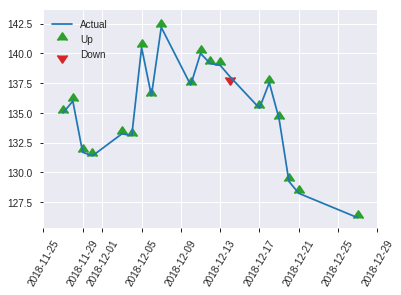


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2578000255758745
RMSE: 0.5077401161774343
LogLoss: 0.7093889915076292
Mean Per-Class Error: 0.43846153846153846
AUC: 0.5124414715719063
pr_auc: 0.47172371531210167
Gini: 0.024882943143812675
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2980837821960449: 


,0,1,Error,Rate
0,4.0,126.0,0.9692,(126.0/130.0)
1,1.0,114.0,0.0087,(1.0/115.0)
Total,5.0,240.0,0.5184,(127.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2980838,0.6422535,239.0
max f2,0.2270448,0.8156028,244.0
max f0point5,0.4467987,0.5508982,179.0
max accuracy,0.6730106,0.5469388,13.0
max precision,0.7499615,1.0,0.0
max recall,0.2270448,1.0,244.0
max specificity,0.7499615,1.0,0.0
max absolute_mcc,0.4467987,0.1391247,179.0
max min_per_class_accuracy,0.5175235,0.4846154,122.0
max mean_per_class_accuracy,0.4467987,0.5615385,179.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 51.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.7072062,1.4202899,1.4202899,0.6666667,0.7275550,0.6666667,0.7275550,0.0173913,0.0173913,42.0289855,42.0289855
,2,0.0204082,0.6932316,0.0,0.8521739,0.0,0.6967292,0.4,0.7152246,0.0,0.0173913,-100.0,-14.7826087
,3,0.0326531,0.6863589,0.7101449,0.7989130,0.3333333,0.6907704,0.375,0.7060543,0.0086957,0.0260870,-28.9855072,-20.1086957
,4,0.0408163,0.6790341,2.1304348,1.0652174,1.0,0.6805047,0.5,0.7009444,0.0173913,0.0434783,113.0434783,6.5217391
,5,0.0530612,0.6738002,2.1304348,1.3110368,1.0,0.6762244,0.6153846,0.6952398,0.0260870,0.0695652,113.0434783,31.1036789
,6,0.1020408,0.6446506,0.7101449,1.0226087,0.3333333,0.6595769,0.48,0.6781216,0.0347826,0.1043478,-28.9855072,2.2608696
,7,0.1510204,0.6182208,1.0652174,1.0364277,0.5,0.6299330,0.4864865,0.6624928,0.0521739,0.1565217,6.5217391,3.6427732
,8,0.2,0.6044665,0.5326087,0.9130435,0.25,0.6116424,0.4285714,0.6500397,0.0260870,0.1826087,-46.7391304,-8.6956522
,9,0.3020408,0.5795607,1.1930435,1.0076381,0.56,0.5892006,0.4729730,0.6294859,0.1217391,0.3043478,19.3043478,0.7638073
,10,0.4,0.5517869,0.7101449,0.9347826,0.3333333,0.5658990,0.4387755,0.6139136,0.0695652,0.3739130,-28.9855072,-6.5217391


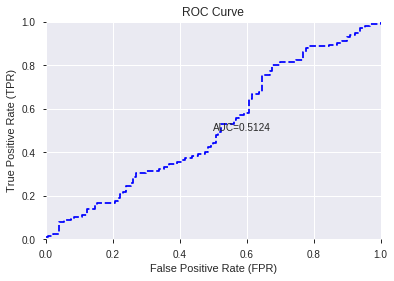

This function is available for GLM models only


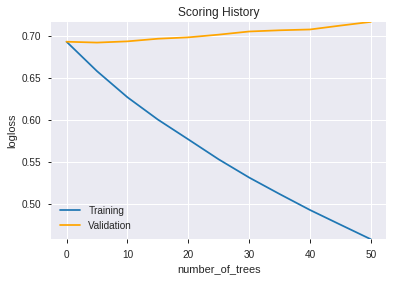

--2019-08-24 20:50:28--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.104.27
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.104.27|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

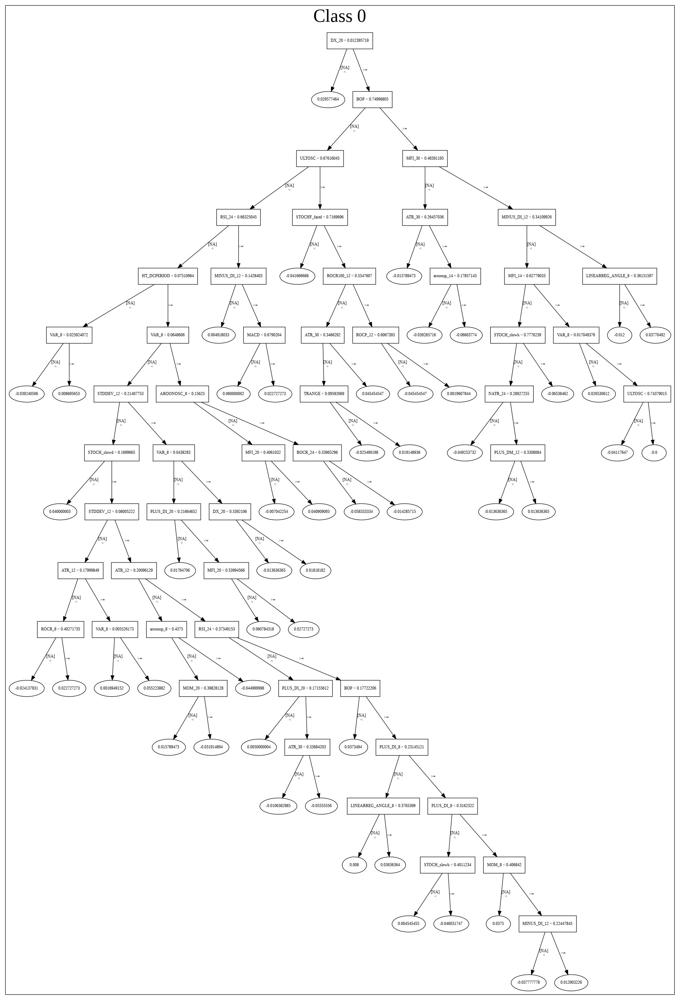

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190824_204944',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190824_204944',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_a456',
   'type

In [18]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_205034_model_4,0.569900,5.554542,0.500000,0.596557,0.355881
1,DeepLearning_grid_1_AutoML_20190824_205034_model_5,0.559599,5.270028,0.480769,0.577823,0.333879
2,DeepLearning_grid_1_AutoML_20190824_205034_model_3,0.557993,5.523725,0.500000,0.586677,0.344190
3,DeepLearning_grid_1_AutoML_20190824_205034_model_7,0.556589,5.364532,0.500000,0.599700,0.359640
4,DeepLearning_1_AutoML_20190824_205034,0.549766,5.648432,0.496154,0.606644,0.368017
5,DeepLearning_grid_1_AutoML_20190824_205034_model_6,0.547291,5.501474,0.500000,0.598955,0.358747
6,DeepLearning_grid_1_AutoML_20190824_205034_model_1,0.543211,6.603057,0.500000,0.612663,0.375356
7,DeepLearning_grid_1_AutoML_20190824_205034_model_2,0.542274,6.344056,0.500000,0.605522,0.366657


,variable,relative_importance,scaled_importance,percentage
0,CDLKICKING,1.000000,1.000000,0.028118
1,CDLIDENTICAL3CROWS,0.967876,0.967876,0.027214
2,CDL2CROWS,0.960489,0.960489,0.027007
3,CDL3LINESTRIKE,0.945104,0.945104,0.026574
4,CDLTHRUSTING,0.944666,0.944666,0.026562
5,CDLSTICKSANDWICH,0.915456,0.915456,0.025740
6,CDLINNECK,0.911970,0.911970,0.025642
7,CDLLADDERBOTTOM,0.906247,0.906247,0.025482
8,CDLPIERCING,0.896911,0.896911,0.025219
9,CDLCOUNTERATTACK,0.895224,0.895224,0.025172


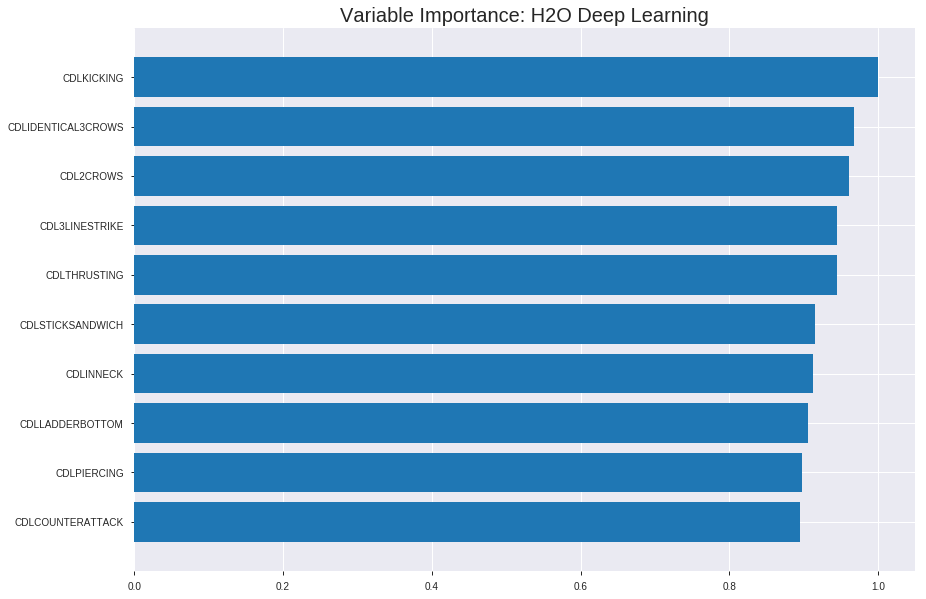

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_205034_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2585179062592051
RMSE: 0.508446561852084
LogLoss: 0.7727144956813488
Mean Per-Class Error: 0.42094790655323167
AUC: 0.6015025478999709
pr_auc: 0.5961536048402308
Gini: 0.20300509579994186
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3075860953690589: 


,0,1,Error,Rate
0,37.0,767.0,0.954,(767.0/804.0)
1,12.0,895.0,0.0132,(12.0/907.0)
Total,49.0,1662.0,0.4553,(779.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3075861,0.6967692,367.0
max f2,0.1292556,0.8498876,396.0
max f0point5,0.5502496,0.6116355,241.0
max accuracy,0.5512267,0.5862069,240.0
max precision,0.9970837,0.8095238,2.0
max recall,0.1292556,1.0,396.0
max specificity,0.9998804,0.9925373,0.0
max absolute_mcc,0.5512267,0.1628733,240.0
max min_per_class_accuracy,0.6006273,0.5722161,204.0
max mean_per_class_accuracy,0.5512267,0.5790521,240.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 62.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.9999365,1.7816367,1.7816367,0.9444444,0.9999783,0.9444444,0.9999783,0.0187431,0.0187431,78.1636653,78.1636653
,2,0.0204559,0.9973044,1.2206369,1.5091510,0.6470588,0.9992748,0.8,0.9996366,0.0121279,0.0308710,22.0636877,50.9151047
,3,0.0303916,0.9932694,1.3316039,1.4511068,0.7058824,0.9958827,0.7692308,0.9984094,0.0132304,0.0441014,33.1603865,45.1106776
,4,0.0403273,0.9850687,1.5535378,1.4763434,0.8235294,0.9894001,0.7826087,0.9961897,0.0154355,0.0595369,55.3537843,47.6343416
,5,0.0502630,0.9779189,1.3316039,1.4477321,0.7058824,0.9817327,0.7674419,0.9933319,0.0132304,0.0727674,33.1603865,44.7732109
,6,0.1005260,0.9100271,1.0967667,1.2722494,0.5813953,0.9470618,0.6744186,0.9701969,0.0551268,0.1278942,9.6766750,27.2249430
,7,0.1502046,0.8328457,1.2206369,1.2551791,0.6470588,0.8743357,0.6653696,0.9384918,0.0606395,0.1885336,22.0636877,25.5179130
,8,0.2004676,0.7635297,0.9432194,1.1769618,0.5,0.7912901,0.6239067,0.9015841,0.0474090,0.2359427,-5.6780595,17.6961823
,9,0.3004091,0.7051639,1.1473078,1.1670964,0.6081871,0.7331885,0.6186770,0.8455615,0.1146637,0.3506064,14.7307814,16.7096384
,10,0.4003507,0.6488221,1.0149261,1.1291094,0.5380117,0.6747028,0.5985401,0.8029091,0.1014333,0.4520397,1.4926143,12.9109360




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.39468530065303953
RMSE: 0.6282398432549782
LogLoss: 9.053164416365844
Mean Per-Class Error: 0.5
AUC: 0.44880799621800505
pr_auc: 0.2810133377393157
Gini: -0.10238400756398991
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.05028060410394341: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0502806,0.7080581,242.0
max f2,0.0502806,0.8584241,242.0
max f0point5,0.0502806,0.6025180,242.0
max accuracy,0.0502806,0.5480573,242.0
max precision,0.0502806,0.5480573,242.0
max recall,0.0502806,1.0,242.0
max specificity,1.0000000,0.4479638,0.0
max absolute_mcc,0.3571125,0.1174744,230.0
max min_per_class_accuracy,1.0000000,0.4479638,0.0
max mean_per_class_accuracy,0.0502806,0.5,242.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 81.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.4989775,1.0,0.9272694,0.9272694,0.5081967,1.0,0.5081967,1.0,0.4626866,0.4626866,-7.2730609,-7.2730609
,2,0.5010225,1.0000000,0.0,0.9234846,0.0,1.0000000,0.5061224,1.0000000,0.0,0.4626866,-100.0,-7.6515382
,3,0.5991820,0.7972046,0.9503265,0.9278819,0.5208333,0.9276432,0.5085324,0.9881463,0.0932836,0.5559701,-4.9673507,-7.2118079
,4,0.6993865,0.6493988,1.0426439,0.9443244,0.5714286,0.7181117,0.5175439,0.9494572,0.1044776,0.6604478,4.2643923,-5.5675570
,5,0.7995910,0.5610219,1.2288303,0.9799786,0.6734694,0.6018084,0.5370844,0.9058899,0.1231343,0.7835821,22.8830338,-2.0021376
,6,0.8997955,0.4790184,1.0426439,0.9869573,0.5714286,0.5227023,0.5409091,0.8632168,0.1044776,0.8880597,4.2643923,-1.3042741
,7,1.0,0.0502806,1.1171185,1.0,0.6122449,0.3854354,0.5480573,0.8153409,0.1119403,1.0,11.7118489,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:52:19,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 20:52:27,8.412 sec,294 obs/sec,1.3255406,1,2268.0,0.6281748,1.5110119,-0.5841553,0.5370611,0.5581525,1.3624280,0.4699006,0.7037547,10.0759857,-0.9995548,0.5287195,0.5573971,0.7298507,0.4519427
,2019-08-24 20:52:37,18.463 sec,390 obs/sec,3.9006429,3,6674.0,0.5627293,1.0207793,-0.2712639,0.5652978,0.5674832,1.5720323,0.4628872,0.6657613,9.6020503,-0.7894835,0.5330249,0.5699790,1.0947761,0.4519427
,2019-08-24 20:52:45,26.837 sec,451 obs/sec,6.5330216,5,11178.0,0.5323134,0.8882804,-0.1375526,0.5799784,0.5775857,1.7816367,0.4593805,0.6357636,9.1266003,-0.6318563,0.4499477,0.2815107,0.9272694,0.4519427
,2019-08-24 20:52:52,34.258 sec,500 obs/sec,9.2144944,7,15766.0,0.5401517,0.8769619,-0.1713001,0.5933199,0.6097491,1.7816367,0.4564582,0.6538458,9.0894628,-0.7260020,0.4475248,0.2822318,0.9272694,0.4519427
,2019-08-24 20:53:01,43.237 sec,567 obs/sec,13.2022209,10,22589.0,0.5084466,0.7727145,-0.0378326,0.6015025,0.5961536,1.7816367,0.4552893,0.6282398,9.0531644,-0.5934616,0.4488080,0.2810133,0.9272694,0.4519427
,2019-08-24 20:53:09,51.051 sec,628 obs/sec,17.2355348,13,29490.0,0.5013686,0.7185329,-0.0091388,0.6149990,0.6322196,1.8864388,0.4213910,0.6480516,9.3004878,-0.6955470,0.5184372,0.5464665,1.0947761,0.4519427
,2019-08-24 20:53:18,59.861 sec,701 obs/sec,22.5821157,17,38638.0,0.5277394,0.8575145,-0.1180872,0.6149668,0.6069835,1.6768345,0.4260666,0.6347422,9.1826507,-0.6266175,0.4356808,0.2733221,0.9196708,0.4478528
,2019-08-24 20:53:19,1 min 0.557 sec,701 obs/sec,22.5821157,17,38638.0,0.5084466,0.7727145,-0.0378326,0.6015025,0.5961536,1.7816367,0.4552893,0.6282398,9.0531644,-0.5934616,0.4488080,0.2810133,0.9272694,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLKICKING,1.0,1.0,0.0281176
CDLIDENTICAL3CROWS,0.9678755,0.9678755,0.0272143
CDL2CROWS,0.9604888,0.9604888,0.0270066
CDL3LINESTRIKE,0.9451041,0.9451041,0.0265741
CDLTHRUSTING,0.9446661,0.9446661,0.0265617
---,---,---,---
HT_TRENDMODE,0.4601470,0.4601470,0.0129382
weekday_name,0.4529428,0.4529428,0.0127357
dayofweek,0.4483482,0.4483482,0.0126065
SIN,0.4410069,0.4410069,0.0124001



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5714285714285714)

('F1', 0.6388888888888888)

('auc', 0.5698996655518395)

('logloss', 5.554542056679436)

('mean_per_class_error', 0.42441471571906364)

('rmse', 0.5965574527873339)

('mse', 0.3558807944761121)

deeplearning prediction progress: |███████████████████████████████████████| 100%


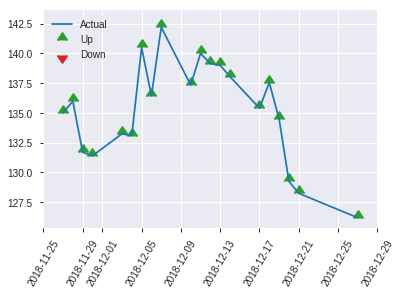


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.3558807944761121
RMSE: 0.5965574527873339
LogLoss: 5.554542056679436
Mean Per-Class Error: 0.42441471571906364
AUC: 0.5698996655518395
pr_auc: 0.3221324357772613
Gini: 0.13979933110367893
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17609226194766356: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1760923,0.6388889,169.0
max f2,0.1760923,0.8156028,169.0
max f0point5,0.6944130,0.5547226,62.0
max accuracy,0.7017332,0.5714286,60.0
max precision,1.0000000,0.5526316,0.0
max recall,0.1760923,1.0,169.0
max specificity,1.0000000,0.7384615,0.0
max absolute_mcc,0.6944130,0.1521095,62.0
max min_per_class_accuracy,0.7332275,0.5615385,46.0
max mean_per_class_accuracy,0.6944130,0.5755853,62.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 75.75 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.3061224,1.0,1.1646377,1.1646377,0.5466667,1.0,0.5466667,1.0,0.3565217,0.3565217,16.4637681,16.4637681
,2,0.4,0.8757106,1.1115312,1.1521739,0.5217391,0.9662887,0.5408163,0.9920882,0.1043478,0.4608696,11.1531191,15.2173913
,3,0.5020408,0.7324400,1.1078261,1.1431601,0.52,0.7921229,0.5365854,0.9514448,0.1130435,0.5739130,10.7826087,14.3160127
,4,0.6,0.6697008,0.7989130,1.0869565,0.375,0.7027797,0.5102041,0.9108464,0.0782609,0.6521739,-20.1086957,8.6956522
,5,0.6979592,0.6079387,0.8876812,1.0589880,0.4166667,0.6357194,0.4970760,0.8722321,0.0869565,0.7391304,-11.2318841,5.8988050
,6,0.8,0.5517195,1.0226087,1.0543478,0.48,0.5847204,0.4948980,0.8355597,0.1043478,0.8434783,2.2608696,5.4347826
,7,0.8979592,0.4616691,0.7101449,1.0167984,0.3333333,0.5055276,0.4772727,0.7995562,0.0695652,0.9130435,-28.9855072,1.6798419
,8,1.0,0.1760923,0.8521739,1.0,0.4,0.3872993,0.4693878,0.7574892,0.0869565,1.0,-14.7826087,0.0


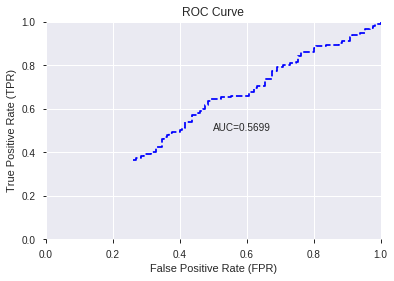

This function is available for GLM models only


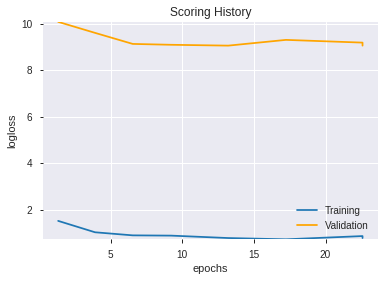

--2019-08-24 20:56:23--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


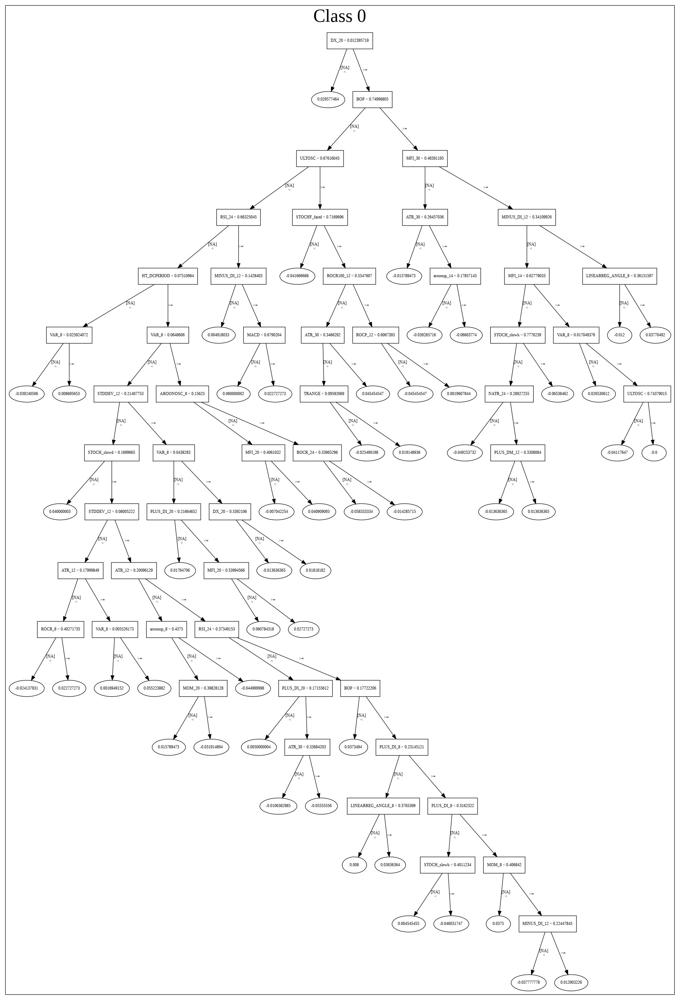

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_205034_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_205034_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLKICKING',
 'CDLIDENTICAL3CROWS',
 'CDL2CROWS',
 'CDL3LINESTRIKE',
 'CDLTHRUSTING',
 'CDLSTICKSANDWICH',
 'CDLINNECK',
 'CDLLADDERBOTTOM',
 'CDLPIERCING',
 'CDLCOUNTERATTACK',
 'CDLEVENINGDOJISTAR',
 'CDLONNECK',
 'CDLTASUKIGAP',
 'CDLXSIDEGAP3METHODS',
 'TAN',
 'EXP',
 'CDLSTALLEDPATTERN',
 'CDLUNIQUE3RIVER',
 'CDLSEPARATINGLINES',
 'CDLMORNINGDOJISTAR',
 'SINH',
 'CDLEVENINGSTAR',
 'CDLGAPSIDESIDEWHITE',
 'COSH',
 'CDLSHOOTINGSTAR',
 'is_quarter_start',
 'CDLMORNINGSTAR',
 'is_quarter_end',
 'CDLADVANCEBLOCK',
 'CDLHOMINGPIGEON',
 'CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'CDL3INSIDE',
 'CDLDRAGONFLYDOJI',
 'CDLMATCHINGLOW',
 'is_month_end',
 'CDLINVERTEDHAMMER',
 'CDLDARKCLOUDCOVER',
 'CDLHAMMER',
 'is_month_start',
 'CDLHANGINGMAN',
 'CDLHIKKAKE',
 'COS',
 'days_in_month',
 'day',
 'HT_TRENDMODE',
 'weekday_name',
 'dayofweek',
 'SIN',
 'weekday']

In [19]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_205630_model_1,0.487793,6.075592,0.5,0.587453,0.345101


,variable,relative_importance,scaled_importance,percentage
0,CDLXSIDEGAP3METHODS,0.009191,1.000000,0.048084
1,is_month_start,0.008545,0.929745,0.044706
2,CDLSTICKSANDWICH,0.008492,0.924011,0.044430
3,CDLMATCHINGLOW,0.008027,0.873370,0.041995
4,CDLTHRUSTING,0.007628,0.829934,0.039906
5,is_quarter_start,0.006841,0.744380,0.035793
6,CDLSHOOTINGSTAR,0.006669,0.725593,0.034889
7,CDLLADDERBOTTOM,0.005875,0.639212,0.030736
8,CDLKICKING,0.005350,0.582119,0.027990
9,CDLINNECK,0.005258,0.572080,0.027508


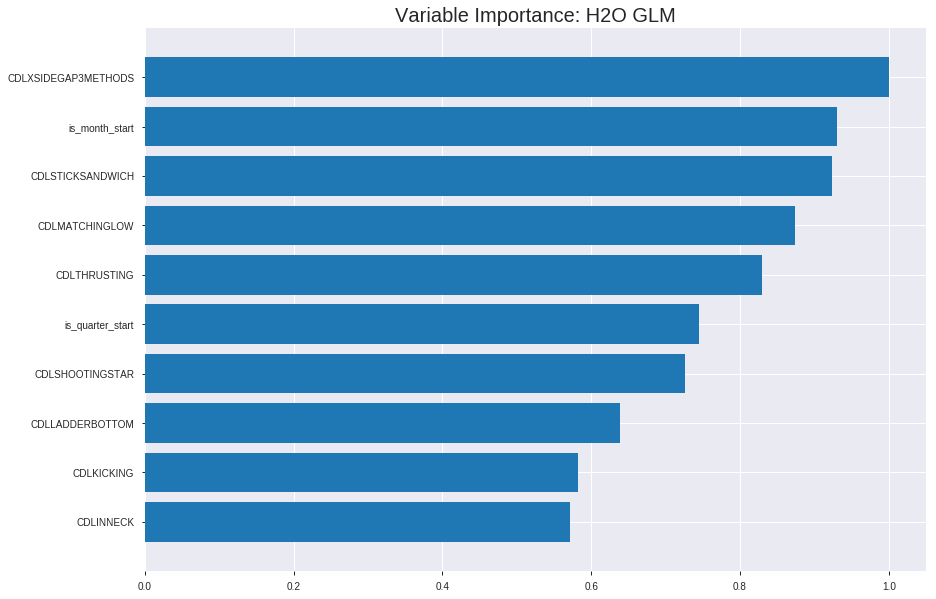

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_205630_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24768108137920605
RMSE: 0.4976756789106798
LogLoss: 0.6884920819283075
Null degrees of freedom: 1710
Residual degrees of freedom: 1660
Null deviance: 2365.745433910457
Residual deviance: 2356.019904358668
AIC: 2458.019904358668
AUC: 0.5840429879269584
pr_auc: 0.6188509306522245
Gini: 0.16808597585391682
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5043909948010018: 


,0,1,Error,Rate
0,17.0,787.0,0.9789,(787.0/804.0)
1,1.0,906.0,0.0011,(1.0/907.0)
Total,18.0,1693.0,0.4605,(788.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5043910,0.6969231,381.0
max f2,0.5043910,0.8513437,381.0
max f0point5,0.5277759,0.5977462,260.0
max accuracy,0.5285096,0.5663355,241.0
max precision,0.5798026,1.0,0.0
max recall,0.4952310,1.0,390.0
max specificity,0.5798026,1.0,0.0
max absolute_mcc,0.5313976,0.1285693,170.0
max min_per_class_accuracy,0.5295491,0.5559701,212.0
max mean_per_class_accuracy,0.5297474,0.5618017,208.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 53.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.5617154,1.8864388,1.8864388,1.0,0.5705990,1.0,0.5705990,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.5553756,1.3316039,1.6169476,0.7058824,0.5582239,0.8571429,0.5645883,0.0132304,0.0330761,33.1603865,61.6947551
,3,0.0303916,0.5487908,1.2206369,1.4873844,0.6470588,0.5509440,0.7884615,0.5601276,0.0121279,0.0452040,22.0636877,48.7384446
,4,0.0403273,0.5455981,1.5535378,1.5036831,0.8235294,0.5473742,0.7971014,0.5569855,0.0154355,0.0606395,55.3537843,50.3683109
,5,0.0502630,0.5428032,0.9987029,1.4038614,0.5294118,0.5440971,0.7441860,0.5544378,0.0099228,0.0705623,-0.1297101,40.3861439
,6,0.1005260,0.5376646,1.2283788,1.3161201,0.6511628,0.5402350,0.6976744,0.5473364,0.0617420,0.1323043,22.8378760,31.6120099
,7,0.1502046,0.5330813,1.1318633,1.2551791,0.6,0.5348136,0.6653696,0.5431946,0.0562293,0.1885336,13.1863286,25.5179130
,8,0.2004676,0.5319933,1.0748314,1.2099608,0.5697674,0.5324952,0.6413994,0.5405120,0.0540243,0.2425579,7.4831415,20.9960752
,9,0.3004091,0.5309503,1.0921488,1.1707665,0.5789474,0.5314362,0.6206226,0.5374926,0.1091510,0.3517089,9.2148784,17.0766498
,10,0.4003507,0.5302295,0.9266717,1.1098319,0.4912281,0.5305593,0.5883212,0.5357618,0.0926130,0.4443219,-7.3328304,10.9831883




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.37800258110109525
RMSE: 0.6148191450346152
LogLoss: 9.085747366587832
Null degrees of freedom: 488
Residual degrees of freedom: 438
Null deviance: 674.0077116277507
Residual deviance: 170220.41269527242
AIC: 170322.41269527242
AUC: 0.530196866346998
pr_auc: 0.5544138964679746
Gini: 0.06039373269399606
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.9995676269896874e-56: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.7080581,249.0
max f2,0.0000000,0.8584241,249.0
max f0point5,0.0000000,0.6025180,249.0
max accuracy,0.0000000,0.5480573,249.0
max precision,0.5664651,0.6666667,2.0
max recall,0.0000000,1.0,249.0
max specificity,0.5721167,0.9954751,0.0
max absolute_mcc,0.3934006,0.0897350,240.0
max min_per_class_accuracy,0.0000000,0.5410448,245.0
max mean_per_class_accuracy,0.3934006,0.5450716,240.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 26.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.5544595,0.7298507,0.7298507,0.4,0.5641468,0.4,0.5641468,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.5476691,0.7298507,0.7298507,0.4,0.5512119,0.4,0.5576794,0.0074627,0.0149254,-27.0149254,-27.0149254
,3,0.0306748,0.5420214,1.4597015,0.9731343,0.8,0.5435846,0.5333333,0.5529811,0.0149254,0.0298507,45.9701493,-2.6865672
,4,0.0408998,0.5402963,0.7298507,0.9123134,0.4,0.5411777,0.5,0.5500303,0.0074627,0.0373134,-27.0149254,-8.7686567
,5,0.0511247,0.5371927,0.3649254,0.8028358,0.2,0.5390254,0.44,0.5478293,0.0037313,0.0410448,-63.5074627,-19.7164179
,6,0.1002045,0.5318864,0.8362873,0.8192202,0.4583333,0.5332875,0.4489796,0.5407068,0.0410448,0.0820896,-16.3712687,-18.0779775
,7,0.1513292,0.5307651,1.0947761,0.9123134,0.6,0.5312658,0.5,0.5375173,0.0559701,0.1380597,9.4776119,-8.7686567
,8,0.2004090,0.5297729,1.2164179,0.9867880,0.6666667,0.5302188,0.5408163,0.5357299,0.0597015,0.1977612,21.6417910,-1.3212001
,9,0.3006135,0.5286263,1.1543558,1.0426439,0.6326531,0.5291635,0.5714286,0.5335411,0.1156716,0.3134328,15.4355772,4.2643923
,10,0.4008180,0.5267018,1.1171185,1.0612626,0.6122449,0.5277380,0.5816327,0.5320903,0.1119403,0.4253731,11.7118489,6.1262565



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 20:56:30,0.000 sec,2,.27E1,51,1.3769842,348.0990035
,2019-08-24 20:56:30,0.005 sec,4,.17E1,51,1.3743013,349.2264555
,2019-08-24 20:56:30,0.009 sec,6,.11E1,51,1.3708251,350.6263352
,2019-08-24 20:56:30,0.014 sec,8,.65E0,51,1.3666926,351.6193405
,2019-08-24 20:56:30,0.018 sec,10,.41E0,51,1.3622620,352.4569686


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.563265306122449)

('F1', 0.6388888888888888)

('auc', 0.4877926421404682)

('logloss', 6.075591674593961)

('mean_per_class_error', 0.4612040133779264)

('rmse', 0.5874527495316523)

('mse', 0.3451007329322982)

glm prediction progress: |████████████████████████████████████████████████| 100%


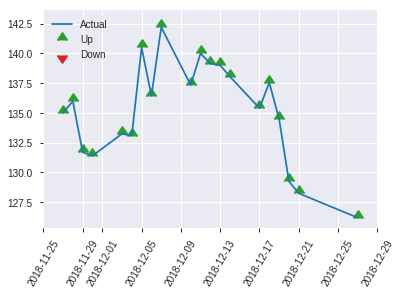


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.3451007329322982
RMSE: 0.5874527495316523
LogLoss: 6.075591674593961
Null degrees of freedom: 244
Residual degrees of freedom: 194
Null deviance: 342.33973069416305
Residual deviance: 47726.661542795
AIC: 47828.661542795
AUC: 0.4877926421404682
pr_auc: 0.4922715027852671
Gini: -0.024414715719063618
Confusion Matrix (Act/Pred) for max f1 @ threshold = 7.328298583962946e-68: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6388889,175.0
max f2,0.0000000,0.8156028,175.0
max f0point5,0.0000000,0.5251142,175.0
max accuracy,0.5330364,0.5632653,23.0
max precision,0.5399439,0.7272727,10.0
max recall,0.0000000,1.0,175.0
max specificity,0.5722479,0.9923077,0.0
max absolute_mcc,0.5330364,0.1302674,23.0
max min_per_class_accuracy,0.5268144,0.4692308,122.0
max mean_per_class_accuracy,0.5330364,0.5387960,23.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 35.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.5508796,0.7101449,0.7101449,0.3333333,0.5659235,0.3333333,0.5659235,0.0086957,0.0086957,-28.9855072,-28.9855072
,2,0.0204082,0.5421249,2.1304348,1.2782609,1.0,0.5432505,0.6,0.5568543,0.0173913,0.0260870,113.0434783,27.8260870
,3,0.0326531,0.5411604,1.4202899,1.3315217,0.6666667,0.5417742,0.625,0.5511993,0.0173913,0.0434783,42.0289855,33.1521739
,4,0.0408163,0.5401005,2.1304348,1.4913043,1.0,0.5408763,0.7,0.5491347,0.0173913,0.0608696,113.0434783,49.1304348
,5,0.0530612,0.5389569,1.4202899,1.4749164,0.6666667,0.5395287,0.6923077,0.5469179,0.0173913,0.0782609,42.0289855,47.4916388
,6,0.1020408,0.5329859,1.2427536,1.3634783,0.5833333,0.5343773,0.64,0.5408984,0.0608696,0.1391304,24.2753623,36.3478261
,7,0.1510204,0.5311552,0.8876812,1.2091657,0.4166667,0.5319854,0.5675676,0.5380077,0.0434783,0.1826087,-11.2318841,20.9165687
,8,0.2,0.5304868,0.8876812,1.1304348,0.4166667,0.5307348,0.5306122,0.5362266,0.0434783,0.2260870,-11.2318841,13.0434783
,9,0.3020408,0.5293911,0.9373913,1.0652174,0.44,0.5300012,0.5,0.5341234,0.0956522,0.3217391,-6.2608696,6.5217391
,10,0.4,0.5283271,0.7989130,1.0,0.375,0.5288297,0.4693878,0.5328270,0.0782609,0.4,-20.1086957,0.0


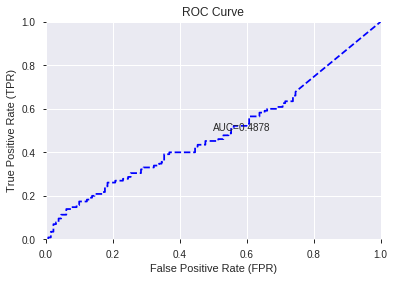

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


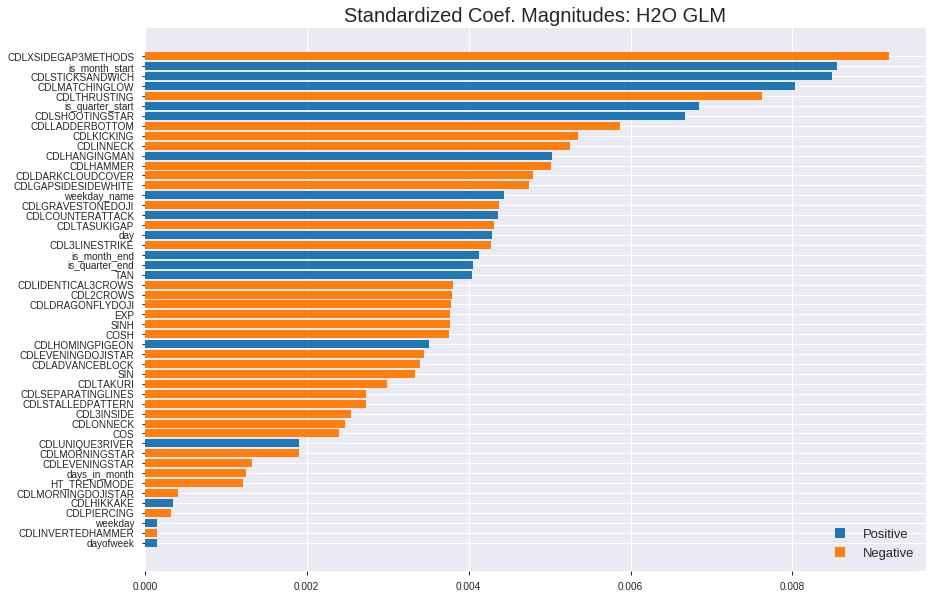

'log_likelihood'
--2019-08-24 20:56:35--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.93.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.93.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


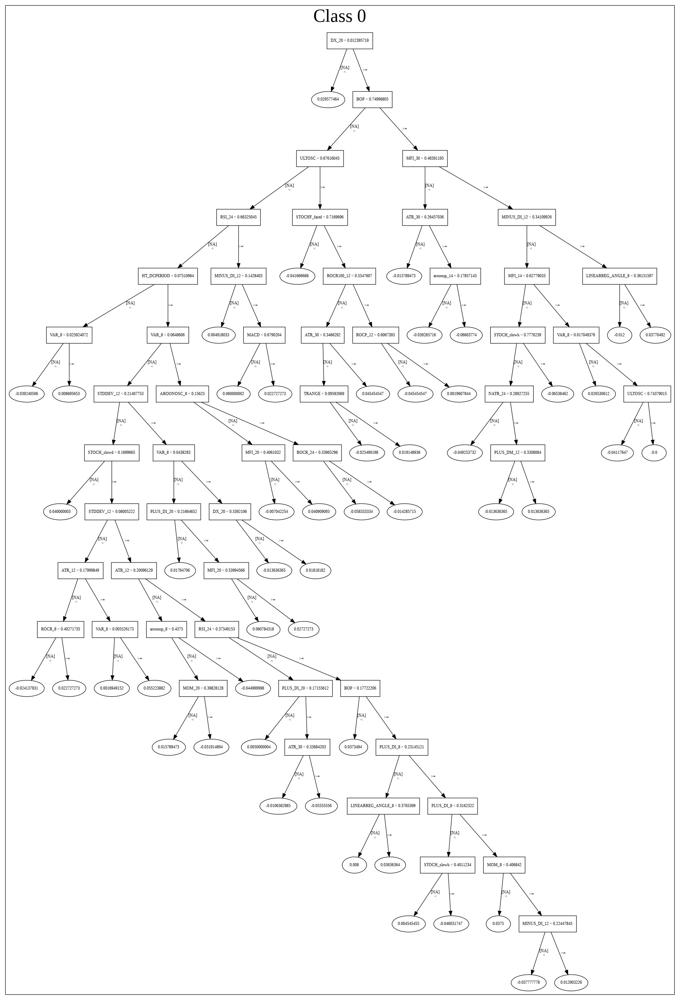

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_205630_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_205630_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['CDLXSIDEGAP3METHODS',
 'is_month_start',
 'CDLSTICKSANDWICH',
 'CDLMATCHINGLOW',
 'CDLTHRUSTING',
 'is_quarter_start',
 'CDLSHOOTINGSTAR',
 'CDLLADDERBOTTOM',
 'CDLKICKING',
 'CDLINNECK',
 'CDLHANGINGMAN',
 'CDLHAMMER',
 'CDLDARKCLOUDCOVER',
 'CDLGAPSIDESIDEWHITE',
 'weekday_name',
 'CDLGRAVESTONEDOJI',
 'CDLCOUNTERATTACK',
 'CDLTASUKIGAP',
 'day',
 'CDL3LINESTRIKE',
 'is_month_end',
 'is_quarter_end',
 'TAN',
 'CDLIDENTICAL3CROWS',
 'CDL2CROWS',
 'CDLDRAGONFLYDOJI',
 'EXP',
 'SINH',
 'COSH',
 'CDLHOMINGPIGEON',
 'CDLEVENINGDOJISTAR',
 'CDLADVANCEBLOCK',
 'SIN',
 'CDLTAKURI',
 'CDLSEPARATINGLINES',
 'CDLSTALLEDPATTERN',
 'CDL3INSIDE',
 'CDLONNECK',
 'COS',
 'CDLUNIQUE3RIVER',
 'CDLMORNINGSTAR',
 'CDLEVENINGSTAR',
 'days_in_month',
 'HT_TRENDMODE',
 'CDLMORNINGDOJISTAR',
 'CDLHIKKAKE',
 'CDLPIERCING',
 'weekday',
 'CDLINVERTEDHAMMER',
 'dayofweek']

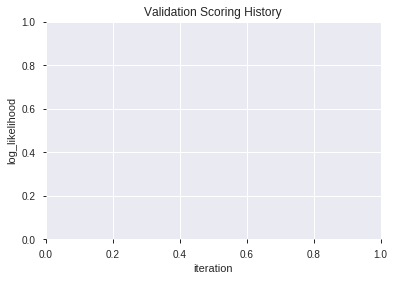

In [20]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_205641_model_1,0.542943,0.697560,0.500000,0.502140,0.252144
1,XGBoost_2_AutoML_20190824_205641,0.531973,0.701757,0.485117,0.504150,0.254167
2,XGBoost_grid_1_AutoML_20190824_205641_model_6,0.528763,0.704716,0.500000,0.505482,0.255512
3,XGBoost_grid_1_AutoML_20190824_205641_model_7,0.524816,0.712428,0.492308,0.509268,0.259354
4,XGBoost_1_AutoML_20190824_205641,0.521605,0.714751,0.496154,0.510158,0.260261
5,XGBoost_grid_1_AutoML_20190824_205641_model_3,0.519732,0.708239,0.484615,0.507162,0.257213
6,XGBoost_grid_1_AutoML_20190824_205641_model_4,0.516522,0.702172,0.467391,0.504413,0.254433
7,XGBoost_grid_1_AutoML_20190824_205641_model_2,0.511706,0.700168,0.492308,0.503491,0.253503
8,XGBoost_3_AutoML_20190824_205641,0.509833,0.711794,0.500000,0.508794,0.258872
9,XGBoost_grid_1_AutoML_20190824_205641_model_5,0.474114,0.770411,0.496154,0.533965,0.285119


,variable,relative_importance,scaled_importance,percentage
0,COS,481.024933,1.000000,0.258520
1,day,326.259979,0.678260,0.175344
2,COSH,243.383148,0.505968,0.130803
3,TAN,213.566727,0.443983,0.114778
4,SIN,205.591461,0.427403,0.110492
5,dayofweek,135.114716,0.280889,0.072615
6,weekday_name,42.880547,0.089144,0.023046
7,days_in_month,38.255814,0.079530,0.020560
8,CDLMATCHINGLOW,37.845776,0.078677,0.020340
9,weekday,32.828358,0.068247,0.017643


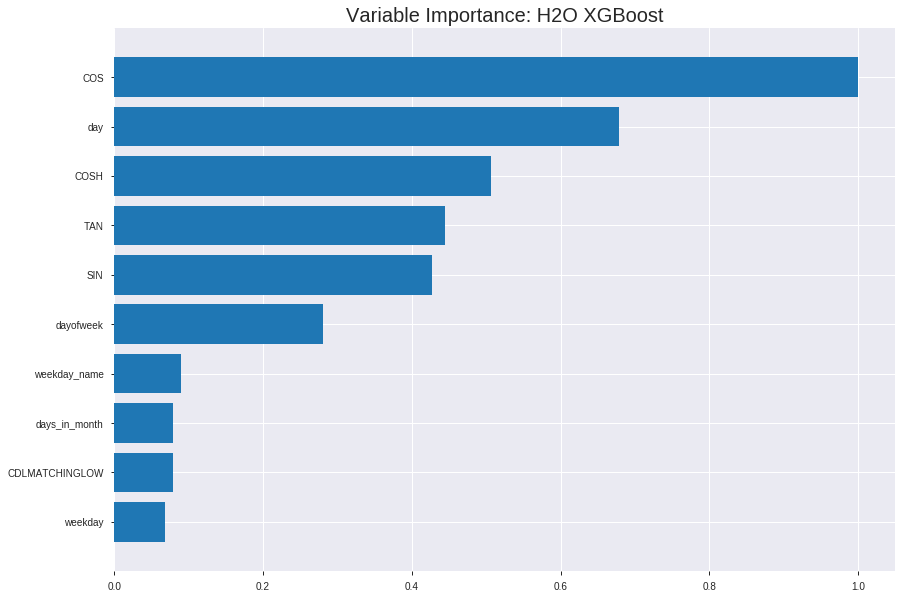

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_205641_model_1


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.22324202964893203
RMSE: 0.4724849517698231
LogLoss: 0.6384404697241085
Mean Per-Class Error: 0.32004873647199505
AUC: 0.7477112782284827
pr_auc: 0.76239211943026
Gini: 0.4954225564569654
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49786797910928726: 


,0,1,Error,Rate
0,368.0,436.0,0.5423,(436.0/804.0)
1,118.0,789.0,0.1301,(118.0/907.0)
Total,486.0,1225.0,0.3238,(554.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4978680,0.7401501,252.0
max f2,0.4169885,0.8576923,341.0
max f0point5,0.5352346,0.7029920,190.0
max accuracy,0.5065296,0.6808884,238.0
max precision,0.7656242,1.0,0.0
max recall,0.3540267,1.0,384.0
max specificity,0.7656242,1.0,0.0
max absolute_mcc,0.4978680,0.3625814,252.0
max min_per_class_accuracy,0.5267829,0.6766169,203.0
max mean_per_class_accuracy,0.5352346,0.6799513,190.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 52.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.7093568,1.8864388,1.8864388,1.0,0.7256371,1.0,0.7256371,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.6845562,1.8864388,1.8864388,1.0,0.6961477,1.0,0.7113136,0.0187431,0.0385888,88.6438809,88.6438809
,3,0.0303916,0.6740872,1.6645048,1.8138835,0.8823529,0.6794441,0.9615385,0.7008947,0.0165380,0.0551268,66.4504832,81.3883470
,4,0.0403273,0.6571903,1.6645048,1.7770800,0.8823529,0.6663420,0.9420290,0.6923817,0.0165380,0.0716648,66.4504832,77.7080038
,5,0.0502630,0.6443955,1.5535378,1.7328915,0.8235294,0.6495509,0.9186047,0.6839152,0.0154355,0.0871003,55.3537843,73.2891464
,6,0.1005260,0.6142541,1.6012795,1.6670855,0.8488372,0.6292427,0.8837209,0.6565789,0.0804851,0.1675854,60.1279454,66.7085459
,7,0.1502046,0.5961293,1.3981841,1.5781492,0.7411765,0.6043339,0.8365759,0.6392994,0.0694598,0.2370452,39.8184059,57.8149198
,8,0.2004676,0.5807948,1.3819261,1.5289504,0.7325581,0.5890997,0.8104956,0.6267129,0.0694598,0.3065050,38.1926104,52.8950405
,9,0.3004091,0.5611020,1.2907213,1.4496952,0.6842105,0.5713855,0.7684825,0.6083063,0.1289967,0.4355017,29.0721291,44.9695194
,10,0.4003507,0.5428600,1.2686577,1.4045019,0.6725146,0.5516587,0.7445255,0.5941651,0.1267916,0.5622933,26.8657679,40.4501887




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.25791841497789253
RMSE: 0.5078566874403571
LogLoss: 0.7097508778904759
Mean Per-Class Error: 0.48383365975552106
AUC: 0.48457655163098534
pr_auc: 0.5285368714276172
Gini: -0.030846896738029317
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33579230308532715: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3357923,0.7080581,399.0
max f2,0.3357923,0.8584241,399.0
max f0point5,0.3357923,0.6025180,399.0
max accuracy,0.3357923,0.5480573,399.0
max precision,0.5644150,0.5766423,119.0
max recall,0.3357923,1.0,399.0
max specificity,0.7354077,0.9954751,0.0
max absolute_mcc,0.6722495,0.1192654,15.0
max min_per_class_accuracy,0.5165325,0.5113122,204.0
max mean_per_class_accuracy,0.5644150,0.5161663,119.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 52.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.6913730,0.7298507,0.7298507,0.4,0.7042246,0.4,0.7042246,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.6840295,0.3649254,0.5473881,0.2,0.6876169,0.3,0.6959207,0.0037313,0.0111940,-63.5074627,-45.2611940
,3,0.0306748,0.6748039,0.3649254,0.4865672,0.2,0.6816476,0.2666667,0.6911630,0.0037313,0.0149254,-63.5074627,-51.3432836
,4,0.0408998,0.6675374,0.7298507,0.5473881,0.4,0.6716745,0.3,0.6862909,0.0074627,0.0223881,-27.0149254,-45.2611940
,5,0.0511247,0.6631428,1.0947761,0.6568657,0.6,0.6645944,0.36,0.6819516,0.0111940,0.0335821,9.4776119,-34.3134328
,6,0.1002045,0.6319616,1.0643657,0.8564575,0.5833333,0.6477293,0.4693878,0.6651896,0.0522388,0.0858209,6.4365672,-14.3542492
,7,0.1513292,0.6091820,1.2407463,0.9862848,0.68,0.6212052,0.5405405,0.6503300,0.0634328,0.1492537,24.0746269,-1.3715208
,8,0.2004090,0.5910369,1.0643657,1.0054066,0.5833333,0.5997371,0.5510204,0.6379399,0.0522388,0.2014925,6.4365672,0.5406640
,9,0.3006135,0.5594728,1.0798812,1.0302315,0.5918367,0.5732765,0.5646259,0.6163855,0.1082090,0.3097015,7.9881206,3.0231496
,10,0.4008180,0.5359429,0.9309321,1.0054066,0.5102041,0.5452796,0.5510204,0.5986090,0.0932836,0.4029851,-6.9067926,0.5406640



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:56:44,0.014 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4699006,0.5,0.6931472,0.5,0.0,1.0,0.4519427
,2019-08-24 20:56:44,0.059 sec,5.0,0.4956342,0.6844406,0.6538792,0.6810265,1.6768345,0.4155465,0.5003483,0.6938451,0.4798575,0.5384815,0.7298507,0.4519427
,2019-08-24 20:56:44,0.092 sec,10.0,0.4908572,0.6749364,0.6784010,0.6999539,1.7816367,0.3886616,0.5017026,0.6965849,0.4767931,0.5336845,1.0947761,0.4519427
,2019-08-24 20:56:44,0.126 sec,15.0,0.4876049,0.6684782,0.6915855,0.7099706,1.6768345,0.3728814,0.5025776,0.6983863,0.4763710,0.5326738,0.3649254,0.4519427
,2019-08-24 20:56:44,0.155 sec,20.0,0.4850529,0.6634031,0.7037730,0.7223466,1.7816367,0.3886616,0.5033425,0.6999887,0.4825505,0.5338078,0.3649254,0.4519427
,2019-08-24 20:56:44,0.198 sec,25.0,0.4822011,0.6577221,0.7119378,0.7252502,1.7816367,0.3746347,0.5050695,0.7035821,0.4736949,0.5275237,0.7298507,0.4519427
,2019-08-24 20:56:44,0.234 sec,30.0,0.4801199,0.6535964,0.7207691,0.7338705,1.8864388,0.3547633,0.5059042,0.7053933,0.4768437,0.5265760,0.3649254,0.4519427
,2019-08-24 20:56:44,0.271 sec,35.0,0.4775879,0.6485876,0.7325535,0.7458325,1.8864388,0.3389831,0.5063712,0.7064620,0.4851337,0.5306122,0.7298507,0.4519427
,2019-08-24 20:56:44,0.306 sec,40.0,0.4757122,0.6448593,0.7386723,0.7524434,1.8864388,0.3348919,0.5069309,0.7076790,0.4872527,0.5325048,0.7298507,0.4519427
,2019-08-24 20:56:44,0.341 sec,45.0,0.4738768,0.6412239,0.7450242,0.7585868,1.8864388,0.3196961,0.5072900,0.7085045,0.4872864,0.5312081,0.3649254,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
COS,481.0249329,1.0,0.2585200
day,326.2599792,0.6782600,0.1753438
COSH,243.3831482,0.5059678,0.1308028
TAN,213.5667267,0.4439827,0.1147784
SIN,205.5914612,0.4274029,0.1104922
---,---,---,---
CDLDARKCLOUDCOVER,7.8121591,0.0162407,0.0041985
is_month_start,4.7331543,0.0098397,0.0025438
CDLDRAGONFLYDOJI,2.7732291,0.0057653,0.0014904
CDLGRAVESTONEDOJI,2.1246610,0.0044169,0.0011419



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5755102040816327)

('F1', 0.6388888888888888)

('auc', 0.542943143812709)

('logloss', 0.6975603175135485)

('mean_per_class_error', 0.4391304347826087)

('rmse', 0.5021396119301456)

('mse', 0.25214418986935716)

xgboost prediction progress: |████████████████████████████████████████████| 100%


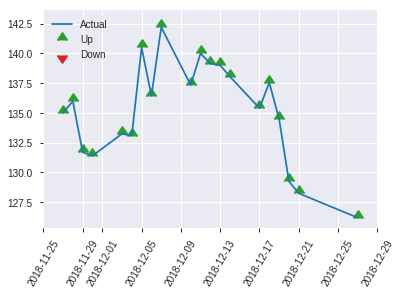


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25214418986935716
RMSE: 0.5021396119301456
LogLoss: 0.6975603175135485
Mean Per-Class Error: 0.4391304347826087
AUC: 0.542943143812709
pr_auc: 0.5193805645961951
Gini: 0.08588628762541806
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36325156688690186: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3632516,0.6388889,244.0
max f2,0.3632516,0.8156028,244.0
max f0point5,0.4414308,0.5265902,210.0
max accuracy,0.5769770,0.5755102,58.0
max precision,0.6956016,1.0,0.0
max recall,0.3632516,1.0,244.0
max specificity,0.6956016,1.0,0.0
max absolute_mcc,0.5769770,0.1397494,58.0
max min_per_class_accuracy,0.5222422,0.5307692,122.0
max mean_per_class_accuracy,0.5750831,0.5608696,62.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 52.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.6812487,1.4202899,1.4202899,0.6666667,0.6910330,0.6666667,0.6910330,0.0173913,0.0173913,42.0289855,42.0289855
,2,0.0204082,0.6684763,2.1304348,1.7043478,1.0,0.6783544,0.8,0.6859615,0.0173913,0.0347826,113.0434783,70.4347826
,3,0.0326531,0.6616090,1.4202899,1.5978261,0.6666667,0.6654862,0.75,0.6782833,0.0173913,0.0521739,42.0289855,59.7826087
,4,0.0408163,0.6494184,0.0,1.2782609,0.0,0.6537887,0.6,0.6733844,0.0,0.0521739,-100.0,27.8260870
,5,0.0530612,0.6420757,0.7101449,1.1471572,0.3333333,0.6460861,0.5384615,0.6670848,0.0086957,0.0608696,-28.9855072,14.7157191
,6,0.1020408,0.6163013,1.5978261,1.3634783,0.75,0.6248935,0.64,0.6468330,0.0782609,0.1391304,59.7826087,36.3478261
,7,0.1510204,0.5903717,0.7101449,1.1515864,0.3333333,0.6022525,0.5405405,0.6323744,0.0347826,0.1739130,-28.9855072,15.1586369
,8,0.2,0.5830821,1.2427536,1.1739130,0.5833333,0.5871486,0.5510204,0.6212987,0.0608696,0.2347826,24.2753623,17.3913043
,9,0.3020408,0.5682543,1.1930435,1.1803760,0.56,0.5757917,0.5540541,0.6059247,0.1217391,0.3565217,19.3043478,18.0376028
,10,0.4,0.5419106,0.8876812,1.1086957,0.4166667,0.5566252,0.5204082,0.5938514,0.0869565,0.4434783,-11.2318841,10.8695652


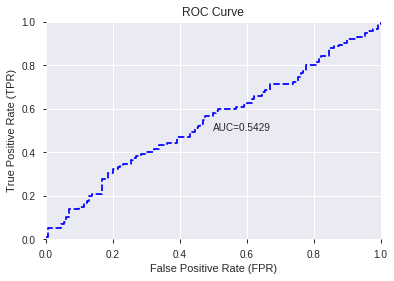

This function is available for GLM models only


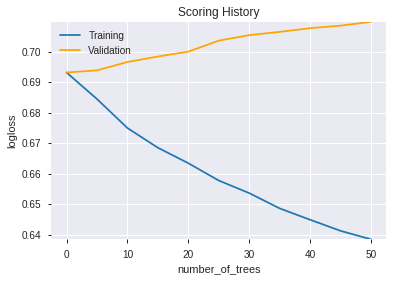

--2019-08-24 20:56:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.108.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.108.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

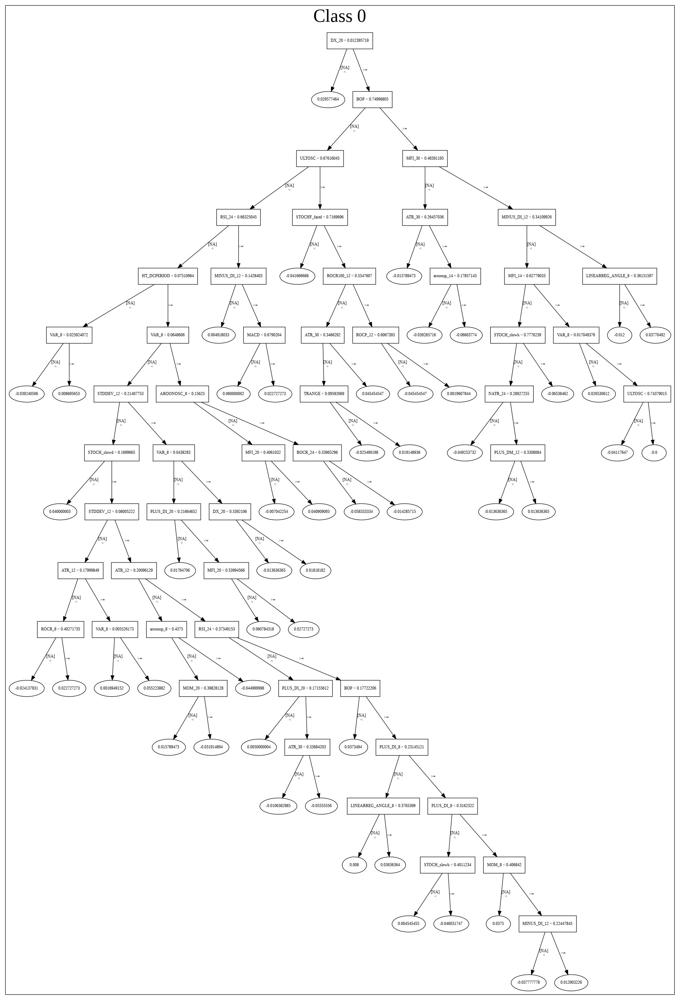

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_205641_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_205641_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['COS',
 'day',
 'COSH',
 'TAN',
 'SIN',
 'dayofweek',
 'weekday_name',
 'days_in_month',
 'CDLMATCHINGLOW',
 'weekday',
 'HT_TRENDMODE',
 'SINH',
 'CDLHANGINGMAN',
 'EXP',
 'CDLHIKKAKE',
 'CDLHAMMER',
 'CDLDARKCLOUDCOVER',
 'is_month_start',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'is_month_end']

In [21]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [23]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [24]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [25]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [27]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [28]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [29]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [31]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [32]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [33]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [35]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [36]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [37]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [39]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [40]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [41]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [43]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [44]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [45]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [46]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

0

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_205701_model_2,0.582575,5.347429,0.474080,0.614227,0.377275
1,DeepLearning_grid_1_AutoML_20190824_205701_model_3,0.579532,5.598888,0.470234,0.627195,0.393374
2,DeepLearning_grid_1_AutoML_20190824_205701_model_4,0.571973,6.036677,0.463043,0.663975,0.440863
3,DeepLearning_grid_1_AutoML_20190824_205701_model_1,0.548361,7.626527,0.454515,0.670095,0.449027
4,DeepLearning_grid_1_AutoML_20190824_205701_model_7,0.547559,5.542651,0.488963,0.596839,0.356217
5,DeepLearning_1_AutoML_20190824_205701,0.541037,5.367251,0.478428,0.581713,0.338390
6,DeepLearning_grid_1_AutoML_20190824_205701_model_5,0.516187,0.716473,0.500000,0.511367,0.261496
7,DeepLearning_grid_1_AutoML_20190824_205701_model_8,0.503846,0.702892,0.496154,0.504833,0.254856
8,DeepLearning_grid_1_AutoML_20190824_205701_model_6,0.501003,0.702477,0.500000,0.504629,0.254650
9,DeepLearning_grid_1_AutoML_20190824_205701_model_9,0.500000,0.702812,0.500000,0.504793,0.254816


,variable,relative_importance,scaled_importance,percentage
0,STOCHRSI_fastk,1.000000,1.000000,0.003126
1,weekday_name,0.996766,0.996766,0.003116
2,day,0.937282,0.937282,0.002930
3,CDLSTICKSANDWICH,0.900694,0.900694,0.002816
4,SIN,0.851114,0.851114,0.002661
5,CDLTHRUSTING,0.838645,0.838645,0.002622
6,CDLKICKING,0.828987,0.828987,0.002592
7,dayofweek,0.794655,0.794655,0.002484
8,weekday,0.788673,0.788673,0.002466
9,CDLINNECK,0.769195,0.769195,0.002405


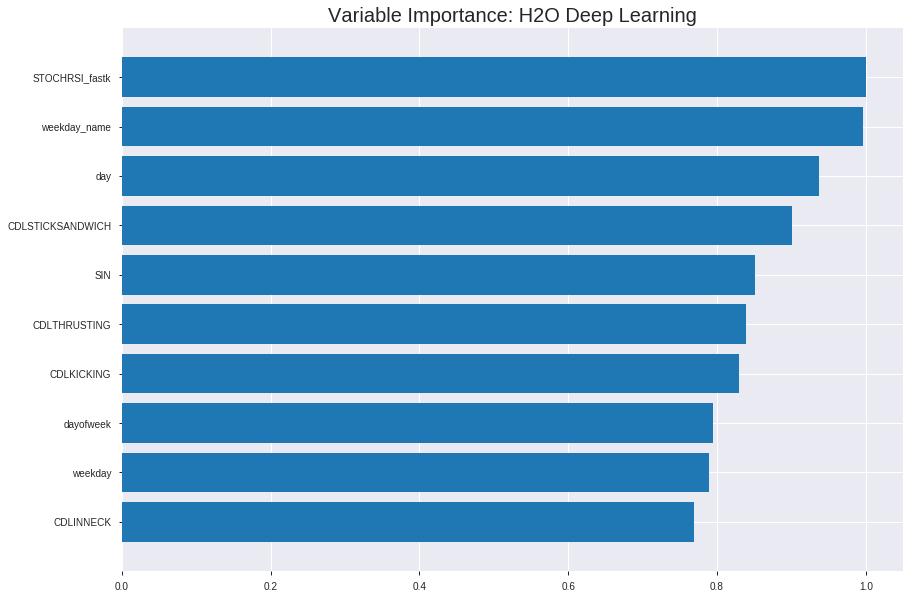

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_205701_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.27020506399513183
RMSE: 0.5198125277396957
LogLoss: 0.7918475680166761
Mean Per-Class Error: 0.41595906904287827
AUC: 0.6007503825963896
pr_auc: 0.6085823218181835
Gini: 0.20150076519277915
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.15472264552747347: 


,0,1,Error,Rate
0,42.0,762.0,0.9478,(762.0/804.0)
1,17.0,890.0,0.0187,(17.0/907.0)
Total,59.0,1652.0,0.4553,(779.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1547226,0.6955842,373.0
max f2,0.0411363,0.8498876,398.0
max f0point5,0.4907508,0.6154554,235.0
max accuracy,0.5324263,0.5902981,215.0
max precision,0.9992164,1.0,0.0
max recall,0.0411363,1.0,398.0
max specificity,0.9992164,1.0,0.0
max absolute_mcc,0.5324263,0.1719118,215.0
max min_per_class_accuracy,0.6101641,0.5758706,178.0
max mean_per_class_accuracy,0.5324263,0.5840409,215.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 60.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.9964094,1.4672302,1.4672302,0.7777778,0.9979387,0.7777778,0.9979387,0.0154355,0.0154355,46.7230185,46.7230185
,2,0.0204559,0.9901879,1.4425709,1.4552528,0.7647059,0.9937354,0.7714286,0.9958971,0.0143330,0.0297685,44.2570854,45.5252796
,3,0.0303916,0.9812342,1.3316039,1.4148291,0.7058824,0.9855018,0.75,0.9924986,0.0132304,0.0429989,33.1603865,41.4829107
,4,0.0403273,0.9666767,1.1096699,1.3396450,0.5882353,0.9733749,0.7101449,0.9877870,0.0110254,0.0540243,10.9669888,33.9644952
,5,0.0502630,0.9567312,0.7767689,1.2283788,0.4117647,0.9616351,0.6511628,0.9826174,0.0077178,0.0617420,-22.3231079,22.8378760
,6,0.1005260,0.9245739,1.2283788,1.2283788,0.6511628,0.9394481,0.6511628,0.9610327,0.0617420,0.1234840,22.8378760,22.8378760
,7,0.1502046,0.8884529,1.1096699,1.1891171,0.5882353,0.9063432,0.6303502,0.9429447,0.0551268,0.1786108,10.9669888,18.9117070
,8,0.2004676,0.8439120,1.1187021,1.1714620,0.5930233,0.8681825,0.6209913,0.9241997,0.0562293,0.2348401,11.8702085,17.1462001
,9,0.3004091,0.7605170,1.1804032,1.1744366,0.6257310,0.8022298,0.6225681,0.8836222,0.1179713,0.3528115,18.0403232,17.4436613
,10,0.4003507,0.6884794,1.0590534,1.1456329,0.5614035,0.7217041,0.6072993,0.8432017,0.1058434,0.4586549,5.9053367,14.5632912




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.39101485252316687
RMSE: 0.6253118042410257
LogLoss: 8.834855927887196
Mean Per-Class Error: 0.48369014655230635
AUC: 0.4695667589653542
pr_auc: 0.29131638738203736
Gini: -0.06086648206929157
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.01770127680065933: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0177013,0.7080581,247.0
max f2,0.0177013,0.8584241,247.0
max f0point5,0.2586863,0.6039604,196.0
max accuracy,0.2586863,0.5541922,196.0
max precision,0.2586863,0.5570776,196.0
max recall,0.0177013,1.0,247.0
max specificity,1.0000000,0.4615385,0.0
max absolute_mcc,0.9381993,0.0844322,3.0
max min_per_class_accuracy,1.0000000,0.4589552,0.0
max mean_per_class_accuracy,0.2586863,0.5163099,196.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 74.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.4907975,1.0,0.9199160,0.9199160,0.5041667,1.0,0.5041667,1.0,0.4514925,0.4514925,-8.0083955,-8.0083955
,2,0.5010225,0.9381993,1.0947761,0.9234846,0.6,0.9839019,0.5061224,0.9996715,0.0111940,0.4626866,9.4776119,-7.6515382
,3,0.5991820,0.7361229,1.2164179,0.9714737,0.6666667,0.8064825,0.5324232,0.9680228,0.1194030,0.5820896,21.6417910,-2.8526310
,4,0.6993865,0.5840110,1.0426439,0.9816706,0.5714286,0.6588978,0.5380117,0.9237329,0.1044776,0.6865672,4.2643923,-1.8329406
,5,0.7995910,0.4231908,1.0426439,0.9893118,0.5714286,0.5061404,0.5421995,0.8714004,0.1044776,0.7910448,4.2643923,-1.0688247
,6,0.8997955,0.2573951,1.1915931,1.0118385,0.6530612,0.3495066,0.5545455,0.8132804,0.1194030,0.9104478,19.1593055,1.1838535
,7,1.0,0.0177013,0.8936948,1.0,0.4897959,0.1497288,0.5480573,0.7467895,0.0895522,1.0,-10.6305209,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:58:29,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 20:58:31,1 min 28.189 sec,391 obs/sec,0.5359439,1,917.0,0.6665007,7.9001435,-0.7833555,0.5251163,0.3053525,1.0262227,0.4699006,0.7077884,12.0230688,-1.0225417,0.4695752,0.2855402,0.9271478,0.4498978
,2019-08-24 20:58:46,1 min 42.651 sec,418 obs/sec,3.8012858,7,6504.0,0.5894165,1.2957589,-0.3947013,0.5550226,0.5475690,1.3624280,0.4611338,0.6729368,9.5155670,-0.8282651,0.5453671,0.6026528,1.8246269,0.4519427
,2019-08-24 20:59:00,1 min 56.560 sec,427 obs/sec,7.0251315,13,12020.0,0.5798099,1.0198312,-0.3496089,0.5274523,0.5565941,1.5720323,0.4681473,0.6984907,9.5806612,-0.9697536,0.5507024,0.6057572,1.8246269,0.4519427
,2019-08-24 20:59:13,2 min 9.998 sec,436 obs/sec,10.2828755,19,17594.0,0.5453089,0.8797625,-0.1937733,0.5690655,0.5799295,1.4672302,0.4471070,0.6204358,8.9003586,-0.5541192,0.4719558,0.2900718,0.9272694,0.4437628
,2019-08-24 20:59:26,2 min 22.870 sec,446 obs/sec,13.5394506,25,23166.0,0.5397419,0.9177131,-0.1695236,0.5680473,0.5680537,1.1528237,0.4436002,0.6637362,9.3670107,-0.7786135,0.4618761,0.2852042,0.9272694,0.4417178
,2019-08-24 20:59:40,2 min 37.437 sec,457 obs/sec,17.3985973,32,29769.0,0.5268056,0.7866474,-0.1141340,0.5769362,0.6047949,1.6768345,0.4640561,0.6294834,9.0115499,-0.5997759,0.4723273,0.2886614,0.9272694,0.4519427
,2019-08-24 20:59:55,2 min 51.653 sec,464 obs/sec,21.2016365,39,36276.0,0.5436955,0.8673362,-0.1867197,0.5678416,0.5929442,1.3624280,0.4687317,0.6803416,9.1670708,-0.8687220,0.4660633,0.2883358,0.9272694,0.4519427
,2019-08-24 21:00:09,3 min 5.507 sec,473 obs/sec,25.0841613,46,42919.0,0.5158412,0.7525738,-0.0682398,0.5962504,0.6281495,1.5720323,0.4652250,0.6478218,8.9820668,-0.6943449,0.4577565,0.2858530,0.9272694,0.4498978
,2019-08-24 21:00:22,3 min 18.787 sec,482 obs/sec,28.8947984,53,49439.0,0.5198125,0.7918476,-0.0847513,0.6007504,0.6085823,1.4672302,0.4552893,0.6253118,8.8348559,-0.5786429,0.4695668,0.2913164,0.9199160,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
STOCHRSI_fastk,1.0,1.0,0.0031264
weekday_name,0.9967660,0.9967660,0.0031163
day,0.9372821,0.9372821,0.0029304
CDLSTICKSANDWICH,0.9006943,0.9006943,0.0028160
SIN,0.8511139,0.8511139,0.0026610
---,---,---,---
BBANDS_lowerband_14_6_2,0.2270711,0.2270711,0.0007099
MAVP_20_3,0.2217661,0.2217661,0.0006933
CDLHARAMICROSS,0.2139920,0.2139920,0.0006690
CDLKICKINGBYLENGTH,0.1976127,0.1976127,0.0006178



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5795918367346938)

('F1', 0.6475644699140402)

('auc', 0.5825752508361204)

('logloss', 5.347428850911587)

('mean_per_class_error', 0.42441471571906364)

('rmse', 0.6142272125976668)

('mse', 0.3772750686954993)

deeplearning prediction progress: |███████████████████████████████████████| 100%


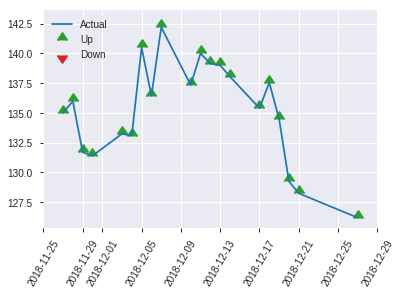


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.3772750686954993
RMSE: 0.6142272125976668
LogLoss: 5.347428850911587
Mean Per-Class Error: 0.42441471571906364
AUC: 0.5825752508361204
pr_auc: 0.342442342372912
Gini: 0.16515050167224077
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38088659740267017: 


,0,1,Error,Rate
0,9.0,121.0,0.9308,(121.0/130.0)
1,2.0,113.0,0.0174,(2.0/115.0)
Total,11.0,234.0,0.502,(123.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3808866,0.6475645,162.0
max f2,0.0452300,0.8167614,172.0
max f0point5,0.7974493,0.5548038,84.0
max accuracy,0.9328343,0.5795918,16.0
max precision,0.9328343,0.5681818,16.0
max recall,0.0452300,1.0,172.0
max specificity,1.0000000,0.7461538,0.0
max absolute_mcc,0.8458026,0.1521095,66.0
max min_per_class_accuracy,0.8726423,0.5615385,50.0
max mean_per_class_accuracy,0.8458026,0.5755853,66.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 80.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.2857143,1.0,1.1260870,1.1260870,0.5285714,1.0,0.5285714,1.0,0.3217391,0.3217391,12.6086957,12.6086957
,2,0.3020408,0.9620890,1.5978261,1.1515864,0.75,0.9833428,0.5405405,0.9990996,0.0260870,0.3478261,59.7826087,15.1586369
,3,0.4,0.9176748,1.0652174,1.1304348,0.5,0.9391863,0.5306122,0.9844270,0.1043478,0.4521739,6.5217391,13.0434783
,4,0.5020408,0.8712359,1.1930435,1.1431601,0.56,0.8951806,0.5365854,0.9662875,0.1217391,0.5739130,19.3043478,14.3160127
,5,0.6,0.8309458,0.9764493,1.1159420,0.4583333,0.8515955,0.5238095,0.9475622,0.0956522,0.6695652,-2.3550725,11.5942029
,6,0.6979592,0.7685219,0.8876812,1.0839054,0.4166667,0.7914012,0.5087719,0.9256449,0.0869565,0.7565217,-11.2318841,8.3905416
,7,0.8,0.6316386,1.0226087,1.0760870,0.48,0.7116073,0.5051020,0.8983442,0.1043478,0.8608696,2.2608696,7.6086957
,8,0.8979592,0.4596675,0.6213768,1.0264822,0.2916667,0.5679678,0.4818182,0.8623031,0.0608696,0.9217391,-37.8623188,2.6482213
,9,1.0,0.0015514,0.7669565,1.0,0.36,0.3241479,0.4693878,0.8073893,0.0782609,1.0,-23.3043478,0.0


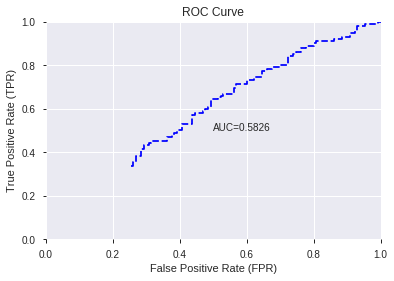

This function is available for GLM models only


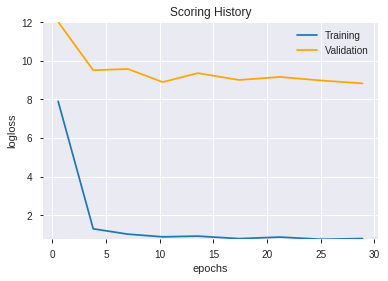

--2019-08-24 21:28:46--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.80.104
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.80.104|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


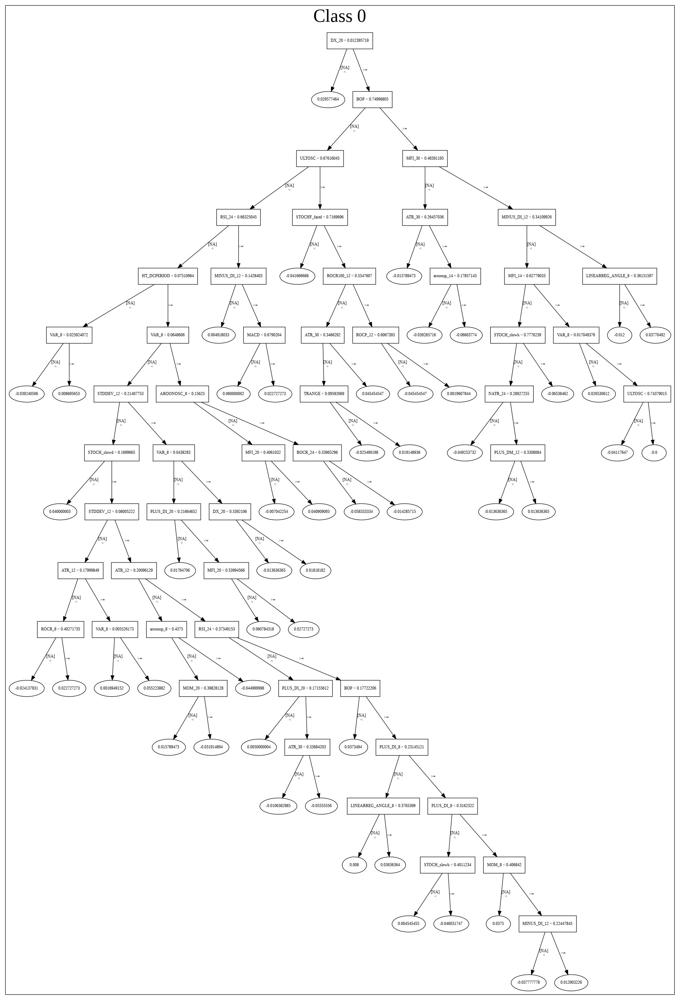

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_205701_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_205701_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['STOCHRSI_fastk',
 'weekday_name',
 'day',
 'CDLSTICKSANDWICH',
 'SIN',
 'CDLTHRUSTING',
 'CDLKICKING',
 'dayofweek',
 'weekday',
 'CDLINNECK',
 'BOP',
 'STOCHRSI_fastd',
 'CDLIDENTICAL3CROWS',
 'COS',
 'aroondown_20',
 'HT_TRENDMODE',
 'CDLBELTHOLD',
 'aroondown_8',
 'aroonup_12',
 'is_month_start',
 'CDLLONGLINE',
 'days_in_month',
 'CDLPIERCING',
 'BETA_20',
 'aroondown_30',
 'aroonup_20',
 'aroondown_12',
 'Volume',
 'TAN',
 'aroonup_30',
 'aroonup_14',
 'aroondown_24',
 'HT_DCPERIOD',
 'CDL2CROWS',
 'BETA_8',
 'CDLMORNINGDOJISTAR',
 'ATR_30',
 'dayofyear',
 'quarter',
 'BETA_30',
 'aroondown_14',
 'CDLSPINNINGTOP',
 'AROONOSC_20',
 'aroonup_24',
 'STOCHF_fastk',
 'AROONOSC_8',
 'SAREXT',
 'is_quarter_start',
 'CDLLADDERBOTTOM',
 'CDLADVANCEBLOCK',
 'CDLUNIQUE3RIVER',
 'CDLSTALLEDPATTERN',
 'MFI_20',
 'CORREL_24',
 'BETA_24',
 'AROONOSC_12',
 'CDL3LINESTRIKE',
 'STOCHF_fastd',
 'week',
 'MFI_24',
 'month',
 'CDLONNECK',
 'aroonup_8',
 'ATR_24',
 'CDLCOUNTERATTACK',
 'MACDEXT_hist'

In [47]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_212853_model_1,0.493144,6.062867,0.5,0.586519,0.344004


,variable,relative_importance,scaled_importance,percentage
0,CDLXSIDEGAP3METHODS,8.736959e-03,1.000000,1.180129e-02
1,is_month_start,8.116180e-03,0.928948,1.096278e-02
2,CDLSTICKSANDWICH,7.792535e-03,0.891905,1.052562e-02
3,CDLMATCHINGLOW,7.522379e-03,0.860984,1.016071e-02
4,CDLTHRUSTING,6.919751e-03,0.792009,9.346726e-03
5,is_quarter_start,6.294017e-03,0.720390,8.501527e-03
6,STOCHRSI_fastk,6.267672e-03,0.717375,8.465942e-03
7,CDLSHOOTINGSTAR,5.988059e-03,0.685371,8.088260e-03
8,CDLMARUBOZU,5.801540e-03,0.664023,7.836322e-03
9,CDLLADDERBOTTOM,5.721190e-03,0.654826,7.727792e-03


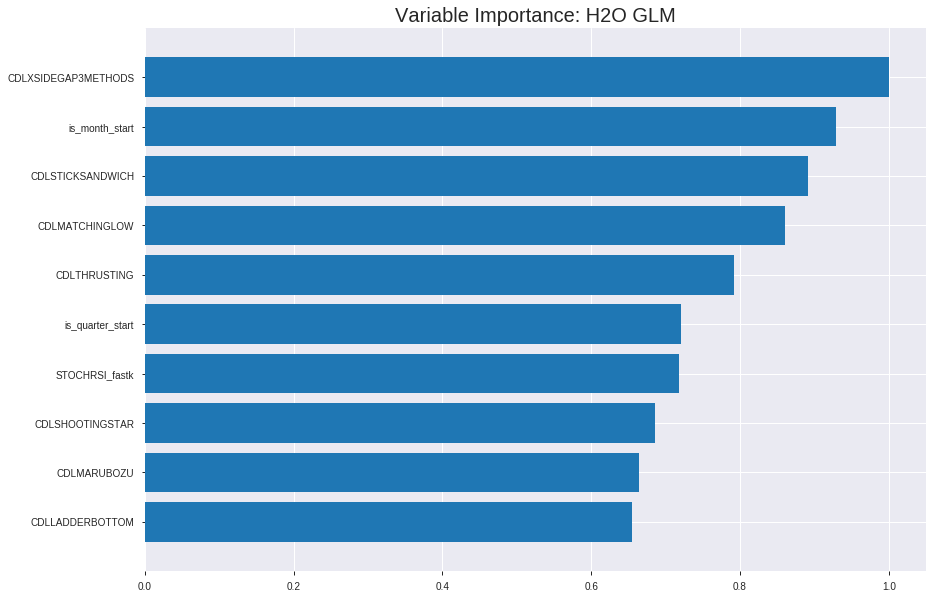

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_212853_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24565126819919655
RMSE: 0.49563219043883394
LogLoss: 0.6844001559180868
Null degrees of freedom: 1710
Residual degrees of freedom: 667
Null deviance: 2365.745433910457
Residual deviance: 2342.017333551693
AIC: 4430.017333551693
AUC: 0.5902687499657172
pr_auc: 0.6257491400842914
Gini: 0.18053749993143442
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48296558117716326: 


,0,1,Error,Rate
0,22.0,782.0,0.9726,(782.0/804.0)
1,4.0,903.0,0.0044,(4.0/907.0)
Total,26.0,1685.0,0.4594,(786.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4829656,0.6967593,380.0
max f2,0.4738177,0.8506847,391.0
max f0point5,0.5038352,0.5999137,325.0
max accuracy,0.5320657,0.5669199,191.0
max precision,0.6060852,1.0,0.0
max recall,0.4738177,1.0,391.0
max specificity,0.6060852,1.0,0.0
max absolute_mcc,0.5467268,0.1444233,123.0
max min_per_class_accuracy,0.5293300,0.5611907,203.0
max mean_per_class_accuracy,0.5320657,0.5694762,191.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 53.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.5825673,1.7816367,1.7816367,0.9444444,0.5926585,0.9444444,0.5926585,0.0187431,0.0187431,78.1636653,78.1636653
,2,0.0204559,0.5764988,1.4425709,1.6169476,0.7647059,0.5793673,0.8571429,0.5862028,0.0143330,0.0330761,44.2570854,61.6947551
,3,0.0303916,0.5717169,1.4425709,1.5599398,0.7647059,0.5742861,0.8269231,0.5823069,0.0143330,0.0474090,44.2570854,55.9939785
,4,0.0403273,0.5689324,1.3316039,1.5036831,0.7058824,0.5701419,0.7971014,0.5793098,0.0132304,0.0606395,33.1603865,50.3683109
,5,0.0502630,0.5670264,1.1096699,1.4257968,0.5882353,0.5682010,0.7558140,0.5771138,0.0110254,0.0716648,10.9669888,42.5796774
,6,0.1005260,0.5596026,1.2283788,1.3270878,0.6511628,0.5628626,0.7034884,0.5699882,0.0617420,0.1334068,22.8378760,32.7087767
,7,0.1502046,0.5545873,1.1318633,1.2625194,0.6,0.5568016,0.6692607,0.5656269,0.0562293,0.1896362,13.1863286,26.2519359
,8,0.2004676,0.5499741,1.1625728,1.2374599,0.6162791,0.5522020,0.6559767,0.5622609,0.0584344,0.2480706,16.2572755,23.7459860
,9,0.3004091,0.5422434,1.0480216,1.1744366,0.5555556,0.5461696,0.6225681,0.5569076,0.1047409,0.3528115,4.8021561,17.4436613
,10,0.4003507,0.5350534,1.0700852,1.1483868,0.5672515,0.5384168,0.6087591,0.5522916,0.1069460,0.4597574,7.0085173,14.8386837




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.3770190615137174
RMSE: 0.6140187794471089
LogLoss: 9.078704197831799
Null degrees of freedom: 488
Residual degrees of freedom: -555
Null deviance: 674.0077116277507
Residual deviance: 170101.1387965037
AIC: 172189.1387965037
AUC: 0.5490055379212535
pr_auc: 0.5923043734092708
Gini: 0.09801107584250701
Confusion Matrix (Act/Pred) for max f1 @ threshold = 2.183531335429861e-51: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.7080581,249.0
max f2,0.0000000,0.8584241,249.0
max f0point5,0.0000000,0.6025180,249.0
max accuracy,0.0000000,0.5480573,249.0
max precision,0.5813999,1.0,0.0
max recall,0.0000000,1.0,249.0
max specificity,0.5813999,1.0,0.0
max absolute_mcc,0.5026842,0.1091832,196.0
max min_per_class_accuracy,0.0000000,0.5410448,245.0
max mean_per_class_accuracy,0.5026842,0.5538006,196.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 26.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.5765792,1.4597015,1.4597015,0.8,0.5796847,0.8,0.5796847,0.0149254,0.0149254,45.9701493,45.9701493
,2,0.0204499,0.5702586,1.0947761,1.2772388,0.6,0.5739638,0.7,0.5768242,0.0111940,0.0261194,9.4776119,27.7238806
,3,0.0306748,0.5682343,0.7298507,1.0947761,0.4,0.5693366,0.6,0.5743284,0.0074627,0.0335821,-27.0149254,9.4776119
,4,0.0408998,0.5661010,0.7298507,1.0035448,0.4,0.5673427,0.55,0.5725819,0.0074627,0.0410448,-27.0149254,0.3544776
,5,0.0511247,0.5631362,1.4597015,1.0947761,0.8,0.5645000,0.6,0.5709656,0.0149254,0.0559701,45.9701493,9.4776119
,6,0.1002045,0.5506250,1.1403918,1.1171185,0.625,0.5570544,0.6122449,0.5641519,0.0559701,0.1119403,14.0391791,11.7118489
,7,0.1513292,0.5387674,1.3137313,1.1835418,0.72,0.5442514,0.6486486,0.5574288,0.0671642,0.1791045,31.3731343,18.3541751
,8,0.2004090,0.5319468,0.9123134,1.1171185,0.5,0.5354912,0.6122449,0.5520563,0.0447761,0.2238806,-8.7686567,11.7118489
,9,0.3006135,0.5174572,1.0054066,1.0798812,0.5510204,0.5244881,0.5918367,0.5428669,0.1007463,0.3246269,0.5406640,7.9881206
,10,0.4008180,0.5029884,1.2288303,1.1171185,0.6734694,0.5105038,0.6122449,0.5347761,0.1231343,0.4477612,22.8830338,11.7118489



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 21:28:56,0.000 sec,2,.29E1,1044,1.3688003,347.8550896
,2019-08-24 21:28:58,1.926 sec,4,.21E1,1044,1.3653931,348.4914389
,2019-08-24 21:29:00,3.866 sec,6,.15E1,1044,1.3613979,349.2373630
,2019-08-24 21:29:02,5.793 sec,8,.11E1,1044,1.3567854,350.0698103
,2019-08-24 21:29:04,7.711 sec,10,.8E0,1044,1.3516151,350.9814197


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5591836734693878)

('F1', 0.6388888888888888)

('auc', 0.49314381270903007)

('logloss', 6.062866915370665)

('mean_per_class_error', 0.4625418060200669)

('rmse', 0.5865189447965099)

('mse', 0.34400447260521144)

glm prediction progress: |████████████████████████████████████████████████| 100%


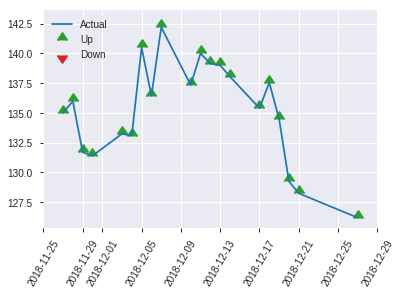


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.34400447260521144
RMSE: 0.5865189447965099
LogLoss: 6.062866915370665
Null degrees of freedom: 244
Residual degrees of freedom: -799
Null deviance: 342.33973069416305
Residual deviance: 47398.28656516502
AIC: 49486.28656516502
AUC: 0.49314381270903007
pr_auc: 0.4802254154211936
Gini: -0.013712374581939857
Confusion Matrix (Act/Pred) for max f1 @ threshold = 7.285847516394274e-62: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6388889,175.0
max f2,0.0000000,0.8156028,175.0
max f0point5,0.0000000,0.5251142,175.0
max accuracy,0.5601458,0.5591837,22.0
max precision,0.5878548,1.0,0.0
max recall,0.0000000,1.0,175.0
max specificity,0.5878548,1.0,0.0
max absolute_mcc,0.5601458,0.1178898,22.0
max min_per_class_accuracy,0.5211953,0.5,122.0
max mean_per_class_accuracy,0.5513094,0.5374582,34.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 36.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.5798772,0.7101449,0.7101449,0.3333333,0.5843410,0.3333333,0.5843410,0.0086957,0.0086957,-28.9855072,-28.9855072
,2,0.0204082,0.5760017,1.0652174,0.8521739,0.5,0.5782947,0.4,0.5819224,0.0086957,0.0173913,6.5217391,-14.7826087
,3,0.0326531,0.5740622,1.4202899,1.0652174,0.6666667,0.5748750,0.5,0.5792797,0.0173913,0.0347826,42.0289855,6.5217391
,4,0.0408163,0.5720506,2.1304348,1.2782609,1.0,0.5731480,0.6,0.5780533,0.0173913,0.0521739,113.0434783,27.8260870
,5,0.0530612,0.5709211,0.7101449,1.1471572,0.3333333,0.5714133,0.5384615,0.5765210,0.0086957,0.0608696,-28.9855072,14.7157191
,6,0.1020408,0.5579964,1.4202899,1.2782609,0.6666667,0.5635476,0.6,0.5702938,0.0695652,0.1304348,42.0289855,27.8260870
,7,0.1510204,0.5503212,1.0652174,1.2091657,0.5,0.5545254,0.5675676,0.5651797,0.0521739,0.1826087,6.5217391,20.9165687
,8,0.2,0.5471108,0.7101449,1.0869565,0.3333333,0.5485261,0.5102041,0.5611013,0.0347826,0.2173913,-28.9855072,8.6956522
,9,0.3020408,0.5385044,1.1078261,1.0940071,0.52,0.5425933,0.5135135,0.5548486,0.1130435,0.3304348,10.7826087,9.4007051
,10,0.4,0.5314417,0.8876812,1.0434783,0.4166667,0.5348198,0.4897959,0.5499436,0.0869565,0.4173913,-11.2318841,4.3478261


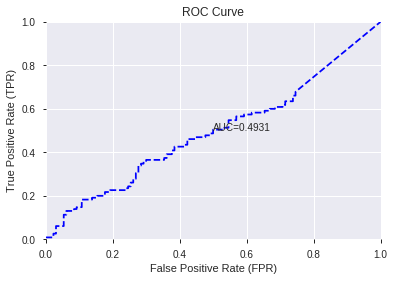

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


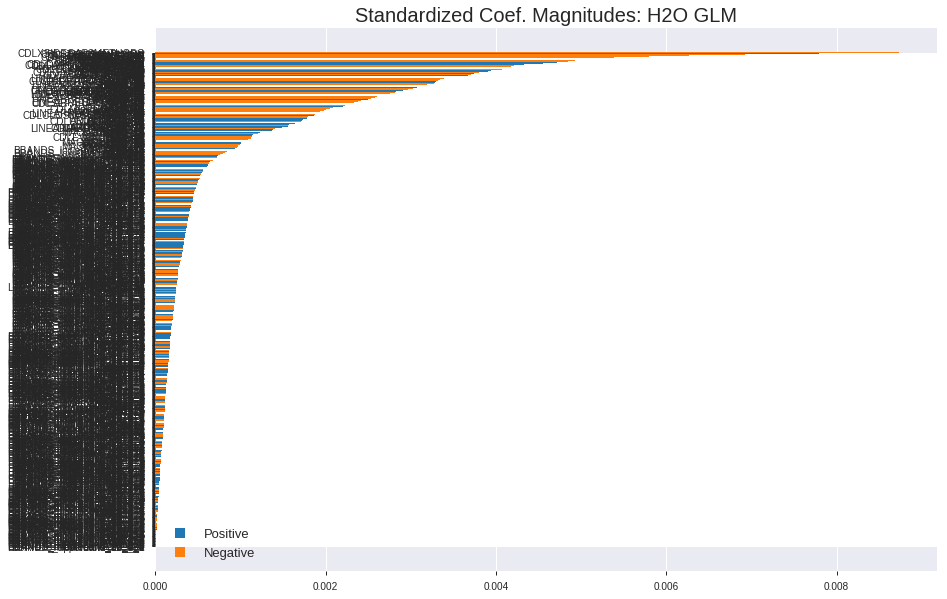

'log_likelihood'
--2019-08-24 21:29:23--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.232.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.232.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


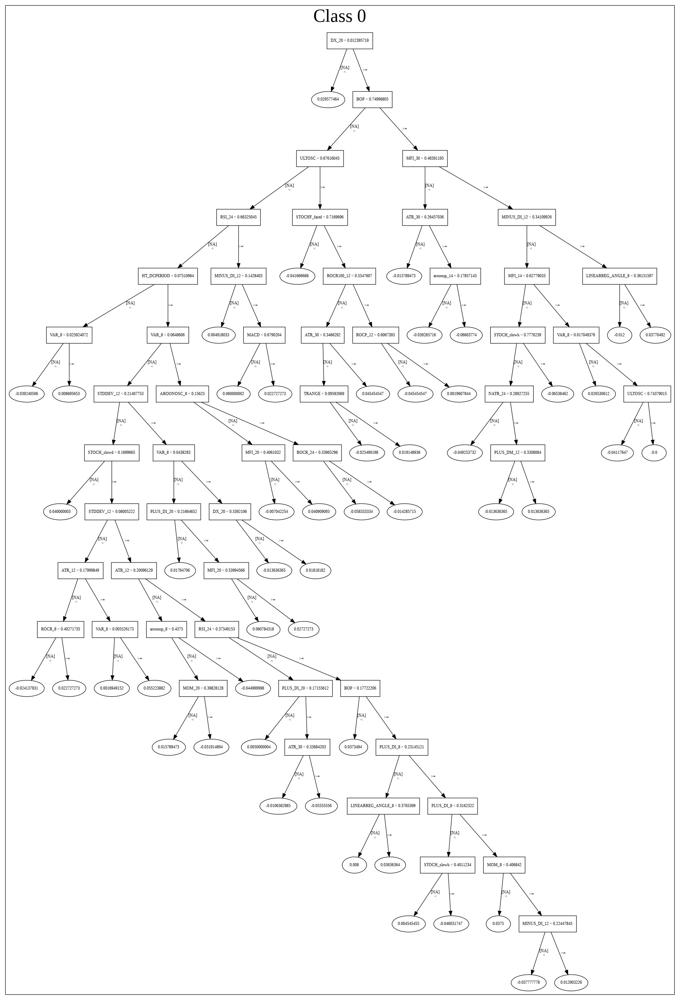

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_212853_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_212853_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['CDLXSIDEGAP3METHODS',
 'is_month_start',
 'CDLSTICKSANDWICH',
 'CDLMATCHINGLOW',
 'CDLTHRUSTING',
 'is_quarter_start',
 'STOCHRSI_fastk',
 'CDLSHOOTINGSTAR',
 'CDLMARUBOZU',
 'CDLLADDERBOTTOM',
 'STOCHRSI_fastd',
 'HT_DCPERIOD',
 'CDLHIKKAKEMOD',
 'aroondown_12',
 'CDLINNECK',
 'CDLSPINNINGTOP',
 'CDLHAMMER',
 'SAREXT',
 'CDLKICKING',
 'STOCH_slowk',
 'STOCHF_fastd',
 'ADXR_8',
 'CDLDARKCLOUDCOVER',
 'Volume',
 'MFI_24',
 'aroondown_8',
 'CDLGAPSIDESIDEWHITE',
 'CDLDOJISTAR',
 'CDLLONGLEGGEDDOJI',
 'CDL3LINESTRIKE',
 'MACDEXT_hist',
 'CDLHANGINGMAN',
 'CDLHIGHWAVE',
 'CDLCOUNTERATTACK',
 'weekday_name',
 'BETA_20',
 'aroonup_20',
 'ATAN',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'is_month_end',
 'CDLTASUKIGAP',
 'CDL2CROWS',
 'STOCH_slowd',
 'day',
 'STOCHF_fastk',
 'CDLADVANCEBLOCK',
 'is_quarter_end',
 'TAN',
 'month',
 'LINEARREG_ANGLE_12',
 'CDLDOJI',
 'EXP',
 'SINH',
 'COSH',
 'CDLBELTHOLD',
 'CORREL_30',
 'CDLDRAGONFLYDOJI',
 'CDLIDENTICAL3CROWS',
 'BETA_24',
 'ROCR100_24',
 'ROCR_24'

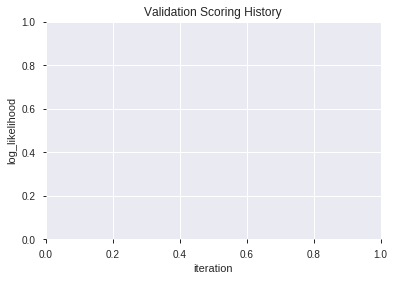

In [48]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190824_212929,0.512441,0.709389,0.488963,0.507740,0.257800
1,XGBoost_3_AutoML_20190824_212929,0.508227,0.701208,0.466388,0.504000,0.254016
2,XGBoost_grid_1_AutoML_20190824_212929_model_7,0.505686,0.722187,0.459699,0.513372,0.263551
3,XGBoost_grid_1_AutoML_20190824_212929_model_6,0.502274,0.719425,0.489465,0.512018,0.262163
4,XGBoost_grid_1_AutoML_20190824_212929_model_4,0.499799,0.712476,0.478930,0.509290,0.259377
5,XGBoost_grid_1_AutoML_20190824_212929_model_2,0.495786,0.705306,0.488462,0.506012,0.256049
6,XGBoost_grid_1_AutoML_20190824_212929_model_5,0.495050,0.757972,0.492308,0.527830,0.278605
7,XGBoost_grid_1_AutoML_20190824_212929_model_1,0.493946,0.704810,0.496154,0.505662,0.255694
8,XGBoost_grid_1_AutoML_20190824_212929_model_3,0.488896,0.729750,0.500000,0.516912,0.267198
9,XGBoost_2_AutoML_20190824_212929,0.482341,0.711281,0.434281,0.508720,0.258796


,variable,relative_importance,scaled_importance,percentage
0,DIV,149.399261,1.000000,0.016805
1,CORREL_8,143.498154,0.960501,0.016141
2,COS,142.841888,0.956108,0.016067
3,BETA_14,135.936813,0.909889,0.015291
4,ADOSC,131.881302,0.882744,0.014834
5,BOP,114.895699,0.769051,0.012924
6,day,109.429367,0.732463,0.012309
7,STOCHRSI_fastk,107.034981,0.716436,0.012040
8,HT_DCPERIOD,99.095055,0.663290,0.011147
9,ADX_8,89.994675,0.602377,0.010123


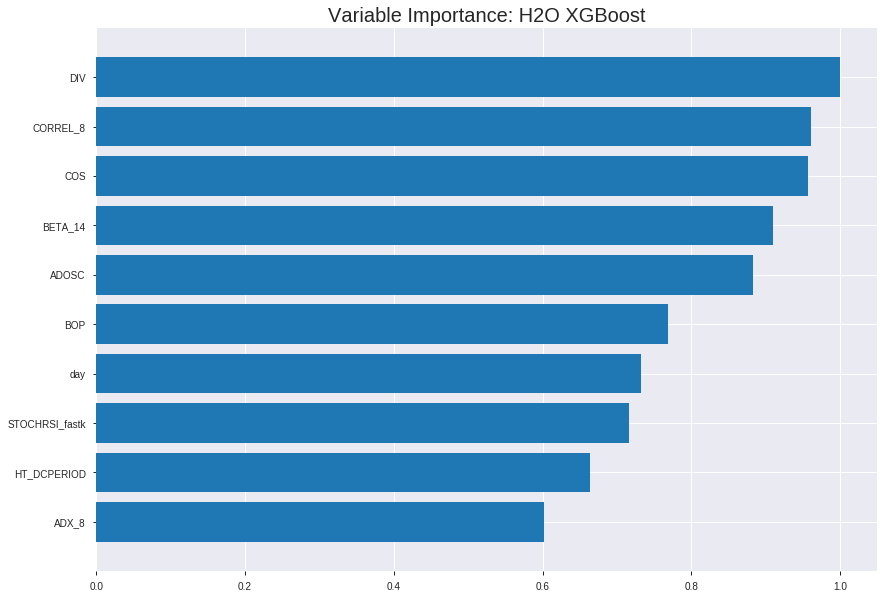

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190824_212929


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1374366578039103
RMSE: 0.3707245039161969
LogLoss: 0.4573902520757517
Mean Per-Class Error: 0.05455975360243981
AUC: 0.9887504319636656
pr_auc: 0.9893217790378583
Gini: 0.9775008639273313
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5251248627901077: 


,0,1,Error,Rate
0,765.0,39.0,0.0485,(39.0/804.0)
1,55.0,852.0,0.0606,(55.0/907.0)
Total,820.0,891.0,0.0549,(94.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5251249,0.9477197,197.0
max f2,0.4759977,0.9619952,228.0
max f0point5,0.5529923,0.9589526,179.0
max accuracy,0.5251249,0.9450614,197.0
max precision,0.8485615,1.0,0.0
max recall,0.3974421,1.0,281.0
max specificity,0.8485615,1.0,0.0
max absolute_mcc,0.5251249,0.8900040,197.0
max min_per_class_accuracy,0.5207252,0.9427861,200.0
max mean_per_class_accuracy,0.5319092,0.9454402,193.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 52.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.8000485,1.8864388,1.8864388,1.0,0.8139499,1.0,0.8139499,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.7829753,1.8864388,1.8864388,1.0,0.7878660,1.0,0.8012806,0.0187431,0.0385888,88.6438809,88.6438809
,3,0.0303916,0.7733438,1.8864388,1.8864388,1.0,0.7781245,1.0,0.7937103,0.0187431,0.0573319,88.6438809,88.6438809
,4,0.0403273,0.7639387,1.8864388,1.8864388,1.0,0.7685803,1.0,0.7875189,0.0187431,0.0760750,88.6438809,88.6438809
,5,0.0502630,0.7576690,1.8864388,1.8864388,1.0,0.7602812,1.0,0.7821347,0.0187431,0.0948181,88.6438809,88.6438809
,6,0.1005260,0.7286159,1.8864388,1.8864388,1.0,0.7420257,1.0,0.7620802,0.0948181,0.1896362,88.6438809,88.6438809
,7,0.1502046,0.7073072,1.8864388,1.8864388,1.0,0.7167083,1.0,0.7470739,0.0937155,0.2833517,88.6438809,88.6438809
,8,0.2004676,0.6840886,1.8864388,1.8864388,1.0,0.6955241,1.0,0.7341489,0.0948181,0.3781698,88.6438809,88.6438809
,9,0.3004091,0.6462787,1.8864388,1.8864388,1.0,0.6662552,1.0,0.7115617,0.1885336,0.5667034,88.6438809,88.6438809
,10,0.4003507,0.6067611,1.8643752,1.8809310,0.9883041,0.6272838,0.9970803,0.6905230,0.1863286,0.7530320,86.4375197,88.0930959




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26103514288381596
RMSE: 0.5109159841733433
LogLoss: 0.7168538431432485
Mean Per-Class Error: 0.4555615587222259
AUC: 0.5100459242250287
pr_auc: 0.5417820132959835
Gini: 0.020091848450057403
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.286282479763031: 


,0,1,Error,Rate
0,2.0,219.0,0.991,(219.0/221.0)
1,1.0,267.0,0.0037,(1.0/268.0)
Total,3.0,486.0,0.4499,(220.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2862825,0.7082228,396.0
max f2,0.2701274,0.8584241,399.0
max f0point5,0.3320718,0.6051402,379.0
max accuracy,0.3320718,0.5541922,379.0
max precision,0.4788134,0.5886792,219.0
max recall,0.2701274,1.0,399.0
max specificity,0.7870380,0.9954751,0.0
max absolute_mcc,0.4788134,0.0887780,219.0
max min_per_class_accuracy,0.4909038,0.5294118,205.0
max mean_per_class_accuracy,0.4788134,0.5444384,219.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 49.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.7298836,0.7298507,0.7298507,0.4,0.7544153,0.4,0.7544153,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.7123821,1.0947761,0.9123134,0.6,0.7238148,0.5,0.7391150,0.0111940,0.0186567,9.4776119,-8.7686567
,3,0.0306748,0.7019506,0.7298507,0.8514925,0.4,0.7054317,0.4666667,0.7278872,0.0074627,0.0261194,-27.0149254,-14.8507463
,4,0.0408998,0.6869226,0.7298507,0.8210821,0.4,0.6927832,0.45,0.7191112,0.0074627,0.0335821,-27.0149254,-17.8917910
,5,0.0511247,0.6737268,1.0947761,0.8758209,0.6,0.6807760,0.48,0.7114442,0.0111940,0.0447761,9.4776119,-12.4179104
,6,0.1002045,0.6328925,0.7602612,0.8192202,0.4166667,0.6536809,0.4489796,0.6831520,0.0373134,0.0820896,-23.9738806,-18.0779775
,7,0.1513292,0.5996185,0.9488060,0.8629992,0.52,0.6170466,0.4729730,0.6608191,0.0485075,0.1305970,-5.1194030,-13.7000807
,8,0.2004090,0.5707754,1.2924440,0.9681694,0.7083333,0.5843492,0.5306122,0.6420918,0.0634328,0.1940299,29.2444030,-3.1830643
,9,0.3006135,0.5464270,1.1543558,1.0302315,0.6326531,0.5584897,0.5646259,0.6142244,0.1156716,0.3097015,15.4355772,3.0231496
,10,0.4008180,0.5173122,1.1543558,1.0612626,0.6326531,0.5301676,0.5816327,0.5932102,0.1156716,0.4253731,15.4355772,6.1262565



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 21:29:29,0.005 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4699006,0.5,0.6931472,0.5,0.0,1.0,0.4519427
,2019-08-24 21:29:30,0.785 sec,5.0,0.4821811,0.6580408,0.8408591,0.8534505,1.8864388,0.2460549,0.4994915,0.6921295,0.5201509,0.5601237,1.4597015,0.4519427
,2019-08-24 21:29:30,1.011 sec,10.0,0.4659364,0.6268927,0.9062968,0.9134443,1.8864388,0.1741672,0.5002101,0.6935941,0.5180236,0.5535301,1.0947761,0.4519427
,2019-08-24 21:29:30,1.222 sec,15.0,0.4517599,0.6002664,0.9346754,0.9424798,1.8864388,0.1379310,0.5017440,0.6967209,0.5085264,0.5580210,1.0947761,0.4519427
,2019-08-24 21:29:31,1.431 sec,20.0,0.4389356,0.5766258,0.9499724,0.9559868,1.8864388,0.1256575,0.5025400,0.6983773,0.5145033,0.5660032,1.0947761,0.4519427
,2019-08-24 21:29:31,1.663 sec,25.0,0.4258126,0.5527655,0.9615559,0.9655883,1.8864388,0.1087084,0.5040422,0.7015971,0.5135831,0.5545640,1.0947761,0.4519427
,2019-08-24 21:29:31,1.881 sec,30.0,0.4136327,0.5310773,0.9709837,0.9729350,1.8864388,0.0900058,0.5057320,0.7053561,0.5190366,0.5538813,1.0947761,0.4519427
,2019-08-24 21:29:31,2.095 sec,35.0,0.4024113,0.5113959,0.9755577,0.9772490,1.8864388,0.0794857,0.5064103,0.7068035,0.5169430,0.5499084,1.0947761,0.4519427
,2019-08-24 21:29:31,2.310 sec,40.0,0.3913626,0.4923385,0.9813152,0.9802928,1.8864388,0.0660432,0.5067240,0.7077715,0.5199061,0.5468615,0.7298507,0.4519427
,2019-08-24 21:29:32,2.527 sec,45.0,0.3810463,0.4748042,0.9854524,0.9863335,1.8864388,0.0584454,0.5089050,0.7124142,0.5140559,0.5439815,0.7298507,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
DIV,149.3992615,1.0,0.0168049
CORREL_8,143.4981537,0.9605011,0.0161411
COS,142.8418884,0.9561084,0.0160673
BETA_14,135.9368134,0.9098895,0.0152906
ADOSC,131.8813019,0.8827440,0.0148344
---,---,---,---
MIDPOINT_30,0.9760990,0.0065335,0.0001098
BBANDS_middleband_14_2_2,0.9582806,0.0064142,0.0001078
BBANDS_lowerband_8_4_5,0.7331657,0.0049074,0.0000825
ROCR_24,0.4579601,0.0030653,0.0000515



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5469387755102041)

('F1', 0.6422535211267605)

('auc', 0.5124414715719063)

('logloss', 0.7093889915076292)

('mean_per_class_error', 0.43846153846153846)

('rmse', 0.5077401161774343)

('mse', 0.2578000255758745)

xgboost prediction progress: |████████████████████████████████████████████| 100%


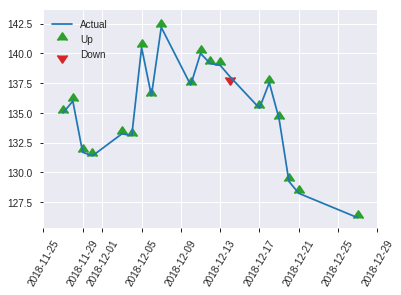


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2578000255758745
RMSE: 0.5077401161774343
LogLoss: 0.7093889915076292
Mean Per-Class Error: 0.43846153846153846
AUC: 0.5124414715719063
pr_auc: 0.47172371531210167
Gini: 0.024882943143812675
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2980837821960449: 


,0,1,Error,Rate
0,4.0,126.0,0.9692,(126.0/130.0)
1,1.0,114.0,0.0087,(1.0/115.0)
Total,5.0,240.0,0.5184,(127.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2980838,0.6422535,239.0
max f2,0.2270448,0.8156028,244.0
max f0point5,0.4467987,0.5508982,179.0
max accuracy,0.6730106,0.5469388,13.0
max precision,0.7499615,1.0,0.0
max recall,0.2270448,1.0,244.0
max specificity,0.7499615,1.0,0.0
max absolute_mcc,0.4467987,0.1391247,179.0
max min_per_class_accuracy,0.5175235,0.4846154,122.0
max mean_per_class_accuracy,0.4467987,0.5615385,179.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 51.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.7072062,1.4202899,1.4202899,0.6666667,0.7275550,0.6666667,0.7275550,0.0173913,0.0173913,42.0289855,42.0289855
,2,0.0204082,0.6932316,0.0,0.8521739,0.0,0.6967292,0.4,0.7152246,0.0,0.0173913,-100.0,-14.7826087
,3,0.0326531,0.6863589,0.7101449,0.7989130,0.3333333,0.6907704,0.375,0.7060543,0.0086957,0.0260870,-28.9855072,-20.1086957
,4,0.0408163,0.6790341,2.1304348,1.0652174,1.0,0.6805047,0.5,0.7009444,0.0173913,0.0434783,113.0434783,6.5217391
,5,0.0530612,0.6738002,2.1304348,1.3110368,1.0,0.6762244,0.6153846,0.6952398,0.0260870,0.0695652,113.0434783,31.1036789
,6,0.1020408,0.6446506,0.7101449,1.0226087,0.3333333,0.6595769,0.48,0.6781216,0.0347826,0.1043478,-28.9855072,2.2608696
,7,0.1510204,0.6182208,1.0652174,1.0364277,0.5,0.6299330,0.4864865,0.6624928,0.0521739,0.1565217,6.5217391,3.6427732
,8,0.2,0.6044665,0.5326087,0.9130435,0.25,0.6116424,0.4285714,0.6500397,0.0260870,0.1826087,-46.7391304,-8.6956522
,9,0.3020408,0.5795607,1.1930435,1.0076381,0.56,0.5892006,0.4729730,0.6294859,0.1217391,0.3043478,19.3043478,0.7638073
,10,0.4,0.5517869,0.7101449,0.9347826,0.3333333,0.5658990,0.4387755,0.6139136,0.0695652,0.3739130,-28.9855072,-6.5217391


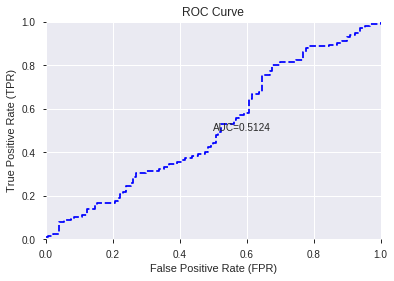

This function is available for GLM models only


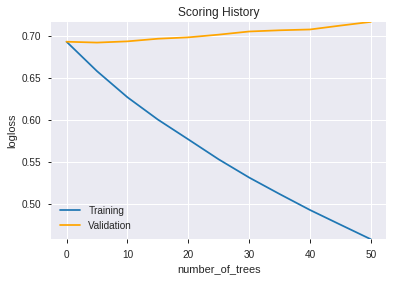

--2019-08-24 21:30:13--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.163.187
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.163.187|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel

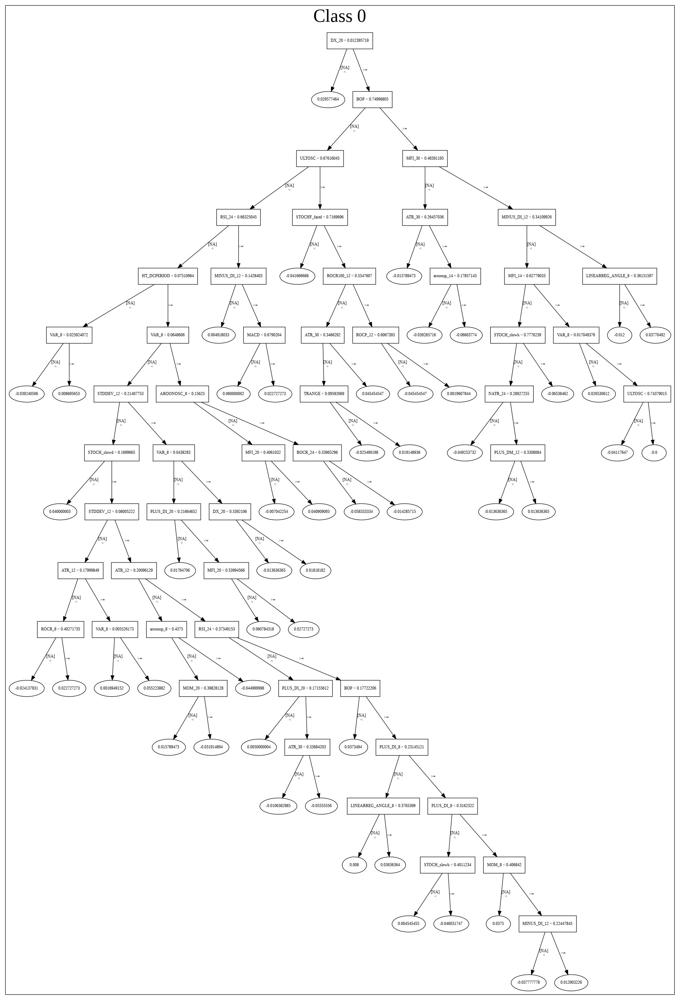

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190824_212929',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190824_212929',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_90_sid_a456',
   'type

['DIV',
 'CORREL_8',
 'COS',
 'BETA_14',
 'ADOSC',
 'BOP',
 'day',
 'STOCHRSI_fastk',
 'HT_DCPERIOD',
 'ADX_8',
 'CORREL_30',
 'BETA_8',
 'ADXR_8',
 'MFI_14',
 'MFI_8',
 'MACDEXT_hist',
 'SIN',
 'CCI_12',
 'BETA_20',
 'PLUS_DI_8',
 'STOCHRSI_fastd',
 'STOCH_slowk',
 'CORREL_12',
 'dayofyear',
 'MOM_8',
 'OBV',
 'WILLR_20',
 'STOCHF_fastk',
 'CORREL_14',
 'BETA_24',
 'TAN',
 'PLUS_DI_24',
 'STDDEV_8',
 'MFI_24',
 'DX_24',
 'Volume',
 'WILLR_8',
 'CCI_8',
 'VAR_14',
 'STDDEV_14',
 'CMO_30',
 'MFI_12',
 'ADXR_12',
 'MINUS_DM_8',
 'WILLR_12',
 'LINEARREG_ANGLE_12',
 'MINUS_DI_30',
 'SUB',
 'WILLR_24',
 'CORREL_20',
 'AD',
 'MINUS_DI_8',
 'ADX_24',
 'HT_PHASOR_inphase',
 'STDDEV_24',
 'TRANGE',
 'NATR_12',
 'LINEARREG_INTERCEPT_30',
 'PLUS_DM_24',
 'DX_30',
 'ULTOSC',
 'ROC_20',
 'HT_PHASOR_quadrature',
 'MACDFIX_signal_20',
 'MINUS_DI_12',
 'CCI_20',
 'PLUS_DM_14',
 'DX_8',
 'PLUS_DM_8',
 'aroondown_30',
 'ATR_8',
 'LINEARREG_ANGLE_8',
 'STDDEV_30',
 'MINUS_DM_30',
 'APO',
 'MFI_20',
 'PLU

In [49]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [50]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

1003

['weekday',
 'weekday_name',
 'weekofyear',
 'mama',
 'fama',
 'SAREXT',
 'DEMA_8',
 'EMA_8',
 'KAMA_8',
 'MIDPOINT_8',
 'MIDPRICE_8',
 'SAR_0.08',
 'SMA_8',
 'TEMA_8',
 'TRIMA_8',
 'WMA_8',
 'MA_8_0',
 'MAVP_8_0',
 'T3_8_0',
 'BBANDS_upperband_8_0_2',
 'BBANDS_middleband_8_0_2',
 'BBANDS_lowerband_8_0_2',
 'BBANDS_upperband_8_0_3',
 'BBANDS_middleband_8_0_3',
 'BBANDS_lowerband_8_0_3',
 'BBANDS_upperband_8_0_4',
 'BBANDS_middleband_8_0_4',
 'BBANDS_lowerband_8_0_4',
 'BBANDS_upperband_8_0_5',
 'BBANDS_middleband_8_0_5',
 'BBANDS_lowerband_8_0_5',
 'MA_8_1',
 'MAVP_8_1',
 'T3_8_1',
 'BBANDS_upperband_8_1_2',
 'BBANDS_middleband_8_1_2',
 'BBANDS_lowerband_8_1_2',
 'BBANDS_upperband_8_1_3',
 'BBANDS_middleband_8_1_3',
 'BBANDS_lowerband_8_1_3',
 'BBANDS_upperband_8_1_4',
 'BBANDS_middleband_8_1_4',
 'BBANDS_lowerband_8_1_4',
 'BBANDS_upperband_8_1_5',
 'BBANDS_middleband_8_1_5',
 'BBANDS_lowerband_8_1_5',
 'MA_8_2',
 'MAVP_8_2',
 'T3_8_2',
 'BBANDS_upperband_8_2_2',
 'BBANDS_middleband_8

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_213117_model_2,0.582074,5.755330,0.432943,0.659125,0.434446
1,DeepLearning_1_AutoML_20190824_213117,0.581739,5.625088,0.445819,0.633305,0.401075
2,DeepLearning_grid_1_AutoML_20190824_213117_model_3,0.580334,5.799400,0.428094,0.654035,0.427762
3,DeepLearning_grid_1_AutoML_20190824_213117_model_1,0.542274,7.233892,0.488462,0.679853,0.462200
4,DeepLearning_grid_1_AutoML_20190824_213117_model_4,0.529565,5.616595,0.500000,0.663182,0.439810
5,DeepLearning_grid_1_AutoML_20190824_213117_model_5,0.515385,0.703110,0.480769,0.504940,0.254964
6,DeepLearning_grid_1_AutoML_20190824_213117_model_7,0.506622,5.324872,0.496154,0.578017,0.334104
7,DeepLearning_grid_1_AutoML_20190824_213117_model_9,0.496154,0.703358,0.500000,0.505061,0.255087
8,DeepLearning_grid_1_AutoML_20190824_213117_model_8,0.485953,0.706078,0.500000,0.506390,0.256431
9,DeepLearning_grid_1_AutoML_20190824_213117_model_6,0.477993,5.093156,0.500000,0.577713,0.333752


,variable,relative_importance,scaled_importance,percentage
0,STOCHRSI_fastk,1.000000,1.000000,0.002758
1,SIN,0.949825,0.949825,0.002619
2,weekday,0.911039,0.911039,0.002512
3,COS,0.870282,0.870282,0.002400
4,BOP,0.838148,0.838148,0.002311
5,weekday_name,0.816910,0.816910,0.002253
6,CDLINNECK,0.813165,0.813165,0.002242
7,CDLTHRUSTING,0.780585,0.780585,0.002152
8,HT_TRENDMODE,0.756117,0.756117,0.002085
9,aroondown_20,0.752638,0.752638,0.002075


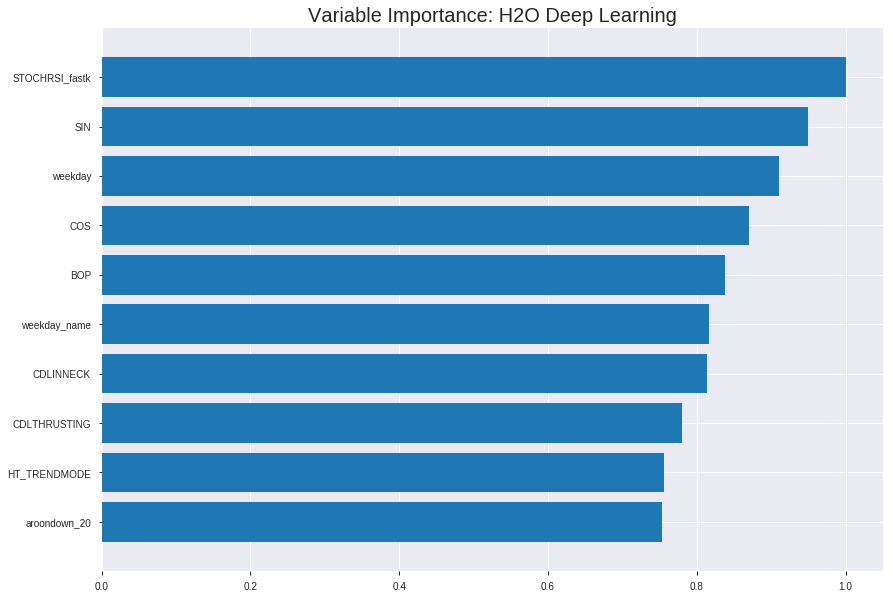

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_213117_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.28963843129942923
RMSE: 0.5381806678982711
LogLoss: 0.8496725382004148
Mean Per-Class Error: 0.4407757244647764
AUC: 0.5742072438249766
pr_auc: 0.5875732889389748
Gini: 0.14841448764995313
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4214850483730895: 


,0,1,Error,Rate
0,61.0,743.0,0.9241,(743.0/804.0)
1,28.0,879.0,0.0309,(28.0/907.0)
Total,89.0,1622.0,0.4506,(771.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4214850,0.6951364,354.0
max f2,0.2392840,0.8495691,398.0
max f0point5,0.5652782,0.6016194,280.0
max accuracy,0.6149455,0.5704267,249.0
max precision,0.9990916,1.0,0.0
max recall,0.2392840,1.0,398.0
max specificity,0.9990916,1.0,0.0
max absolute_mcc,0.6149455,0.1277830,249.0
max min_per_class_accuracy,0.7192278,0.5472637,179.0
max mean_per_class_accuracy,0.6149455,0.5592243,249.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 71.27 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.9958817,1.3624280,1.3624280,0.7222222,0.9976389,0.7222222,0.9976389,0.0143330,0.0143330,36.2428029,36.2428029
,2,0.0204559,0.9883215,1.4425709,1.4013545,0.7647059,0.9926559,0.7428571,0.9952186,0.0143330,0.0286659,44.2570854,40.1354544
,3,0.0303916,0.9770345,1.2206369,1.3422738,0.6470588,0.9828851,0.7115385,0.9911865,0.0121279,0.0407938,22.0636877,34.2273768
,4,0.0403273,0.9689195,1.1096699,1.2849656,0.5882353,0.9725563,0.6811594,0.9865964,0.0110254,0.0518192,10.9669888,28.4965566
,5,0.0502630,0.9603983,1.3316039,1.2941848,0.7058824,0.9640602,0.6860465,0.9821416,0.0132304,0.0650496,33.1603865,29.4184764
,6,0.1005260,0.9363719,1.0528961,1.1735404,0.5581395,0.9479728,0.6220930,0.9650572,0.0529217,0.1179713,5.2896080,17.3540422
,7,0.1502046,0.9129767,1.1096699,1.1524159,0.5882353,0.9258315,0.6108949,0.9520837,0.0551268,0.1730981,10.9669888,15.2415926
,8,0.2004676,0.8882787,1.0748314,1.1329632,0.5697674,0.8998364,0.6005831,0.9389838,0.0540243,0.2271224,7.4831415,13.2963250
,9,0.3004091,0.8345893,1.0700852,1.1120447,0.5672515,0.8609795,0.5894942,0.9130330,0.1069460,0.3340684,7.0085173,11.2044668
,10,0.4003507,0.7842129,1.0811170,1.1043240,0.5730994,0.8095150,0.5854015,0.8871912,0.1080485,0.4421169,8.1116978,10.4324033




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.39522077355979446
RMSE: 0.6286658679774133
LogLoss: 8.972131818869013
Mean Per-Class Error: 0.4859525899912204
AUC: 0.46408793138380494
pr_auc: 0.287878640023288
Gini: -0.07182413723239012
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5770889732165756: 


,0,1,Error,Rate
0,3.0,218.0,0.9864,(218.0/221.0)
1,1.0,267.0,0.0037,(1.0/268.0)
Total,4.0,485.0,0.4479,(219.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5770890,0.7091633,240.0
max f2,0.5310237,0.8589744,243.0
max f0point5,0.6437355,0.6076710,229.0
max accuracy,0.6437355,0.5582822,229.0
max precision,0.7321888,0.5558087,194.0
max recall,0.5310237,1.0,243.0
max specificity,1.0000000,0.4524887,0.0
max absolute_mcc,0.9969394,0.0897350,3.0
max min_per_class_accuracy,1.0000000,0.4524887,0.0
max mean_per_class_accuracy,0.7321888,0.5140474,194.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 90.75 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.4989775,1.0,0.9272694,0.9272694,0.5081967,1.0,0.5081967,1.0,0.4626866,0.4626866,-7.2730609,-7.2730609
,2,0.5010225,1.0000000,0.0,0.9234846,0.0,1.0000000,0.5061224,1.0000000,0.0,0.4626866,-100.0,-7.6515382
,3,0.5991820,0.9042919,1.1023787,0.9527915,0.6041667,0.9465057,0.5221843,0.9912364,0.1082090,0.5708955,10.2378731,-4.7208497
,4,0.6993865,0.8481388,1.1171185,0.9763354,0.6122449,0.8757956,0.5350877,0.9746967,0.1119403,0.6828358,11.7118489,-2.3664572
,5,0.7995910,0.8017157,1.0426439,0.9846452,0.5714286,0.8248122,0.5396419,0.9559132,0.1044776,0.7873134,4.2643923,-1.5354812
,6,0.8997955,0.7284603,1.2288303,1.0118385,0.6734694,0.7672945,0.5545455,0.9349079,0.1231343,0.9104478,22.8830338,1.1838535
,7,1.0,0.4344188,0.8936948,1.0,0.4897959,0.6617897,0.5480573,0.9075402,0.0895522,1.0,-10.6305209,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 21:32:39,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 21:32:41,1 min 23.396 sec,304 obs/sec,0.4289889,1,734.0,0.6714975,7.8896841,-0.8101955,0.5197558,0.2916445,1.0417647,0.4699006,0.7004663,10.7400419,-0.9809117,0.4542277,0.2808024,0.9233942,0.4519427
,2019-08-24 21:32:59,1 min 41.109 sec,426 obs/sec,4.7177089,11,8072.0,0.5568856,0.9702652,-0.2449979,0.5763773,0.5891054,1.4672302,0.4576271,0.6346192,9.0112996,-0.6259868,0.4723104,0.2903505,0.9272694,0.4519427
,2019-08-24 21:33:12,1 min 53.536 sec,437 obs/sec,7.6978375,18,13171.0,0.5718154,0.9495294,-0.3126483,0.5305981,0.5703249,1.3624280,0.4652250,0.6718303,9.1036170,-0.8222579,0.4707571,0.2897680,0.9272694,0.4478528
,2019-08-24 21:33:25,2 min 7.200 sec,446 obs/sec,11.0981882,26,18989.0,0.5496149,0.8424221,-0.2127010,0.5263854,0.5707938,1.2576259,0.4693162,0.6705884,9.1024585,-0.8155269,0.4595462,0.2864882,0.9272694,0.4519427
,2019-08-24 21:33:39,2 min 20.408 sec,456 obs/sec,14.5312683,34,24863.0,0.5226950,0.7847974,-0.0968151,0.5635748,0.5649814,1.2576259,0.4576271,0.6526414,9.3124031,-0.7196492,0.5467600,0.5975010,1.8246269,0.4519427
,2019-08-24 21:33:51,2 min 33.317 sec,464 obs/sec,17.9766219,42,30758.0,0.5381807,0.8496725,-0.1627675,0.5742072,0.5875733,1.3624280,0.4506137,0.6286659,8.9721318,-0.5956235,0.4640879,0.2878786,0.9272694,0.4478528
,2019-08-24 21:34:05,2 min 47.103 sec,474 obs/sec,21.8381064,51,37365.0,0.5258928,0.8793989,-0.1102763,0.5924971,0.5856924,1.0480216,0.4500292,0.6536011,9.3369248,-0.7247102,0.4761768,0.2900699,0.9271478,0.4314928
,2019-08-24 21:34:06,2 min 48.392 sec,474 obs/sec,21.8381064,51,37365.0,0.5381807,0.8496725,-0.1627675,0.5742072,0.5875733,1.3624280,0.4506137,0.6286659,8.9721318,-0.5956235,0.4640879,0.2878786,0.9272694,0.4478528


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
STOCHRSI_fastk,1.0,1.0,0.0027575
SIN,0.9498253,0.9498253,0.0026192
weekday,0.9110393,0.9110393,0.0025122
COS,0.8702820,0.8702820,0.0023998
BOP,0.8381477,0.8381477,0.0023112
---,---,---,---
BBANDS_lowerband_30_0_4,0.2821513,0.2821513,0.0007780
CDLKICKINGBYLENGTH,0.2803644,0.2803644,0.0007731
BBANDS_lowerband_30_6_3,0.2766730,0.2766730,0.0007629
MA_14_5,0.2735153,0.2735153,0.0007542



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5836734693877551)

('F1', 0.6498422712933754)

('auc', 0.5820735785953177)

('logloss', 5.755330114851014)

('mean_per_class_error', 0.4234113712374582)

('rmse', 0.659125226026506)

('mse', 0.4344460635844926)

deeplearning prediction progress: |███████████████████████████████████████| 100%


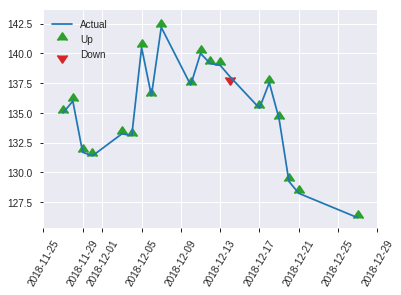


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.4344460635844926
RMSE: 0.659125226026506
LogLoss: 5.755330114851014
Mean Per-Class Error: 0.4234113712374582
AUC: 0.5820735785953177
pr_auc: 0.32688563686735084
Gini: 0.16414715719063544
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.8039168387241288: 


,0,1,Error,Rate
0,31.0,99.0,0.7615,(99.0/130.0)
1,12.0,103.0,0.1043,(12.0/115.0)
Total,43.0,202.0,0.4531,(111.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.8039168,0.6498423,126.0
max f2,0.6188447,0.8190883,166.0
max f0point5,0.8039168,0.5579632,126.0
max accuracy,0.9766999,0.5836735,15.0
max precision,0.9766999,0.5714286,15.0
max recall,0.6188447,1.0,166.0
max specificity,1.0000000,0.7384615,0.0
max absolute_mcc,0.8039168,0.1759478,126.0
max min_per_class_accuracy,0.9506520,0.5478261,45.0
max mean_per_class_accuracy,0.9761866,0.5765886,17.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 90.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.3061224,1.0,1.1646377,1.1646377,0.5466667,1.0,0.5466667,1.0,0.3565217,0.3565217,16.4637681,16.4637681
,2,0.4,0.9726614,1.2967864,1.1956522,0.6086957,0.9832349,0.5612245,0.9960653,0.1217391,0.4782609,29.6786389,19.5652174
,3,0.5020408,0.9480876,0.7669565,1.1085189,0.36,0.9610637,0.5203252,0.9889512,0.0782609,0.5565217,-23.3043478,10.8518911
,4,0.6,0.9003975,1.0652174,1.1014493,0.5,0.9241862,0.5170068,0.9783773,0.1043478,0.6608696,6.5217391,10.1449275
,5,0.6979592,0.8633804,0.7989130,1.0589880,0.375,0.8808913,0.4970760,0.9646951,0.0782609,0.7391304,-20.1086957,5.8988050
,6,0.8,0.8174900,1.1930435,1.0760870,0.56,0.8418681,0.5051020,0.9490284,0.1217391,0.8608696,19.3043478,7.6086957
,7,0.8979592,0.7482523,0.7989130,1.0458498,0.375,0.7873407,0.4909091,0.9313897,0.0782609,0.9391304,-20.1086957,4.5849802
,8,1.0,0.4596040,0.5965217,1.0,0.28,0.6776999,0.4693878,0.9055030,0.0608696,1.0,-40.3478261,0.0


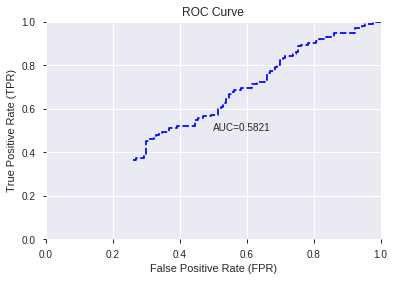

This function is available for GLM models only


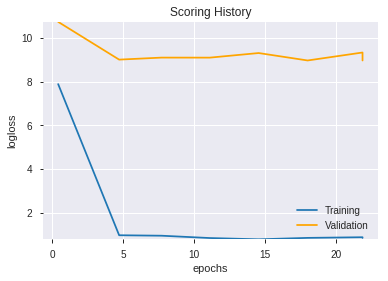

--2019-08-24 22:00:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.115.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.115.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


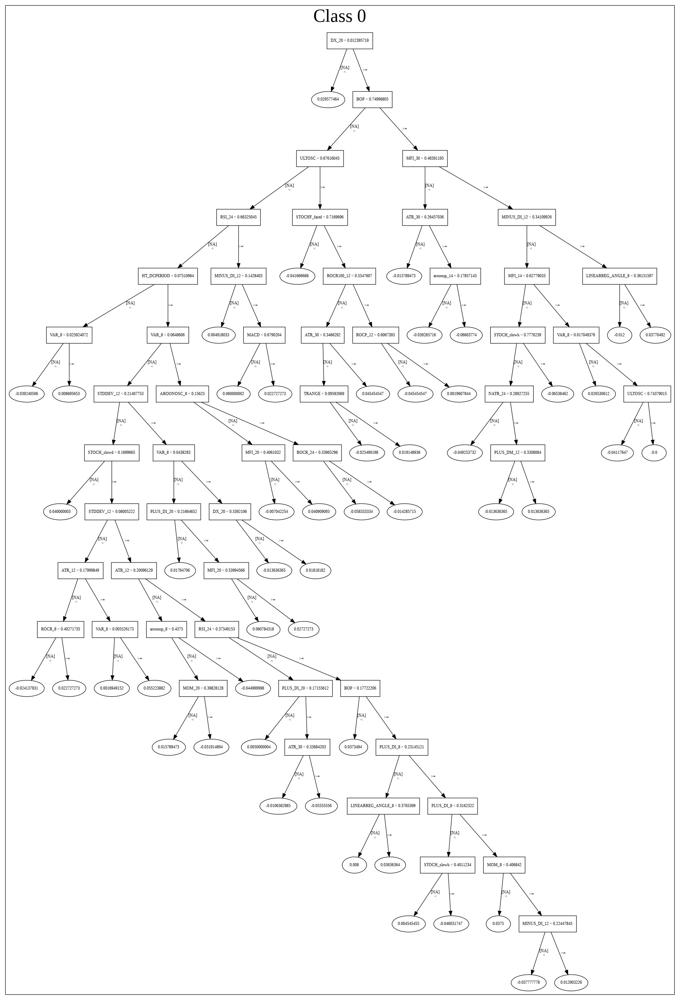

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_213117_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_213117_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['STOCHRSI_fastk',
 'SIN',
 'weekday',
 'COS',
 'BOP',
 'weekday_name',
 'CDLINNECK',
 'CDLTHRUSTING',
 'HT_TRENDMODE',
 'aroondown_20',
 'CDLSTICKSANDWICH',
 'SAREXT',
 'CDLKICKING',
 'CDLIDENTICAL3CROWS',
 'weekofyear',
 'aroondown_8',
 'BETA_20',
 'STOCH_slowk',
 'CDLADVANCEBLOCK',
 'STOCHRSI_fastd',
 'STOCHF_fastk',
 'aroondown_30',
 'aroonup_12',
 'aroonup_20',
 'AROONOSC_8',
 'aroonup_8',
 'CDLLONGLINE',
 'aroonup_24',
 'CDLPIERCING',
 'BETA_24',
 'aroondown_12',
 'CDLBELTHOLD',
 'HT_DCPERIOD',
 'TRANGE',
 'AROONOSC_20',
 'BETA_8',
 'aroondown_14',
 'CDLDOJI',
 'aroonup_30',
 'aroondown_24',
 'CDLMORNINGDOJISTAR',
 'CDLSPINNINGTOP',
 'CDL3LINESTRIKE',
 'BETA_30',
 'CDLEVENINGDOJISTAR',
 'BETA_12',
 'STOCHF_fastd',
 'TAN',
 'aroonup_14',
 'CDL2CROWS',
 'CDLLONGLEGGEDDOJI',
 'STOCH_slowd',
 'MFI_24',
 'ATR_30',
 'CORREL_24',
 'ADXR_8',
 'AROONOSC_12',
 'BETA_14',
 'CDLEVENINGSTAR',
 'CDLCOUNTERATTACK',
 'AROONOSC_24',
 'CORREL_20',
 'DIV',
 'CDLSEPARATINGLINES',
 'CDLHOMINGPIGEON',

In [51]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_220019_model_1,0.49107,6.064248,0.5,0.586869,0.344415


,variable,relative_importance,scaled_importance,percentage
0,CDLXSIDEGAP3METHODS,8.726079e-03,1.000000,1.258158e-02
1,CDLSTICKSANDWICH,7.801928e-03,0.894093,1.124911e-02
2,CDLMATCHINGLOW,7.470955e-03,0.856164,1.077190e-02
3,CDLTHRUSTING,6.934719e-03,0.794712,9.998734e-03
4,STOCHRSI_fastk,6.213162e-03,0.712022,8.958366e-03
5,CDLSHOOTINGSTAR,6.036951e-03,0.691829,8.704299e-03
6,CDLMARUBOZU,5.810226e-03,0.665846,8.377399e-03
7,CDLLADDERBOTTOM,5.720605e-03,0.655576,8.248179e-03
8,STOCHRSI_fastd,5.361068e-03,0.614373,7.729786e-03
9,HT_DCPERIOD,5.207213e-03,0.596741,7.507952e-03


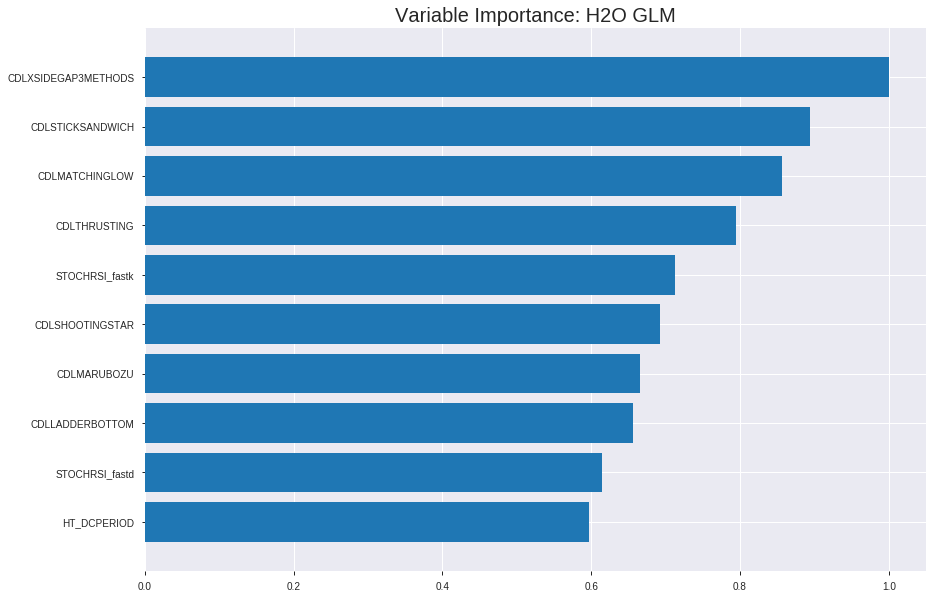

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_220019_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24596539008065987
RMSE: 0.4959489793120456
LogLoss: 0.6850335925318312
Null degrees of freedom: 1710
Residual degrees of freedom: 707
Null deviance: 2365.745433910457
Residual deviance: 2344.184953643926
AIC: 4352.184953643926
AUC: 0.584308337035879
pr_auc: 0.6205669884794968
Gini: 0.16861667407175807
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49021113854353865: 


,0,1,Error,Rate
0,39.0,765.0,0.9515,(765.0/804.0)
1,14.0,893.0,0.0154,(14.0/907.0)
Total,53.0,1658.0,0.4553,(779.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4902111,0.6962963,363.0
max f2,0.4705168,0.8505251,392.0
max f0point5,0.5074434,0.6016937,305.0
max accuracy,0.5265079,0.5657510,214.0
max precision,0.6079969,1.0,0.0
max recall,0.4705168,1.0,392.0
max specificity,0.6079969,1.0,0.0
max absolute_mcc,0.5452682,0.1295760,123.0
max min_per_class_accuracy,0.5296299,0.5597015,197.0
max mean_per_class_accuracy,0.5321044,0.5632573,186.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 53.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.5796703,1.8864388,1.8864388,1.0,0.5901762,1.0,0.5901762,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.5739374,1.5535378,1.7247441,0.8235294,0.5767181,0.9142857,0.5836394,0.0154355,0.0352811,55.3537843,72.4744054
,3,0.0303916,0.5702366,1.5535378,1.6687728,0.8235294,0.5715686,0.8846154,0.5796932,0.0154355,0.0507166,55.3537843,66.8772793
,4,0.0403273,0.5671660,0.7767689,1.4490037,0.4117647,0.5684598,0.7681159,0.5769255,0.0077178,0.0584344,-22.3231079,44.9003723
,5,0.0502630,0.5654909,1.4425709,1.4477321,0.7647059,0.5662884,0.7674419,0.5748228,0.0143330,0.0727674,44.2570854,44.7732109
,6,0.1005260,0.5589137,1.1625728,1.3051524,0.6162791,0.5618530,0.6918605,0.5683379,0.0584344,0.1312018,16.2572755,30.5152432
,7,0.1502046,0.5534314,1.0430897,1.2184780,0.5529412,0.5560258,0.6459144,0.5642658,0.0518192,0.1830209,4.3089695,21.8477986
,8,0.2004676,0.5497334,1.1845081,1.2099608,0.6279070,0.5514490,0.6413994,0.5610523,0.0595369,0.2425579,18.4508090,20.9960752
,9,0.3004091,0.5420484,1.0921488,1.1707665,0.5789474,0.5457904,0.6206226,0.5559749,0.1091510,0.3517089,9.2148784,17.0766498
,10,0.4003507,0.5354824,1.0259579,1.1346172,0.5438596,0.5385206,0.6014599,0.5516177,0.1025358,0.4542448,2.5957949,13.4617211




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.37673543887508654
RMSE: 0.6137877799981738
LogLoss: 9.07846301135824
Null degrees of freedom: 488
Residual degrees of freedom: -515
Null deviance: 674.0077116277507
Residual deviance: 170107.45106353427
AIC: 172115.45106353427
AUC: 0.55226413182954
pr_auc: 0.6013093249814734
Gini: 0.10452826365908008
Confusion Matrix (Act/Pred) for max f1 @ threshold = 1.126243755131885e-51: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.7080581,249.0
max f2,0.0000000,0.8584241,249.0
max f0point5,0.0000000,0.6025180,249.0
max accuracy,0.5010823,0.5480573,196.0
max precision,0.5843125,1.0,0.0
max recall,0.0000000,1.0,249.0
max specificity,0.5843125,1.0,0.0
max absolute_mcc,0.5010823,0.1175608,196.0
max min_per_class_accuracy,0.0000000,0.5410448,245.0
max mean_per_class_accuracy,0.5010823,0.5579287,196.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 26.01 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.5766432,1.8246269,1.8246269,1.0,0.5818563,1.0,0.5818563,0.0186567,0.0186567,82.4626866,82.4626866
,2,0.0204499,0.5714642,1.0947761,1.4597015,0.6,0.5744847,0.8,0.5781705,0.0111940,0.0298507,9.4776119,45.9701493
,3,0.0306748,0.5674606,0.3649254,1.0947761,0.2,0.5692930,0.6,0.5752114,0.0037313,0.0335821,-63.5074627,9.4776119
,4,0.0408998,0.5658847,1.0947761,1.0947761,0.6,0.5667296,0.6,0.5730909,0.0111940,0.0447761,9.4776119,9.4776119
,5,0.0511247,0.5648978,1.4597015,1.1677612,0.8,0.5655364,0.64,0.5715800,0.0149254,0.0597015,45.9701493,16.7761194
,6,0.1002045,0.5487587,1.1403918,1.1543558,0.625,0.5570714,0.6326531,0.5644737,0.0559701,0.1156716,14.0391791,15.4355772
,7,0.1513292,0.5391953,1.2407463,1.1835418,0.68,0.5438832,0.6486486,0.5575175,0.0634328,0.1791045,24.0746269,18.3541751
,8,0.2004090,0.5314572,0.9883396,1.1357371,0.5416667,0.5359777,0.6224490,0.5522424,0.0485075,0.2276119,-1.1660448,13.5737131
,9,0.3006135,0.5173209,1.0054066,1.0922936,0.5510204,0.5242322,0.5986395,0.5429057,0.1007463,0.3283582,0.5406640,9.2293634
,10,0.4008180,0.5015279,1.2288303,1.1264278,0.6734694,0.5102854,0.6173469,0.5347506,0.1231343,0.4514925,22.8830338,12.6427810



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 22:00:22,0.000 sec,2,.29E1,1004,1.3700672,347.8679981
,2019-08-24 22:00:24,1.745 sec,4,.21E1,1004,1.3669854,348.5183050
,2019-08-24 22:00:26,3.464 sec,6,.15E1,1004,1.3633460,349.2799260
,2019-08-24 22:00:27,5.195 sec,8,.11E1,1004,1.3591173,350.1268266
,2019-08-24 22:00:29,6.939 sec,10,.8E0,1004,1.3543379,351.0558080


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5591836734693878)

('F1', 0.6388888888888888)

('auc', 0.49107023411371237)

('logloss', 6.064248298103201)

('mean_per_class_error', 0.4650501672240802)

('rmse', 0.5868687495715387)

('mse', 0.3444149292236614)

glm prediction progress: |████████████████████████████████████████████████| 100%


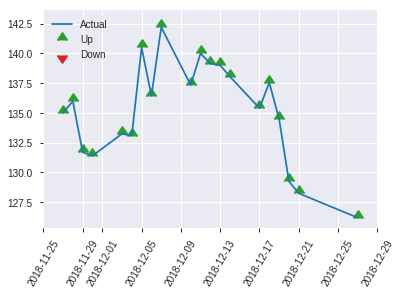


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.3444149292236614
RMSE: 0.5868687495715387
LogLoss: 6.064248298103201
Null degrees of freedom: 244
Residual degrees of freedom: -759
Null deviance: 342.33973069416305
Residual deviance: 47417.708146599696
AIC: 49425.708146599696
AUC: 0.49107023411371237
pr_auc: 0.4796335740318538
Gini: -0.017859531772575266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 3.2826697174296036e-62: 


,0,1,Error,Rate
0,0.0,130.0,1.0,(130.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,0.0,245.0,0.5306,(130.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0000000,0.6388889,175.0
max f2,0.0000000,0.8156028,175.0
max f0point5,0.0000000,0.5251142,175.0
max accuracy,0.5612913,0.5591837,22.0
max precision,0.5612913,0.6521739,22.0
max recall,0.0000000,1.0,175.0
max specificity,0.5865347,0.9923077,0.0
max absolute_mcc,0.5612913,0.1178898,22.0
max min_per_class_accuracy,0.5225227,0.4923077,122.0
max mean_per_class_accuracy,0.5595967,0.5349498,24.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 36.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.5784617,0.7101449,0.7101449,0.3333333,0.5838414,0.3333333,0.5838414,0.0086957,0.0086957,-28.9855072,-28.9855072
,2,0.0204082,0.5760990,1.0652174,0.8521739,0.5,0.5770257,0.4,0.5811151,0.0086957,0.0173913,6.5217391,-14.7826087
,3,0.0326531,0.5727807,1.4202899,1.0652174,0.6666667,0.5743610,0.5,0.5785823,0.0173913,0.0347826,42.0289855,6.5217391
,4,0.0408163,0.5703604,1.0652174,1.0652174,0.5,0.5720822,0.5,0.5772823,0.0086957,0.0434783,6.5217391,6.5217391
,5,0.0530612,0.5664620,0.7101449,0.9832776,0.3333333,0.5681655,0.4615385,0.5751784,0.0086957,0.0521739,-28.9855072,-1.6722408
,6,0.1020408,0.5586774,1.7753623,1.3634783,0.8333333,0.5628124,0.64,0.5692427,0.0869565,0.1391304,77.5362319,36.3478261
,7,0.1510204,0.5516102,0.8876812,1.2091657,0.4166667,0.5550803,0.5675676,0.5646495,0.0434783,0.1826087,-11.2318841,20.9165687
,8,0.2,0.5484349,0.3550725,1.0,0.1666667,0.5497379,0.4693878,0.5609977,0.0173913,0.2,-64.4927536,0.0
,9,0.3020408,0.5382913,1.1930435,1.0652174,0.56,0.5437623,0.5,0.5551749,0.1217391,0.3217391,19.3043478,6.5217391
,10,0.4,0.5316496,0.7989130,1.0,0.375,0.5350462,0.4693878,0.5502454,0.0782609,0.4,-20.1086957,0.0


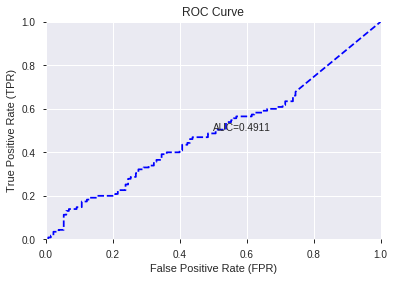

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


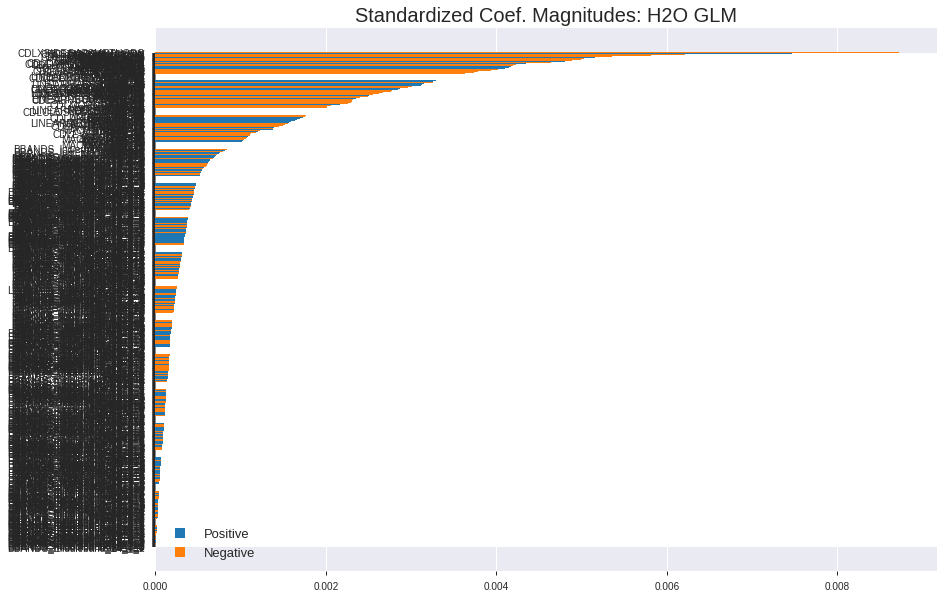

'log_likelihood'
--2019-08-24 22:00:48--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.112.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.112.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


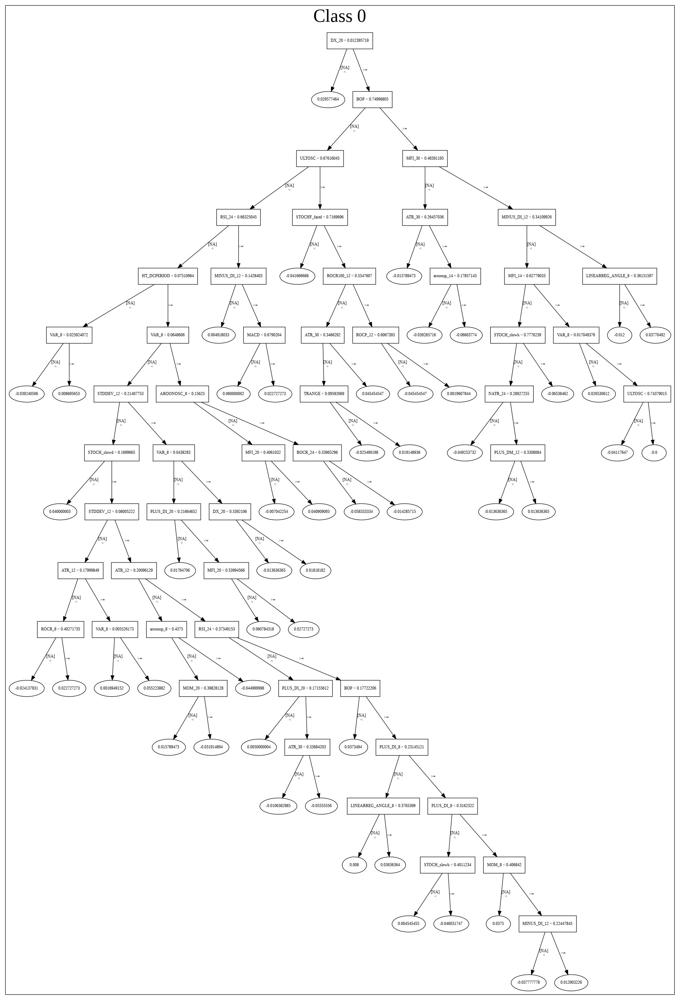

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_220019_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_220019_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['CDLXSIDEGAP3METHODS',
 'CDLSTICKSANDWICH',
 'CDLMATCHINGLOW',
 'CDLTHRUSTING',
 'STOCHRSI_fastk',
 'CDLSHOOTINGSTAR',
 'CDLMARUBOZU',
 'CDLLADDERBOTTOM',
 'STOCHRSI_fastd',
 'HT_DCPERIOD',
 'aroondown_12',
 'CDLHIKKAKEMOD',
 'CDLSPINNINGTOP',
 'CDLINNECK',
 'CDLHAMMER',
 'SAREXT',
 'CDLKICKING',
 'STOCH_slowk',
 'ADXR_8',
 'STOCHF_fastd',
 'CDLDARKCLOUDCOVER',
 'aroondown_8',
 'MFI_24',
 'CDLGAPSIDESIDEWHITE',
 'CDLLONGLEGGEDDOJI',
 'CDL3LINESTRIKE',
 'MACDEXT_hist',
 'CDLDOJISTAR',
 'CDLHANGINGMAN',
 'CDLHIGHWAVE',
 'weekday_name',
 'CDLCOUNTERATTACK',
 'TRANGE',
 'BETA_20',
 'ATAN',
 'aroonup_20',
 'CDLGRAVESTONEDOJI',
 'CDLTASUKIGAP',
 'CDL2CROWS',
 'CDLADVANCEBLOCK',
 'STOCH_slowd',
 'TAN',
 'STOCHF_fastk',
 'CDLDOJI',
 'LINEARREG_ANGLE_12',
 'weekofyear',
 'EXP',
 'COSH',
 'SINH',
 'CDLDRAGONFLYDOJI',
 'CDLBELTHOLD',
 'CDLIDENTICAL3CROWS',
 'BETA_24',
 'CORREL_30',
 'ADOSC',
 'ROCR100_24',
 'ROCR_24',
 'ROCP_24',
 'ROC_24',
 'DIV',
 'MFI_20',
 'LINEARREG_SLOPE_12',
 'HT_PHASOR_i

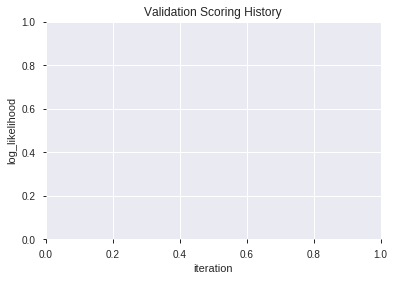

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_220056_model_2,0.521739,0.701040,0.496154,0.503898,0.253913
1,XGBoost_grid_1_AutoML_20190824_220056_model_3,0.505819,0.719430,0.500000,0.511954,0.262097
2,XGBoost_3_AutoML_20190824_220056,0.498194,0.709843,0.488462,0.508021,0.258085
3,XGBoost_2_AutoML_20190824_220056,0.487826,0.719469,0.496154,0.512438,0.262592
4,XGBoost_grid_1_AutoML_20190824_220056_model_7,0.487023,0.740217,0.500000,0.520977,0.271417
5,XGBoost_grid_1_AutoML_20190824_220056_model_6,0.483880,0.732716,0.496154,0.518047,0.268373
6,XGBoost_grid_1_AutoML_20190824_220056_model_5,0.481873,0.768026,0.496154,0.532371,0.283419
7,XGBoost_grid_1_AutoML_20190824_220056_model_4,0.481672,0.721172,0.496154,0.513421,0.263601
8,XGBoost_grid_1_AutoML_20190824_220056_model_1,0.480736,0.710535,0.470234,0.508395,0.258465
9,XGBoost_1_AutoML_20190824_220056,0.469498,0.725095,0.488462,0.515065,0.265292


,variable,relative_importance,scaled_importance,percentage
0,HT_DCPERIOD,182.095871,1.000000,0.029199
1,CORREL_8,131.293579,0.721013,0.021053
2,BETA_8,109.190269,0.599631,0.017508
3,STOCHRSI_fastd,107.729317,0.591608,0.017274
4,COS,97.977409,0.538054,0.015710
5,MINUS_DI_12,96.562935,0.530286,0.015484
6,STOCHRSI_fastk,95.973091,0.527047,0.015389
7,DIV,91.997536,0.505215,0.014752
8,TAN,88.428658,0.485616,0.014179
9,aroonup_24,83.714264,0.459726,0.013423


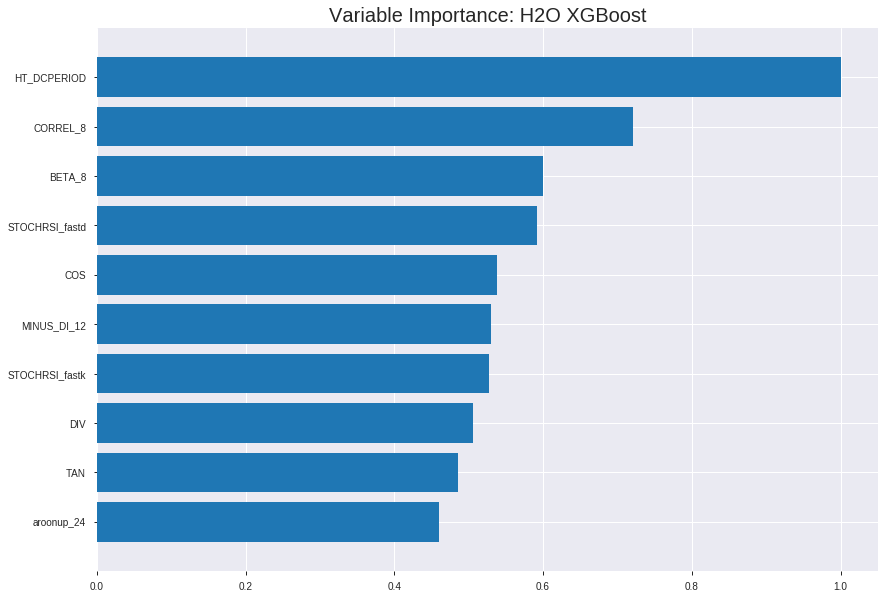

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_220056_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17906353855253904
RMSE: 0.4231589991392586
LogLoss: 0.5481127053035001
Mean Per-Class Error: 0.09287767337513086
AUC: 0.9663027201369119
pr_auc: 0.9707212627234225
Gini: 0.9326054402738237
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5207794507344564: 


,0,1,Error,Rate
0,730.0,74.0,0.092,(74.0/804.0)
1,85.0,822.0,0.0937,(85.0/907.0)
Total,815.0,896.0,0.0929,(159.0/1711.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5207795,0.9118136,199.0
max f2,0.4800656,0.9365719,244.0
max f0point5,0.5354486,0.9209598,185.0
max accuracy,0.5207795,0.9070719,199.0
max precision,0.7356734,1.0,0.0
max recall,0.3680121,1.0,367.0
max specificity,0.7356734,1.0,0.0
max absolute_mcc,0.5207795,0.8136802,199.0
max min_per_class_accuracy,0.5207795,0.9062845,199.0
max mean_per_class_accuracy,0.5207795,0.9071223,199.0


Gains/Lift Table: Avg response rate: 53.01 %, avg score: 52.67 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105202,0.7122934,1.8864388,1.8864388,1.0,0.7223107,1.0,0.7223107,0.0198456,0.0198456,88.6438809,88.6438809
,2,0.0204559,0.7019425,1.8864388,1.8864388,1.0,0.7067221,1.0,0.7147391,0.0187431,0.0385888,88.6438809,88.6438809
,3,0.0303916,0.6944896,1.8864388,1.8864388,1.0,0.6986103,1.0,0.7094663,0.0187431,0.0573319,88.6438809,88.6438809
,4,0.0403273,0.6857937,1.8864388,1.8864388,1.0,0.6891368,1.0,0.7044575,0.0187431,0.0760750,88.6438809,88.6438809
,5,0.0502630,0.6766329,1.8864388,1.8864388,1.0,0.6805850,1.0,0.6997385,0.0187431,0.0948181,88.6438809,88.6438809
,6,0.1005260,0.6584907,1.8864388,1.8864388,1.0,0.6667065,1.0,0.6832225,0.0948181,0.1896362,88.6438809,88.6438809
,7,0.1502046,0.6417770,1.8864388,1.8864388,1.0,0.6486822,1.0,0.6717987,0.0937155,0.2833517,88.6438809,88.6438809
,8,0.2004676,0.6251663,1.8864388,1.8864388,1.0,0.6334248,1.0,0.6621772,0.0948181,0.3781698,88.6438809,88.6438809
,9,0.3004091,0.5945776,1.8754070,1.8827687,0.9941520,0.6105854,0.9980545,0.6450134,0.1874311,0.5656009,87.5407003,88.2768695
,10,0.4003507,0.5655316,1.6658027,1.8286064,0.8830409,0.5808678,0.9693431,0.6290004,0.1664829,0.7320838,66.5802691,82.8606379




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2531929782983503
RMSE: 0.5031828477783701
LogLoss: 0.6998073205465077
Mean Per-Class Error: 0.4719811575606132
AUC: 0.5083406496927129
pr_auc: 0.5399783674382406
Gini: 0.01668129938542573
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33938461542129517: 


,0,1,Error,Rate
0,0.0,221.0,1.0,(221.0/221.0)
1,0.0,268.0,0.0,(0.0/268.0)
Total,0.0,489.0,0.4519,(221.0/489.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3393846,0.7080581,399.0
max f2,0.3393846,0.8584241,399.0
max f0point5,0.4051761,0.6117021,364.0
max accuracy,0.4051761,0.5664622,364.0
max precision,0.6727939,0.6666667,2.0
max recall,0.3393846,1.0,399.0
max specificity,0.6775472,0.9954751,0.0
max absolute_mcc,0.4051761,0.0966796,364.0
max min_per_class_accuracy,0.5168791,0.5074627,191.0
max mean_per_class_accuracy,0.4203521,0.5280188,347.0


Gains/Lift Table: Avg response rate: 54.81 %, avg score: 51.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102249,0.6574226,0.7298507,0.7298507,0.4,0.6698182,0.4,0.6698182,0.0074627,0.0074627,-27.0149254,-27.0149254
,2,0.0204499,0.6405341,0.3649254,0.5473881,0.2,0.6469330,0.3,0.6583756,0.0037313,0.0111940,-63.5074627,-45.2611940
,3,0.0306748,0.6362570,0.7298507,0.6082090,0.4,0.6380800,0.3333333,0.6516104,0.0074627,0.0186567,-27.0149254,-39.1791045
,4,0.0408998,0.6295257,1.0947761,0.7298507,0.6,0.6323434,0.4,0.6467937,0.0111940,0.0298507,9.4776119,-27.0149254
,5,0.0511247,0.6239244,1.4597015,0.8758209,0.8,0.6257688,0.48,0.6425887,0.0149254,0.0447761,45.9701493,-12.4179104
,6,0.1002045,0.6033741,0.6842351,0.7819829,0.375,0.6129928,0.4285714,0.6280928,0.0335821,0.0783582,-31.5764925,-21.8017058
,7,0.1513292,0.5888046,1.4597015,1.0109419,0.8,0.5943058,0.5540541,0.6166782,0.0746269,0.1529851,45.9701493,1.0941912
,8,0.2004090,0.5736447,0.9123134,0.9867880,0.5,0.5809829,0.5408163,0.6079365,0.0447761,0.1977612,-8.7686567,-1.3212001
,9,0.3006135,0.5554664,1.0798812,1.0178191,0.5918367,0.5639257,0.5578231,0.5932662,0.1082090,0.3059701,7.9881206,1.7819068
,10,0.4008180,0.5383562,0.9681694,1.0054066,0.5306122,0.5465851,0.5510204,0.5815960,0.0970149,0.4029851,-3.1830643,0.5406640



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 22:01:11,2.236 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4699006,0.5,0.6931472,0.5,0.0,1.0,0.4519427
,2019-08-24 22:01:11,2.824 sec,5.0,0.4904510,0.6742128,0.8091057,0.8136353,1.7355237,0.2741087,0.4993650,0.6918753,0.4968765,0.5440017,1.4191542,0.4498978
,2019-08-24 22:01:11,3.041 sec,10.0,0.4820787,0.6578583,0.8718378,0.8873726,1.8864388,0.2162478,0.4994796,0.6921060,0.5072432,0.5492262,1.0947761,0.4478528
,2019-08-24 22:01:12,3.252 sec,15.0,0.4739522,0.6421931,0.9023529,0.9136111,1.8864388,0.1741672,0.4998377,0.6928221,0.5018235,0.5496306,1.0947761,0.4478528
,2019-08-24 22:01:12,3.455 sec,20.0,0.4648676,0.6248994,0.9231187,0.9311310,1.8864388,0.1531268,0.5003587,0.6938945,0.5057152,0.5373947,1.0947761,0.4519427
,2019-08-24 22:01:12,3.667 sec,25.0,0.4574314,0.6108868,0.9305759,0.9386580,1.8864388,0.1367621,0.5013091,0.6958170,0.5009877,0.5376099,0.7298507,0.4519427
,2019-08-24 22:01:12,3.874 sec,30.0,0.4489869,0.5951526,0.9404308,0.9470916,1.8864388,0.1297487,0.5018819,0.6969846,0.4964291,0.5346321,1.0947761,0.4458078
,2019-08-24 22:01:12,4.073 sec,35.0,0.4422429,0.5827232,0.9495206,0.9551654,1.8864388,0.1186441,0.5024451,0.6981658,0.4980415,0.5342562,1.0947761,0.4519427
,2019-08-24 22:01:13,4.272 sec,40.0,0.4354354,0.5702872,0.9561975,0.9617601,1.8864388,0.1081239,0.5032487,0.6998369,0.4969018,0.5344660,0.7298507,0.4519427
,2019-08-24 22:01:13,4.463 sec,45.0,0.4294999,0.5595154,0.9613557,0.9664211,1.8864388,0.1022794,0.5041043,0.7016409,0.4970706,0.5318005,0.7298507,0.4519427


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_DCPERIOD,182.0958710,1.0,0.0291986
CORREL_8,131.2935791,0.7210135,0.0210526
BETA_8,109.1902695,0.5996307,0.0175084
STOCHRSI_fastd,107.7293167,0.5916077,0.0172741
COS,97.9774094,0.5380540,0.0157104
---,---,---,---
BBANDS_lowerband_8_0_4,0.4430143,0.0024329,0.0000710
BBANDS_lowerband_8_5_3,0.4076822,0.0022388,0.0000654
BBANDS_upperband_14_5_4,0.3731303,0.0020491,0.0000598
T3_8_0,0.1077497,0.0005917,0.0000173



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5591836734693878)

('F1', 0.6406685236768803)

('auc', 0.5217391304347826)

('logloss', 0.7010395936186082)

('mean_per_class_error', 0.45852842809364547)

('rmse', 0.5038979578366459)

('mse', 0.25391315191194225)

xgboost prediction progress: |████████████████████████████████████████████| 100%


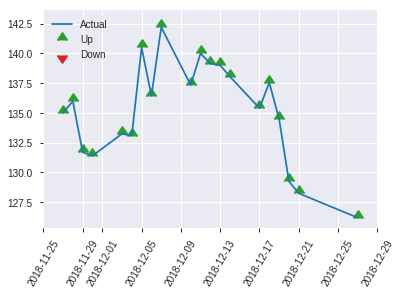


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25391315191194225
RMSE: 0.5038979578366459
LogLoss: 0.7010395936186082
Mean Per-Class Error: 0.45852842809364547
AUC: 0.5217391304347826
pr_auc: 0.500111042915527
Gini: 0.04347826086956519
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3770919442176819: 


,0,1,Error,Rate
0,1.0,129.0,0.9923,(129.0/130.0)
1,0.0,115.0,0.0,(0.0/115.0)
Total,1.0,244.0,0.5265,(129.0/245.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3770919,0.6406685,243.0
max f2,0.3770919,0.8167614,243.0
max f0point5,0.4591868,0.5399792,211.0
max accuracy,0.5875857,0.5591837,50.0
max precision,0.6791900,1.0,0.0
max recall,0.3770919,1.0,243.0
max specificity,0.6791900,1.0,0.0
max absolute_mcc,0.6474469,0.1155470,5.0
max min_per_class_accuracy,0.5440605,0.5,122.0
max mean_per_class_accuracy,0.5875857,0.5414716,50.0


Gains/Lift Table: Avg response rate: 46.94 %, avg score: 53.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0122449,0.6560715,1.4202899,1.4202899,0.6666667,0.6653360,0.6666667,0.6653360,0.0173913,0.0173913,42.0289855,42.0289855
,2,0.0204082,0.6476553,2.1304348,1.7043478,1.0,0.6520027,0.8,0.6600026,0.0173913,0.0347826,113.0434783,70.4347826
,3,0.0326531,0.6375211,1.4202899,1.5978261,0.6666667,0.6411845,0.75,0.6529459,0.0173913,0.0521739,42.0289855,59.7826087
,4,0.0408163,0.6327444,0.0,1.2782609,0.0,0.6359279,0.6,0.6495423,0.0,0.0521739,-100.0,27.8260870
,5,0.0530612,0.6228086,2.1304348,1.4749164,1.0,0.6283595,0.6923077,0.6446539,0.0260870,0.0782609,113.0434783,47.4916388
,6,0.1020408,0.6063731,0.7101449,1.1078261,0.3333333,0.6121828,0.52,0.6290678,0.0347826,0.1130435,-28.9855072,10.7826087
,7,0.1510204,0.5968584,1.0652174,1.0940071,0.5,0.6007420,0.5135135,0.6198811,0.0521739,0.1652174,6.5217391,9.4007051
,8,0.2,0.5884035,1.4202899,1.1739130,0.6666667,0.5921816,0.5510204,0.6130975,0.0695652,0.2347826,42.0289855,17.3913043
,9,0.3020408,0.5687371,0.5965217,0.9788484,0.28,0.5785122,0.4594595,0.6014133,0.0608696,0.2956522,-40.3478261,-2.1151586
,10,0.4,0.5590770,1.3315217,1.0652174,0.625,0.5630860,0.5,0.5920270,0.1304348,0.4260870,33.1521739,6.5217391


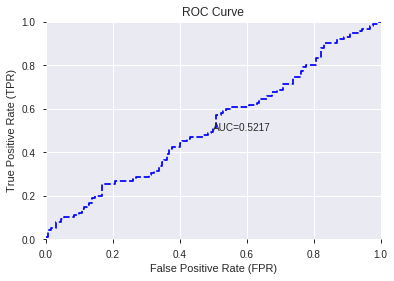

This function is available for GLM models only


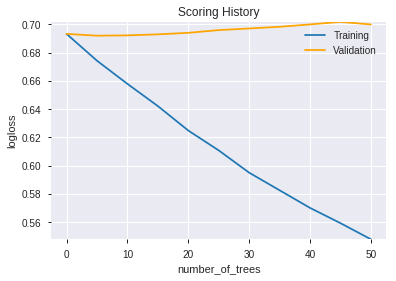

--2019-08-24 22:01:37--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.39.188
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.39.188|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

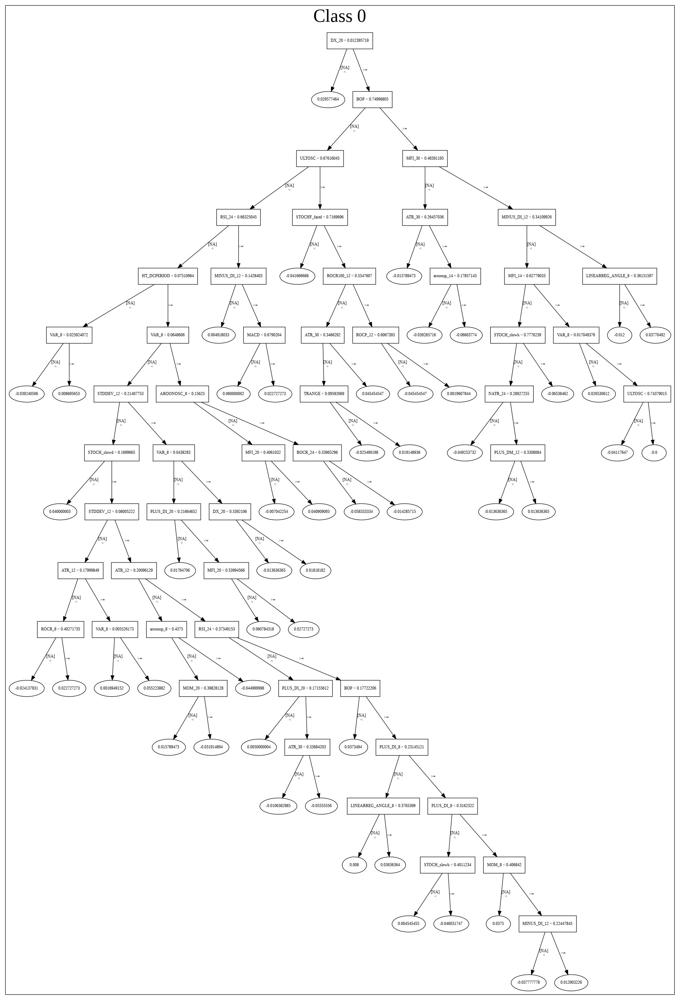

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_220056_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_220056_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_a456',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['HT_DCPERIOD',
 'CORREL_8',
 'BETA_8',
 'STOCHRSI_fastd',
 'COS',
 'MINUS_DI_12',
 'STOCHRSI_fastk',
 'DIV',
 'TAN',
 'aroonup_24',
 'CORREL_12',
 'ADOSC',
 'HT_PHASOR_inphase',
 'CORREL_14',
 'TRANGE',
 'CMO_24',
 'OBV',
 'BETA_14',
 'PLUS_DI_8',
 'BOP',
 'BETA_24',
 'SIN',
 'HT_PHASOR_quadrature',
 'DX_30',
 'STDDEV_14',
 'ADX_8',
 'MINUS_DI_8',
 'MACDEXT_hist',
 'ADXR_8',
 'STDDEV_8',
 'MFI_24',
 'BETA_30',
 'BETA_20',
 'CORREL_30',
 'CCI_8',
 'MFI_12',
 'BETA_12',
 'NATR_8',
 'CORREL_20',
 'DX_8',
 'aroondown_12',
 'ULTOSC',
 'STOCHF_fastk',
 'CORREL_24',
 'WILLR_14',
 'LINEARREG_ANGLE_20',
 'DX_14',
 'MFI_8',
 'MFI_20',
 'WILLR_24',
 'LINEARREG_ANGLE_8',
 'STOCH_slowd',
 'STDDEV_12',
 'ROC_24',
 'MINUS_DM_20',
 'VAR_8',
 'STOCH_slowk',
 'CCI_20',
 'ATR_8',
 'MINUS_DI_24',
 'MACDFIX_8',
 'CMO_20',
 'aroondown_8',
 'PLUS_DM_30',
 'SUB',
 'MOM_14',
 'AROONOSC_24',
 'STDDEV_20',
 'PLUS_DI_20',
 'ATR_30',
 'PLUS_DM_12',
 'MINUS_DI_20',
 'TRIX_12',
 'MACDFIX_hist_20',
 'NATR_20',
 'MOM

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [54]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.600
GLM             0.563
XGBoost         0.576
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.600,0.559,0.547
DLF,0.584,0.563,0.576
Fwe,0.580,0.559,0.547
RFE,0.584,0.559,0.559
XGBF,0.571,0.563,0.576






F1


DeepLearning    0.659
GLM             0.639
XGBoost         0.642
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.659,0.639,0.642
DLF,0.639,0.639,0.639
Fwe,0.648,0.639,0.642
RFE,0.650,0.639,0.641
XGBF,0.639,0.639,0.639






auc


DeepLearning    0.592
GLM             0.493
XGBoost         0.543
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.592,0.493,0.512
DLF,0.566,0.488,0.543
Fwe,0.583,0.493,0.512
RFE,0.582,0.491,0.522
XGBF,0.570,0.488,0.543






logloss


DeepLearning    6.101
GLM             6.076
XGBoost         0.709
dtype: float64

,DeepLearning,GLM,XGBoost
All,6.101,6.063,0.709
DLF,5.385,6.076,0.698
Fwe,5.347,6.063,0.709
RFE,5.755,6.064,0.701
XGBF,5.555,6.076,0.698






mean_per_class_error


DeepLearning    0.424
GLM             0.465
XGBoost         0.459
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.403,0.463,0.438
DLF,0.415,0.461,0.439
Fwe,0.424,0.463,0.438
RFE,0.423,0.465,0.459
XGBF,0.424,0.461,0.439






rmse


DeepLearning    0.682
GLM             0.587
XGBoost         0.508
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.682,0.587,0.508
DLF,0.577,0.587,0.502
Fwe,0.614,0.587,0.508
RFE,0.659,0.587,0.504
XGBF,0.597,0.587,0.502






mse


DeepLearning    0.465
GLM             0.345
XGBoost         0.258
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.465,0.344,0.258
DLF,0.333,0.345,0.252
Fwe,0.377,0.344,0.258
RFE,0.434,0.344,0.254
XGBF,0.356,0.345,0.252


{'F1':       DeepLearning    GLM  XGBoost
 All          0.659    NaN      NaN
 DLF          0.639    NaN      NaN
 DLF            NaN  0.639      NaN
 DLF            NaN    NaN    0.639
 All            NaN  0.639      NaN
 All            NaN    NaN    0.642
 XGBF         0.639    NaN      NaN
 XGBF           NaN  0.639      NaN
 XGBF           NaN    NaN    0.639
 Fwe          0.648    NaN      NaN
 Fwe            NaN  0.639      NaN
 Fwe            NaN    NaN    0.642
 RFE          0.650    NaN      NaN
 RFE            NaN  0.639      NaN
 RFE            NaN    NaN    0.641,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.600    NaN      NaN
 DLF          0.584    NaN      NaN
 DLF            NaN  0.563      NaN
 DLF            NaN    NaN    0.576
 All            NaN  0.559      NaN
 All            NaN    NaN    0.547
 XGBF         0.571    NaN      NaN
 XGBF           NaN  0.563      NaN
 XGBF           NaN    NaN    0.576
 Fwe          0.580    NaN      NaN
 Fwe     